# INSTALLING DEPENDENCIES

In [2]:
!pip install --upgrade gensim
!pip install pyldavis==3.4.1
!pip install Sastrawi
!pip install swifter
!pip install matplotlib
!pip install torch
!pip install requests
!pip install beautifulsoup4
!pip install selenium
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 52.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.7/209.7 kB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 42.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of dask-expr to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 241.9/241.9 kB 17.8 MB/s eta 0:00:00
  Created wheel for swifter: filename=swifter-1.4.0-py3-none-any.whl size=16506 sha256=ba23ddeb27251932dce57c8c15bbadf81026a4e8ee91275022dfab7af0925f40
  Stored in directory: /root/.cache/pip/wheels/e4/cf/51/0904952972ee2c7aa3709437065278dc534ec1b8d2ad41b443
Successfully built swifter
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.6/9.6 MB 111.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 476.0/476.0 kB 32.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/5

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import pandas as pd
import numpy as np
import re
import string
import nltk
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from nltk.corpus import stopwords
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
import swifter
import gensim
from gensim import corpora, models
from gensim.models import Phrases, CoherenceModel
from transformers import pipeline, AutoTokenizer, AutoModelForTokenClassification
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from nltk.util import ngrams
from collections import defaultdict, Counter

# DATA FILTERING

In [21]:
import pandas as pd
import re

# Load your dataset (replace with your actual path)
df = pd.read_csv('/content/drive/MyDrive/THESIS/READY.csv')

# Ensure all entries are strings and Date are date
df['URL'] = df['URL'].fillna('').astype(str)
df['Title'] = df['Title'].fillna('').astype(str)
df['Summary'] = df['Summary'].fillna('').astype(str)
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# Define a list of base URLs to match against
base_urls = [
    r'.*detik.com.*',
    r'.*kompas.com.*',
    r'.*cnnindonesia.com.*',
    r'.*tribunnews.com.*',
    r'.*metrotvnews.com.*',
    r'.*tvonenews.com.*',
    r'.*liputan6.com.*',
    r'.*kumparan.com.*',
    r'.*viva.co.id.*',
    r'.*tempo.co.*',
    r'.*okezone.com.*',
    r'.*idntimes.com.*',
    r'.*sindonews.com.*',
    r'.*merdeka.com.*',
    r'.*bbc.com.*',
    r'.*jawapos.com.*'
]

# Filter the DataFrame to only include rows with URLs matching the base URLs
df['URL'] = df['URL'].fillna('').astype(str)
df = df[df['URL'].apply(lambda url: any(re.match(base_url, url) for base_url in base_urls))]

# Further filter rows to only include those with specific keywords in the Summary column
keywords = ['IKN', 'nusantara', 'pembangunan', 'ibukota', 'ibu kota', 'pindah', 'pemindahan', 'penajam']
df = df[df['Title'].str.contains('|'.join(keywords), case=False, na=False) | df['Summary'].str.contains('|'.join(keywords), case=False, na=False)]

# Display the shape of the filtered DataFrame
print("Number of rows after filtering:", df.shape[0])

# Initialize a dictionary to count occurrences
url_counts = {base_url: 0 for base_url in base_urls}

# Filter the DataFrame to only include rows with URLs matching the base URLs and count each base URL
filtered_df = df[df['URL'].apply(lambda url: any(re.match(base_url, url) for base_url in base_urls))]
for url in filtered_df['URL']:
    for base_url in base_urls:
        if re.match(base_url, url):
            url_counts[base_url] += 1
            break

# Initialize a dictionary to count occurrences
url_counts = {base_url: 0 for base_url in base_urls}

# Count the number of articles for each base URL
for url in df['URL']:
    for base_url in base_urls:
        if re.match(base_url, url):
            url_counts[base_url] += 1
            break

# Calculate the total number of articles
total_articles = df.shape[0]

# Display URL counts and total number of articles
print("Number of extracted news per base URL:")
for base_url, count in url_counts.items():
    print(f"{base_url}: {count}")
print(f"Total number of articles: {total_articles}")

# Combine title and summary for better context
df['Summary'] = df['Summary'].fillna('').astype(str)
df['Text'] = df['Title'] + " " + df['Summary']


Number of rows after filtering: 39867
Number of extracted news per base URL:
.*detik.com.*: 3925
.*kompas.com.*: 4603
.*cnnindonesia.com.*: 1650
.*tribunnews.com.*: 11679
.*metrotvnews.com.*: 552
.*tvonenews.com.*: 441
.*liputan6.com.*: 2299
.*kumparan.com.*: 1274
.*viva.co.id.*: 1206
.*tempo.co.*: 3155
.*okezone.com.*: 2284
.*idntimes.com.*: 1236
.*sindonews.com.*: 1458
.*merdeka.com.*: 1916
.*bbc.com.*: 18
.*jawapos.com.*: 2171
Total number of articles: 39867


# INITIAL EDA

In [12]:
# Create Title_WordCount and Summary_WordCount columns
df['Title_WordCount'] = df['Cleaned_Title'].str.split().str.len()
df['Summary_WordCount'] = df['Cleaned_Summary'].str.split().str.len()

# 0. Checking for duplicates
duplicates = df.duplicated()
print(f"Number of duplicate rows: {duplicates.sum()}")

# 2. Print some basic statistics
print("Total number of articles:", len(df))
print("Date range:", df['Date'].min().date(), "to", df['Date'].max().date())
print("Basic statistics of Cleaned Title word counts:")
print(df['Title_WordCount'].describe())
print("Basic statistics of Cleaned Summary word counts:")
print(df['Summary_WordCount'].describe())

# 3. Number of unique URLs
unique_urls = df['URL'].nunique()
print(f"Number of unique URLs: {unique_urls}")

# 4. Number of unique Titles
unique_titles = df['Title'].nunique()
print(f"Number of unique Titles: {unique_titles}")

# 5. Number of unique Summaries
unique_summaries = df['Cleaned_Summary'].nunique()
print(f"Number of unique Summaries: {unique_summaries}")

# 6. Extract duplicated titles
duplicated_titles = df[df.duplicated(subset='Title', keep=False)]
duplicated_titles_examples = duplicated_titles['Title'].drop_duplicates().head(10)
print("10 Examples of Duplicated Titles:")
print(duplicated_titles_examples.to_list())

# 7. Extract duplicated summaries
duplicated_summaries = df[df.duplicated(subset='Cleaned_Summary', keep=False)]
duplicated_summaries_examples = duplicated_summaries['Cleaned_Summary'].drop_duplicates().head(10)
print("\n10 Examples of Duplicated Summaries:")
print(duplicated_summaries_examples.to_list())

# Ensure all entries in 'Cleaned_Title' and 'Cleaned_Summary' are strings and Date are date
df['Cleaned_Title'] = df['Cleaned_Title'].fillna('').astype(str)
df['Cleaned_Summary'] = df['Cleaned_Summary'].fillna('').astype(str)
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

Number of duplicate rows: 0
Total number of articles: 39867
Date range: 2020-01-01 to 2023-12-31
Basic statistics of Cleaned Title word counts:
count    39867.000000
mean         8.278300
std          2.253941
min          1.000000
25%          7.000000
50%          8.000000
75%         10.000000
max         30.000000
Name: Title_WordCount, dtype: float64
Basic statistics of Cleaned Summary word counts:
count    39863.000000
mean        52.572536
std         17.665608
min          1.000000
25%         41.000000
50%         51.000000
75%         61.000000
max        880.000000
Name: Summary_WordCount, dtype: float64
Number of unique URLs: 39867
Number of unique Titles: 39846
Number of unique Summaries: 39114
10 Examples of Duplicated Titles:
['Presiden Jokowi Groundbreaking Kantor BPJS Ketenagakerjaan di IKN', 'Bambang Brodjonegoro Ditunjuk Jadi Ketua Tim Penasihat Transisi IKN', 'Siap-siap, ASN Bertugas di DKI Jakarta Mulai Dimutasi Tahun Ini ke IKN', 'Biaya Bangun Infrastruktur Dasar 

In [13]:
# Function to extract source based on the base_urls patterns
def extract_source(url):
    for pattern in base_urls:
        if re.search(pattern, url):
            return pattern.split(r'.*')[1]  # Extract the domain from the regex pattern
    return 'Other'

# Apply the function to create a new column 'Source'
df['Source'] = df['URL'].apply(extract_source)

# Identify duplicates
duplicates_url = df[df.duplicated(subset=['URL'], keep=False)]
duplicates_title = df[df.duplicated(subset=['Title'], keep=False)]
duplicates_summary = df[df.duplicated(subset=['Summary'], keep=False)]

# Create an empty DataFrame for the final table
summary_table = pd.DataFrame(columns=['Base URL', 'Duplicate URL', 'Duplicate Title', 'Duplicate Summary'])

# Create a list to store each row of data
rows = []

# Fill the table with counts of duplicates
for base_url in base_urls:
    source = base_url.split(r'.*')[1]
    duplicate_url_count = duplicates_url[duplicates_url['Source'] == source].shape[0]
    duplicate_title_count = duplicates_title[duplicates_title['Source'] == source].shape[0]
    duplicate_summary_count = duplicates_summary[duplicates_summary['Source'] == source].shape[0]

    rows.append({
        'Base URL': base_url,
        'Duplicate URL': duplicate_url_count,
        'Duplicate Title': duplicate_title_count,
        'Duplicate Summary': duplicate_summary_count
    })

# Convert the list of rows into a DataFrame
summary_table = pd.DataFrame(rows)

# Display the final table
print(summary_table)


                Base URL  Duplicate URL  Duplicate Title  Duplicate Summary
0          .*detik.com.*              0                1                166
1         .*kompas.com.*              0               10                159
2   .*cnnindonesia.com.*              0               17                 25
3     .*tribunnews.com.*              0                3                297
4    .*metrotvnews.com.*              0                0                 31
5      .*tvonenews.com.*              0                1                  5
6       .*liputan6.com.*              0                1                 42
7       .*kumparan.com.*              0                1                 30
8         .*viva.co.id.*              0                1                 12
9           .*tempo.co.*              0                4                183
10       .*okezone.com.*              0                0                 33
11      .*idntimes.com.*              0                1                  4
12     .*sin

In [15]:
# Identify duplicates across Title and Summary
duplicates_title = df[df.duplicated(subset=['Title'], keep=False)]
duplicates_summary = df[df.duplicated(subset=['Summary'], keep=False)]

# Combine the duplicates in Title and Summary
duplicates_combined = pd.concat([duplicates_title, duplicates_summary]).drop_duplicates()

# Select only the relevant columns
duplicates_combined = duplicates_combined[['Date', 'URL', 'Title', 'Summary']]

# Save the result to a CSV file
output_file_path = 'duplicates_dataset.csv'
duplicates_combined.to_csv(output_file_path, index=False)

print(f"Dataset of duplicates saved to {output_file_path}")

Dataset of duplicates saved to duplicates_dataset.csv


# PREPROCESS

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import numpy as np
import re
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory

# Download stopwords
nltk.download('stopwords')

# Load the data
df = pd.read_csv('/content/drive/MyDrive/THESIS/READY.csv')

# Get the Indonesian stopwords
stop_words = set(stopwords.words('indonesian'))

# Initialize the Sastrawi Stemmer
factory = StemmerFactory()
stemmer = factory.create_stemmer()

# Function to remove or replace specific HTML entities and convert dashes to spaces
def clean_html_entities(text):
    if pd.isna(text):
        return text

    # Replace specific HTML entities with their intended characters
    replacements = {
        '&#x201d;': '"',    # Double quotation mark
        '&#x201c;': '"',    # Double quotation mark
        '&ndash;': ' ',     # En dash (converted to space)
        '&#x2019;': "'",    # Single quotation mark
        '&#x2018;': "'",    # Single quotation mark
        '&#58;': ':',       # Colon
        '&#39;': "'",       # Apostrophe
        '&quot;': '"',      # Double quotation mark
        '&#x2013;': ' ',    # En dash (converted to space)
    }

    for entity, replacement in replacements.items():
        text = text.replace(entity, replacement)

    # Convert regular dashes to spaces
    text = text.replace('-', ' ')

    # Remove any other HTML entities that might be left
    text = re.sub(r'&[a-zA-Z0-9#]+;', '', text)

    return text

# Function to clean text: remove special characters, numbers, and stopwords, and lowercase the text
def clean_text(text):
    # First, apply the HTML entity cleaner
    text = clean_html_entities(text)

    # Convert to lowercase
    text = text.lower()

    # Remove special characters and numbers
    text = re.sub(r'\d+', '', text)  # Remove numbers
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation and special characters
    text = re.sub(r'\s+', ' ', text).strip()  # Remove excess whitespace

    # Remove stopwords
    words = text.split()
    words_cleaned = [word for word in words if word not in stop_words]

    return ' '.join(words_cleaned)

# Apply the clean_text function to relevant columns
df['Cleaned_Title'] = df['Title'].apply(clean_text)
df['Cleaned_Summary'] = df['Summary'].apply(clean_text)

# Combine the cleaned title and summary into a new column called 'Text'
df['Text'] = df['Cleaned_Title'] + " " + df['Cleaned_Summary']

# Create a new column with the non-lemmatized text
df['Text_NonLemmatized'] = df['Text']

# Tokenize the non-lemmatized text
df['text_tokenised'] = df['Text_NonLemmatized'].apply(lambda x: x.split())

# Lemmatize (Stem) the Text column
df['Text_Lemmatized'] = df['Text'].apply(lambda x: stemmer.stem(x))

# Tokenize the lemmatized text
df['text_tokenised_stemmed'] = df['Text_Lemmatized'].apply(lambda x: x.split())

# Select only the required columns
df = df[['Date', 'URL', 'Title', 'Cleaned_Title', 'Summary', 'Cleaned_Summary', 'Text', 'text_tokenised', 'text_tokenised_stemmed']]

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


                                                Text  \
0  politisi demokrat jokowi pikir pindah kota uta...   
1  hmi cabang kukar ingatkan warga menjual lahan ...   
2  sejarah pemindahan kota yogyakarta tepatnya ja...   
3  luhut rapat menteri pupr juara sayembara kota ...   
4  luhut panggil pemenang sayembara desain kota m...   

                                     Text_Lemmatized  \
0  politis demokrat jokowi pikir pindah kota utan...   
1  hmi cabang kukar ingat warga jual lahan spekul...   
2  sejarah pindah kota yogyakarta tepat januari k...   
3  luhut rapat menteri pupr juara sayembara kota ...   
4  luhut panggil menang sayembara desain kota men...   

                              text_tokenised_stemmed  
0  [politis, demokrat, jokowi, pikir, pindah, kot...  
1  [hmi, cabang, kukar, ingat, warga, jual, lahan...  
2  [sejarah, pindah, kota, yogyakarta, tepat, jan...  
3  [luhut, rapat, menteri, pupr, juara, sayembara...  
4  [luhut, panggil, menang, sayembara, desain, ko..

# SECOND EDA

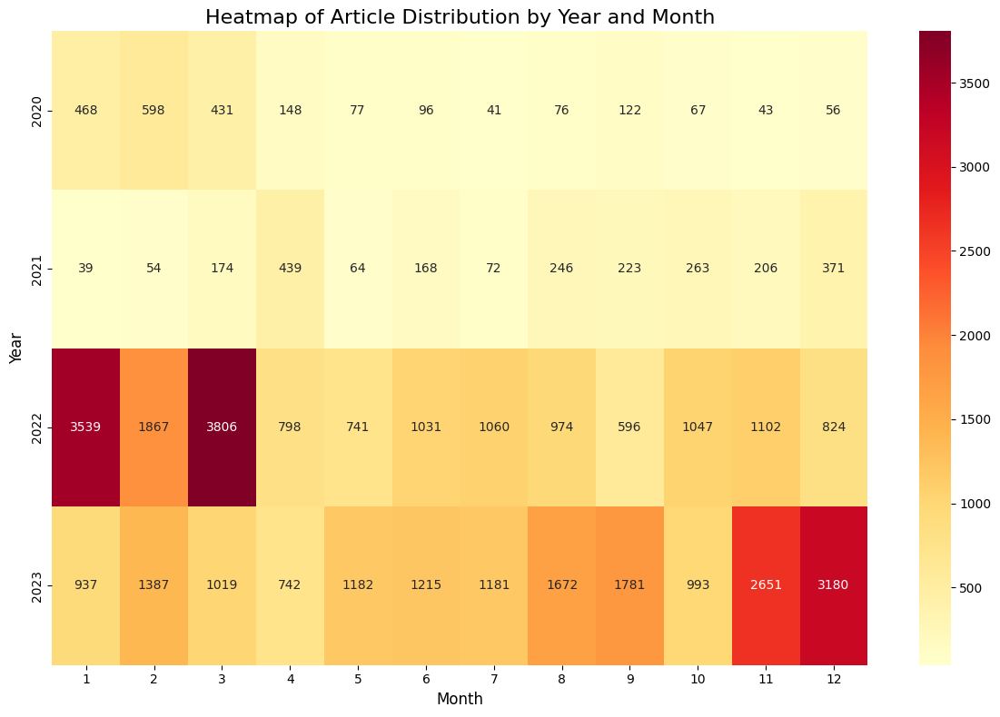

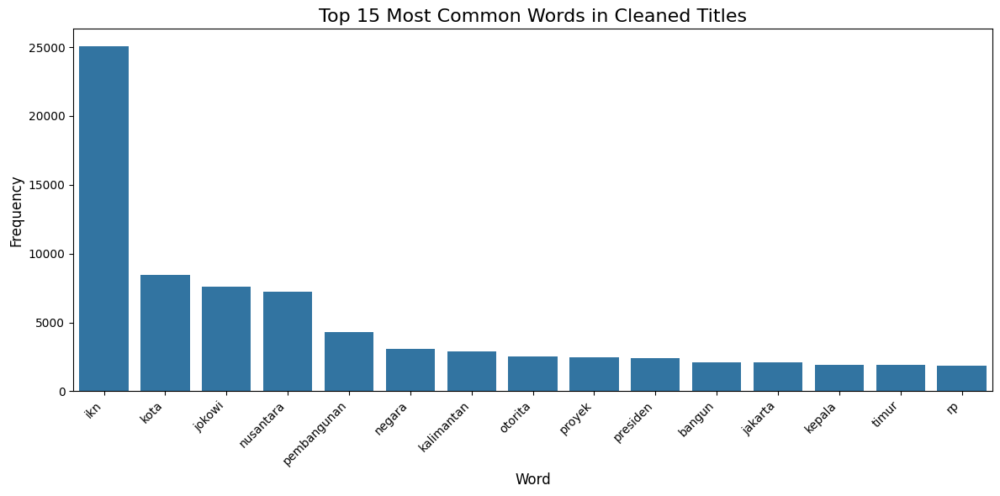

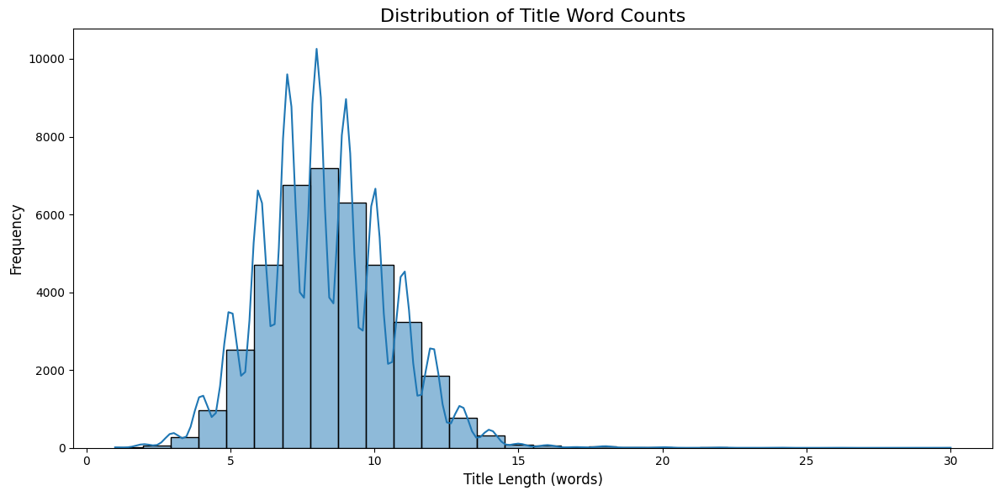

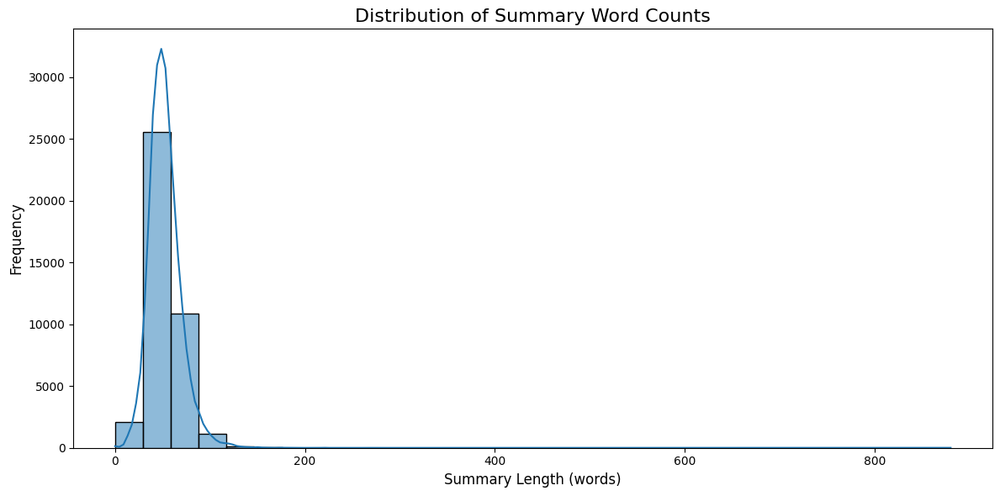

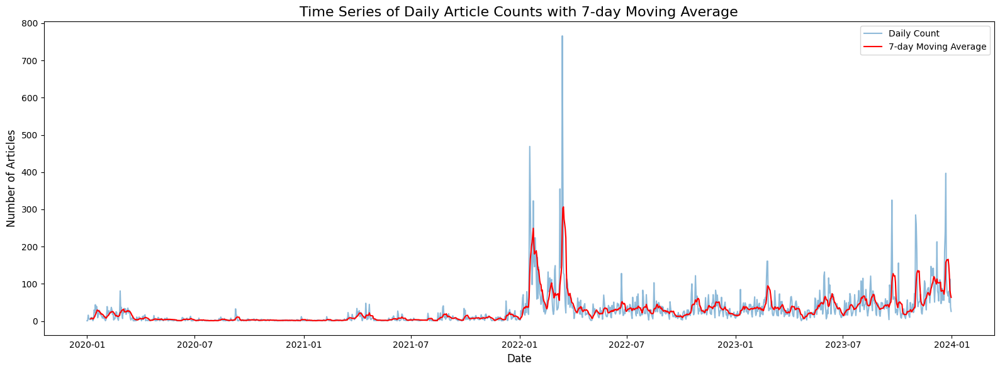

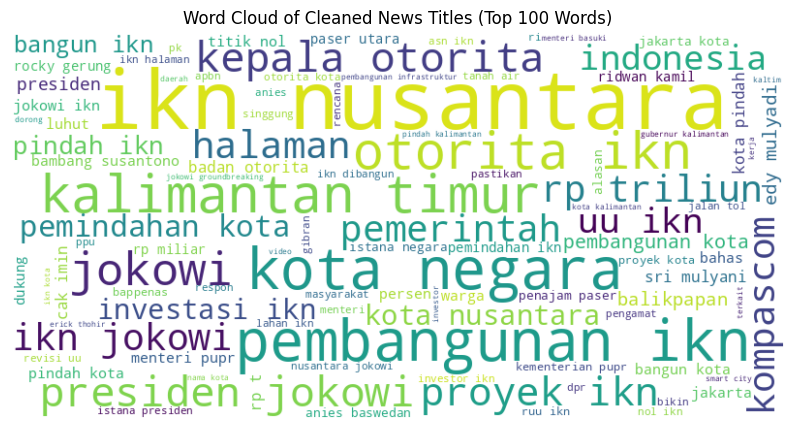

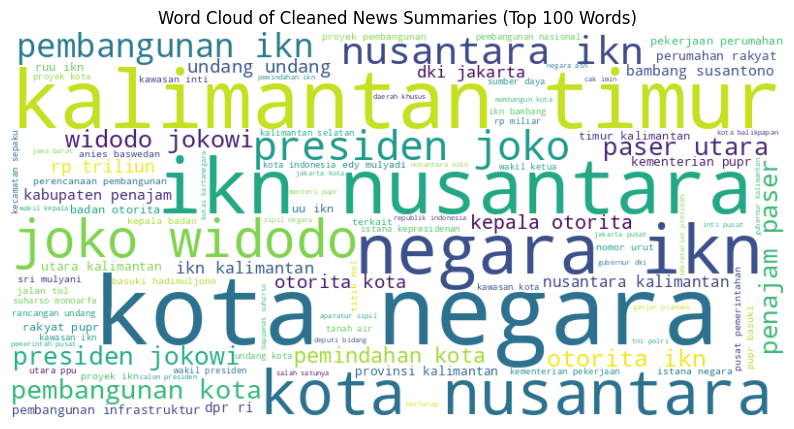

In [24]:
# Ensure all entries are strings and Date are date
df['Cleaned_Title'] = df['Cleaned_Title'].fillna('').astype(str)
df['Cleaned_Summary'] = df['Cleaned_Summary'].fillna('').astype(str)

# 5. Heatmap of article distribution by year and month
pivot_table = df.pivot_table(values='Title', index='Year', columns='Month', aggfunc='count')
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, annot=True, fmt='d', cmap='YlOrRd')
plt.title('Heatmap of Article Distribution by Year and Month', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Year', fontsize=12)
plt.tight_layout()
plt.show()

# 6. Top 15 most common words in cleaned titles
def get_top_words(text_series, n=15):
    words = ' '.join(text_series).split()
    return Counter(words).most_common(n)

top_title_words = get_top_words(df['Cleaned_Title'], 15)
plt.figure(figsize=(12, 6))
sns.barplot(x=[word[0] for word in top_title_words], y=[word[1] for word in top_title_words])
plt.title('Top 15 Most Common Words in Cleaned Titles', fontsize=16)
plt.xlabel('Word', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# 7. Distribution of cleaned title word counts
df['Title_WordCount'] = df['Cleaned_Title'].str.split().str.len()
plt.figure(figsize=(12, 6))
sns.histplot(df['Title_WordCount'], kde=True, bins=30)
plt.title('Distribution of Title Word Counts', fontsize=16)
plt.xlabel('Title Length (words)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.tight_layout()
plt.show()

# 8. Distribution of cleaned summary word counts
df['Summary_WordCount'] = df['Cleaned_Summary'].str.split().str.len()
plt.figure(figsize=(12, 6))
sns.histplot(df['Summary_WordCount'], kde=True, bins=30)
plt.title('Distribution of Summary Word Counts', fontsize=16)
plt.xlabel('Summary Length (words)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.tight_layout()
plt.show()

# 9. Time series of daily article counts with moving average
df_ts = df.groupby('Date').size().reset_index(name='Count')
df_ts['MA_7'] = df_ts['Count'].rolling(window=7).mean()

plt.figure(figsize=(16, 6))
plt.plot(df_ts['Date'], df_ts['Count'], alpha=0.5, label='Daily Count')
plt.plot(df_ts['Date'], df_ts['MA_7'], color='red', label='7-day Moving Average')
plt.title('Time Series of Daily Article Counts with 7-day Moving Average', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Number of Articles', fontsize=12)
plt.legend()
plt.tight_layout()
plt.show()

# 10. Word cloud of the most frequent words in the titles (Top 100 Words)
title_text = " ".join(df['Cleaned_Title'].values)
wordcloud_title = WordCloud(width=800, height=400, background_color='white', max_words=100).generate(title_text)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud_title, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Cleaned News Titles (Top 100 Words)')
plt.show()

# 11. Word cloud of the most frequent words in the cleaned summaries (Top 100 Words)
summary_text = " ".join(df['Cleaned_Summary'].values)
wordcloud_summary = WordCloud(width=800, height=400, background_color='white', max_words=100).generate(summary_text)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud_summary, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Cleaned News Summaries (Top 100 Words)')
plt.show()


# ============LDA MODELLING================


# TOPIC MODELLING

In [ ]:
import nltk
from nltk.corpus import stopwords

# Load the stopwords
list_stopwords_indonesian = set(stopwords.words('indonesian'))
list_stopwords_english = set(stopwords.words('english'))
custom_stopwords = set(["ikn", "ibukota", "ibu kota", "nusantara", "negara", "kalimantan", "timur", "kaltim", "jakarta", "presiden"])

# Combine both lists of stopwords
combined_stopwords = list_stopwords_indonesian.union(list_stopwords_english).union(custom_stopwords)

def stopwords_removal(words):
    return [word for word in words if word not in combined_stopwords]

# Apply the stopwords removal function to the 'text_tokenised' column
df['text_tokenised_stemmed'] = df['text_tokenised_stemmed'].apply(stopwords_removal)
print(df['text_tokenised'].head())


0     [politisi, demokrat, joko, widodo, pikir, pind...
50    [hmi, cabang, kukar, ingatkan, warga, menjual,...
61    [sejarah, pemindahan, kota, yogyakarta, tepatn...
62    [luhut, rapat, menteri, pupr, juara, sayembara...
63    [luhut, panggil, pemenang, sayembara, desain, ...
Name: text_tokenised, dtype: object


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


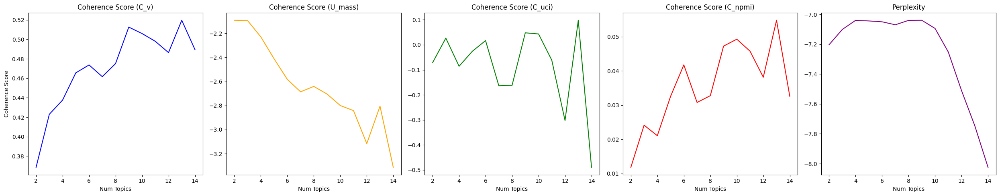

(0, '0.044*"investasi" + 0.037*"indonesia" + 0.030*"investor" + 0.024*"usaha" + 0.013*"city" + 0.013*"kembang" + 0.013*"oikn" + 0.012*"menteri" + 0.012*"temu" + 0.011*"bidang"')
(1, '0.077*"menteri" + 0.038*"pupr" + 0.034*"rumah" + 0.032*"kerja" + 0.029*"jalan" + 0.025*"kawasan" + 0.023*"basuki" + 0.021*"infrastruktur" + 0.018*"tol" + 0.016*"perintah"')
(2, '0.028*"anies" + 0.025*"jawa" + 0.019*"partai" + 0.019*"ganjar" + 0.018*"calon" + 0.014*"kamil" + 0.014*"ridwan" + 0.014*"lanjut" + 0.013*"pilih" + 0.011*"barat"')
(3, '0.140*"otorita" + 0.128*"kepala" + 0.051*"bambang" + 0.036*"badan" + 0.019*"wakil" + 0.018*"jabat" + 0.016*"calon" + 0.015*"pimpin" + 0.015*"nama" + 0.012*"bahlil"')
(4, '0.019*"masyarakat" + 0.018*"dukung" + 0.017*"indonesia" + 0.013*"pemilu" + 0.013*"gelar" + 0.013*"daya" + 0.012*"ketua" + 0.012*"ri" + 0.012*"nasional" + 0.011*"tingkat"')
(5, '0.058*"rp" + 0.039*"proyek" + 0.036*"triliun" + 0.032*"anggar" + 0.027*"pt" + 0.026*"dana" + 0.018*"apbn" + 0.017*"rumah" +

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


In [ ]:
import pandas as pd
import numpy as np
import random
from gensim import corpora, models
from gensim.models.coherencemodel import CoherenceModel
import matplotlib.pyplot as plt
import gc
import ast
from tqdm import tqdm
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

# Set random seeds for reproducibility
random.seed(42)
np.random.seed(42)

# Clear variables or reset environment and reload the df
gc.collect()
df = pd.read_csv('/content/drive/MyDrive/THESIS/ULTIMATE_DATASET_TEXT.csv')

# Randomly sample 5000 rows from the dataframe
#dfs = df.sample(n=2500, random_state=42).reset_index(drop=True)
#df.to_csv('/content/ULTIMATE_DATASET.csv')

# Function to safely evaluate strings that represent lists
def safe_eval(text):
    if isinstance(text, str):
        try:
            return ast.literal_eval(text)
        except (ValueError, SyntaxError):
            return []
    elif isinstance(text, list):
        return text
    return []

# Extract the summary_tokenised column
texts = df['text_tokenised_stemmed'].apply(safe_eval).tolist()

###############

# Prepare the dictionary and corpus for LDA
dictionary = corpora.Dictionary(texts)
dictionary.filter_extremes(no_below=10, no_above=0.4)
corpus = [dictionary.doc2bow(text) for text in texts]

# Save the dictionary and corpus
dictionary.save('/content/drive/MyDrive/THESIS/model/IKN_dictionary.dict')
corpora.MmCorpus.serialize('/content/drive/MyDrive/THESIS/model/IKN_corpus.mm', corpus)

###############

# Function to compute coherence score and perplexity
def compute_coherence_values(dictionary, doc_term_matrix, texts, limit, start=2, step=1):
    coherence_values_cv = []
    coherence_values_umass = []
    coherence_values_cuci = []
    coherence_values_cnpmi = []
    perplexity_values = []
    model_list = []

    for num_topics in range(start, limit, step):
        model = models.LdaModel(doc_term_matrix, num_topics=num_topics, id2word=dictionary, passes=100, iterations=400, random_state=42)
        model_list.append(model)

        coherencemodel_cv = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values_cv.append(coherencemodel_cv.get_coherence())

        coherencemodel_umass = CoherenceModel(model=model, corpus=doc_term_matrix, dictionary=dictionary, coherence='u_mass')
        coherence_values_umass.append(coherencemodel_umass.get_coherence())

        coherencemodel_cuci = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_uci')
        coherence_values_cuci.append(coherencemodel_cuci.get_coherence())

        coherencemodel_cnpmi = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_npmi')
        coherence_values_cnpmi.append(coherencemodel_cnpmi.get_coherence())

        perplexity_values.append(model.log_perplexity(doc_term_matrix))

    return model_list, coherence_values_cv, coherence_values_umass, coherence_values_cuci, coherence_values_cnpmi, perplexity_values

# Compute coherence values
model_list, coherence_values_cv, coherence_values_umass, coherence_values_cuci, coherence_values_cnpmi, perplexity_values = compute_coherence_values(
    dictionary=dictionary,
    doc_term_matrix=corpus,
    texts=texts,
    start=2,
    limit=15,
    step=1
)

# Show graph for each coherence measure and perplexity
x = range(2, 15, 1)
fig, axes = plt.subplots(1, 5, figsize=(25, 5), sharex=True)

axes[0].plot(x, coherence_values_cv, label='C_v', color='blue')
axes[0].set_title('Coherence Score (C_v)')
axes[0].set_xlabel('Num Topics')
axes[0].set_ylabel('Coherence Score')

axes[1].plot(x, coherence_values_umass, label='U_mass', color='orange')
axes[1].set_title('Coherence Score (U_mass)')
axes[1].set_xlabel('Num Topics')

axes[2].plot(x, coherence_values_cuci, label='C_uci', color='green')
axes[2].set_title('Coherence Score (C_uci)')
axes[2].set_xlabel('Num Topics')

axes[3].plot(x, coherence_values_cnpmi, label='C_npmi', color='red')
axes[3].set_title('Coherence Score (C_npmi)')
axes[3].set_xlabel('Num Topics')

axes[4].plot(x, perplexity_values, label='Perplexity', color='purple')
axes[4].set_title('Perplexity')
axes[4].set_xlabel('Num Topics')

plt.tight_layout()
plt.show()

# Select the model with the highest coherence score (C_v)
optimal_num_topics = x[coherence_values_cv.index(max(coherence_values_cv))]
optimal_model = model_list[coherence_values_cv.index(max(coherence_values_cv))]
topics = optimal_model.show_topics(num_topics=optimal_num_topics, num_words=10)
for topic in topics:
    print(topic)

# Interactive visualization with pyLDAvis
vis_data = gensimvis.prepare(optimal_model, corpus, dictionary)
pyLDAvis.save_html(vis_data, '/content/drive/MyDrive/THESIS/IKN_LDA_Visualization.html')

In [ ]:
from gensim.corpora.dictionary import Dictionary
from gensim.models.ldamodel import LdaModel
import pickle
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

# Function to display topics for the loaded model
def display_topics(model, num_words=10):
    topics = model.print_topics(num_words=num_words)
    for topic in topics:
        print(topic)

# Prepare and show the pyLDAvis visualization for the specific model
LDAvis_prepared = gensimvis.prepare(specific_model, corpus, dictionary, mds='pcoa')  # use 'pcoa' instead of 'pca' if 'pca' doesn't work
pyLDAvis.display(LDAvis_prepared)

pyLDAvis.save_html(LDAvis_prepared, '/content/drive/MyDrive/THESIS/IKN_LDA_Visualization_specific.html')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


## Implementing the Model to the Dataset

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(0, '0.040*"indonesia" + 0.025*"investasi" + 0.018*"investor" + 0.015*"usaha" + 0.013*"ekonomi" + 0.012*"kembang" + 0.012*"susantono" + 0.008*"city" + 0.008*"perintah" + 0.007*"temu" + 0.007*"smart" + 0.006*"menteri" + 0.006*"konsep" + 0.006*"dunia" + 0.006*"kerja" + 0.006*"oikn" + 0.006*"dukung" + 0.006*"teknologi" + 0.006*"bidang" + 0.005*"industri" + 0.005*"rencana" + 0.005*"tarik" + 0.005*"transportasi" + 0.005*"minat" + 0.005*"bahlil" + 0.005*"sektor" + 0.005*"group" + 0.005*"bisnis" + 0.005*"proyek" + 0.004*"digital" + 0.004*"lanjut" + 0.004*"tumbuh" + 0.004*"harap" + 0.004*"tanam" + 0.004*"jepang" + 0.004*"negeri" + 0.004*"kunjung" + 0.004*"modal" + 0.004*"china" + 0.004*"peluang" + 0.004*"wujud" + 0.004*"salah" + 0.004*"tingkat" + 0.004*"lingkung" + 0.004*"infrastruktur" + 0.004*"dorong" + 0.004*"hadir" + 0.004*"hijau" + 0.004*"kendara" + 0.004*"korea"')


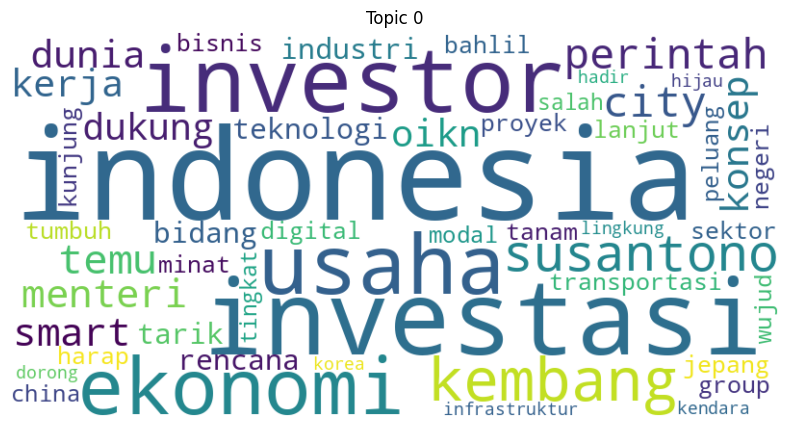

(1, '0.053*"menteri" + 0.026*"pupr" + 0.023*"kawasan" + 0.022*"rumah" + 0.022*"jalan" + 0.020*"kerja" + 0.016*"basuki" + 0.015*"perintah" + 0.014*"infrastruktur" + 0.013*"bandara" + 0.013*"tol" + 0.012*"kantor" + 0.011*"lahan" + 0.011*"tanah" + 0.011*"rencana" + 0.010*"rakyat" + 0.009*"pusat" + 0.009*"timur" + 0.008*"budi" + 0.008*"proyek" + 0.008*"kalimantan" + 0.008*"luas" + 0.008*"hadimuljono" + 0.008*"inti" + 0.008*"selesai" + 0.007*"laksana" + 0.007*"tahap" + 0.007*"hutan" + 0.007*"target" + 0.006*"kipp" + 0.006*"tata" + 0.006*"hubung" + 0.006*"gedung" + 0.006*"progres" + 0.005*"wilayah" + 0.005*"hektare" + 0.005*"karya" + 0.005*"desain" + 0.005*"jenderal" + 0.005*"nasional" + 0.005*"istana" + 0.005*"balikpapan" + 0.005*"dasar" + 0.004*"ruang" + 0.004*"heru" + 0.004*"lokasi" + 0.004*"konstruksi" + 0.004*"badan" + 0.004*"halaman" + 0.004*"persen"')


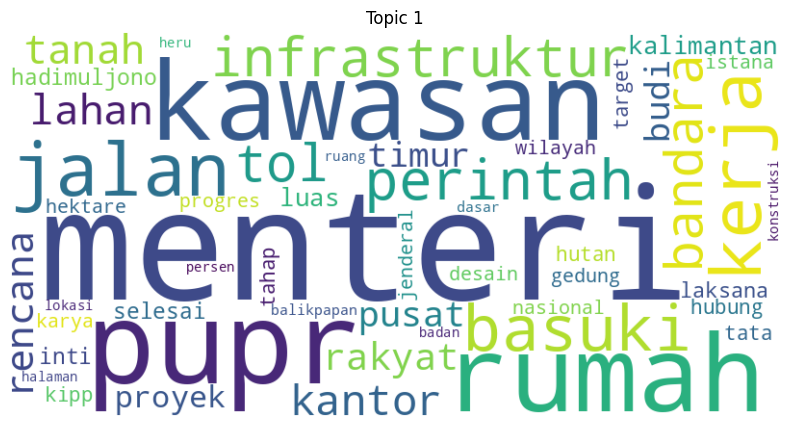

(2, '0.017*"pindah" + 0.016*"anies" + 0.015*"indonesia" + 0.014*"jawa" + 0.013*"partai" + 0.012*"ketua" + 0.011*"ganjar" + 0.010*"dki" + 0.010*"lanjut" + 0.010*"calon" + 0.009*"nilai" + 0.009*"wakil" + 0.009*"nomor" + 0.008*"politik" + 0.008*"kamil" + 0.008*"ridwan" + 0.008*"pilih" + 0.007*"tolak" + 0.007*"pks" + 0.007*"revisi" + 0.007*"kritik" + 0.007*"barat" + 0.006*"gubernur" + 0.006*"perintah" + 0.006*"rocky" + 0.006*"proyek" + 0.006*"gibran" + 0.006*"urut" + 0.006*"dukung" + 0.006*"gerung" + 0.006*"program" + 0.005*"kait" + 0.005*"imin" + 0.005*"nyata" + 0.005*"pdip" + 0.005*"cak" + 0.005*"arsitek" + 0.005*"perata" + 0.005*"mahasiswa" + 0.005*"pusat" + 0.004*"sebut" + 0.004*"pranowo" + 0.004*"pimpin" + 0.004*"tanggap" + 0.004*"nasional" + 0.004*"salah" + 0.004*"tuju" + 0.004*"ubah" + 0.004*"iskandar" + 0.004*"bangsa"')


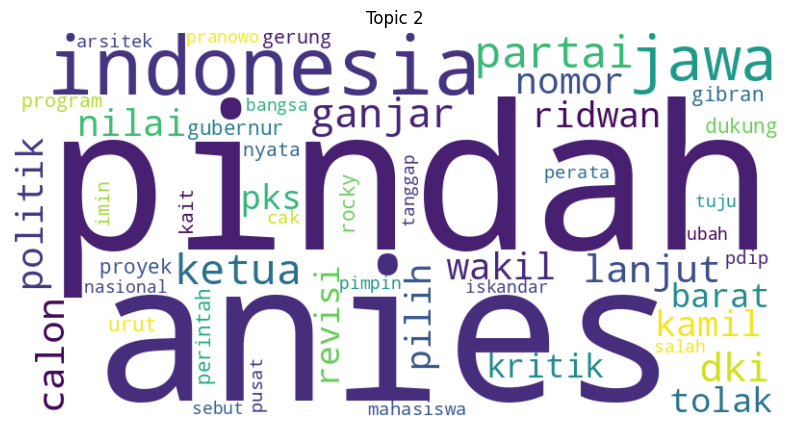

(3, '0.116*"otorita" + 0.091*"kepala" + 0.036*"bambang" + 0.023*"badan" + 0.017*"jabat" + 0.016*"lantik" + 0.014*"calon" + 0.014*"wakil" + 0.013*"nama" + 0.012*"pimpin" + 0.010*"pilih" + 0.009*"ahok" + 0.008*"ksp" + 0.008*"utama" + 0.007*"wandy" + 0.007*"dhony" + 0.007*"kantor" + 0.007*"menteri" + 0.007*"rahajoe" + 0.007*"ahli" + 0.006*"anas" + 0.006*"bri" + 0.006*"milik" + 0.006*"tenaga" + 0.006*"deputi" + 0.006*"umum" + 0.005*"staf" + 0.005*"buka" + 0.005*"sosok" + 0.005*"angkat" + 0.005*"daftar" + 0.005*"azwar" + 0.004*"resmi" + 0.004*"tuturoong" + 0.004*"pssi" + 0.004*"center" + 0.004*"birokrasi" + 0.004*"posisi" + 0.004*"kereta" + 0.004*"bola" + 0.004*"debat" + 0.004*"orang" + 0.004*"kriteria" + 0.004*"ayat" + 0.004*"timnas" + 0.004*"tim" + 0.004*"training" + 0.003*"pendayagunaan" + 0.003*"ribu" + 0.003*"mantan"')


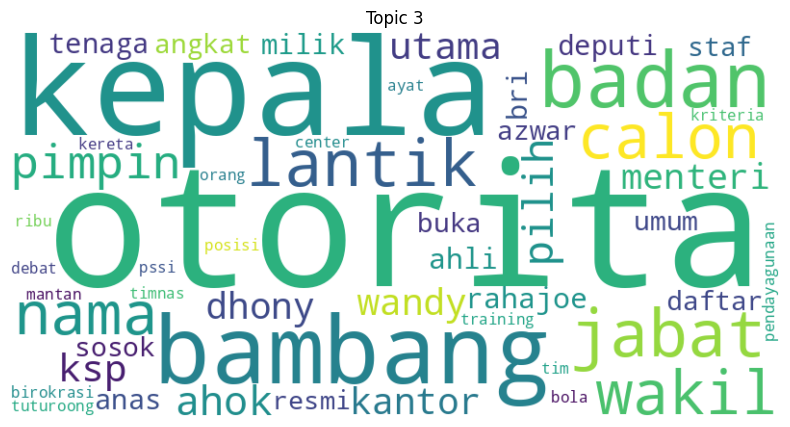

(4, '0.013*"luhut" + 0.012*"menteri" + 0.012*"kerja" + 0.011*"bidang" + 0.011*"ketua" + 0.011*"pemilu" + 0.010*"tani" + 0.010*"indonesia" + 0.009*"latih" + 0.009*"daya" + 0.009*"koordinator" + 0.009*"erick" + 0.008*"pangan" + 0.008*"didik" + 0.008*"program" + 0.007*"thohir" + 0.007*"budaya" + 0.007*"capital" + 0.006*"menko" + 0.006*"nasional" + 0.006*"buka" + 0.006*"universitas" + 0.006*"sumber" + 0.006*"pemuda" + 0.006*"tingkat" + 0.006*"airlangga" + 0.006*"sdm" + 0.006*"muda" + 0.006*"maritim" + 0.006*"pj" + 0.005*"seleksi" + 0.005*"saudi" + 0.005*"temu" + 0.005*"bamsoet" + 0.005*"said" + 0.005*"dukung" + 0.005*"sepak" + 0.005*"mpr" + 0.005*"oikn" + 0.005*"new" + 0.004*"akmal" + 0.004*"tony" + 0.004*"blair" + 0.004*"bin" + 0.004*"bal" + 0.004*"binsar" + 0.004*"cpns" + 0.004*"ri" + 0.004*"pandjaitan" + 0.004*"pusat"')


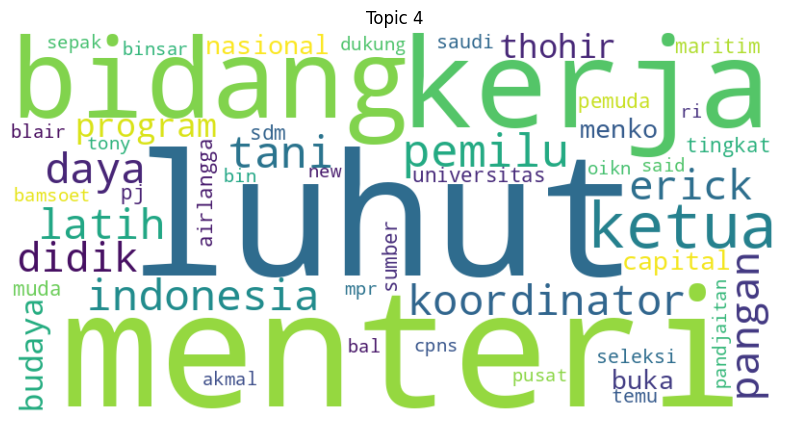

(5, '0.039*"rp" + 0.031*"proyek" + 0.024*"triliun" + 0.018*"pt" + 0.018*"anggar" + 0.017*"dana" + 0.015*"rumah" + 0.012*"apbn" + 0.010*"kerja" + 0.010*"huni" + 0.010*"persen" + 0.010*"groundbreaking" + 0.010*"miliar" + 0.009*"infrastruktur" + 0.009*"usaha" + 0.009*"capai" + 0.009*"bendung" + 0.009*"listrik" + 0.009*"butuh" + 0.008*"air" + 0.008*"biaya" + 0.008*"persero" + 0.007*"karya" + 0.007*"agung" + 0.007*"perintah" + 0.007*"direktur" + 0.007*"dukung" + 0.006*"tbk" + 0.006*"investasi" + 0.006*"sedia" + 0.006*"nilai" + 0.006*"belanja" + 0.006*"paku" + 0.006*"tower" + 0.006*"pln" + 0.006*"total" + 0.006*"tahap" + 0.006*"bumn" + 0.005*"swasta" + 0.005*"kalimantan" + 0.005*"rusun" + 0.005*"target" + 0.005*"semoi" + 0.005*"hotel" + 0.005*"nila" + 0.005*"milik" + 0.005*"oikn" + 0.005*"sakit" + 0.005*"konstruksi" + 0.005*"utama"')


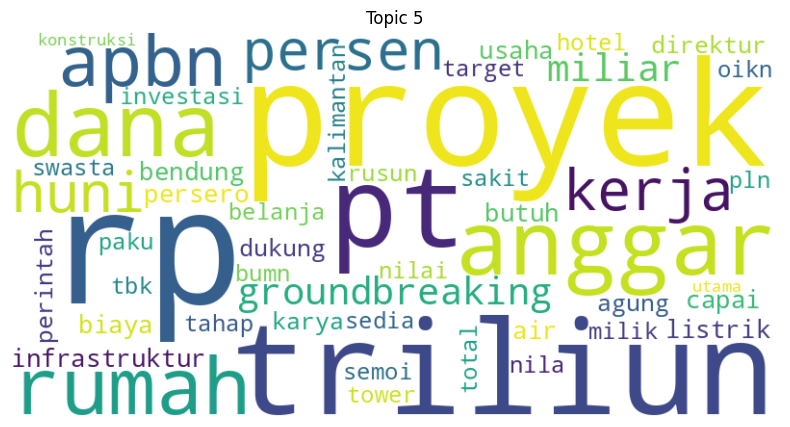

(6, '0.046*"pindah" + 0.033*"perintah" + 0.030*"uu" + 0.024*"dpr" + 0.023*"asn" + 0.018*"menteri" + 0.017*"undangundang" + 0.015*"atur" + 0.014*"ri" + 0.014*"rencana" + 0.013*"khusus" + 0.010*"nomor" + 0.010*"ruu" + 0.010*"daerah" + 0.009*"dki" + 0.009*"rapat" + 0.007*"bappenas" + 0.007*"nasional" + 0.007*"suharso" + 0.007*"aparatur" + 0.007*"uang" + 0.007*"bahas" + 0.007*"komisi" + 0.007*"rancang" + 0.007*"pasal" + 0.007*"sri" + 0.007*"anggota" + 0.006*"sipil" + 0.006*"kait" + 0.005*"mulyani" + 0.005*"ketua" + 0.005*"ahy" + 0.005*"status" + 0.005*"ubah" + 0.005*"pns" + 0.005*"tahap" + 0.005*"usul" + 0.004*"mk" + 0.004*"sah" + 0.004*"kalimantan" + 0.004*"siap" + 0.004*"putus" + 0.004*"timur" + 0.004*"pusat" + 0.004*"turun" + 0.004*"gugat" + 0.004*"ii" + 0.004*"bentuk" + 0.004*"fraksi" + 0.004*"monoarfa"')


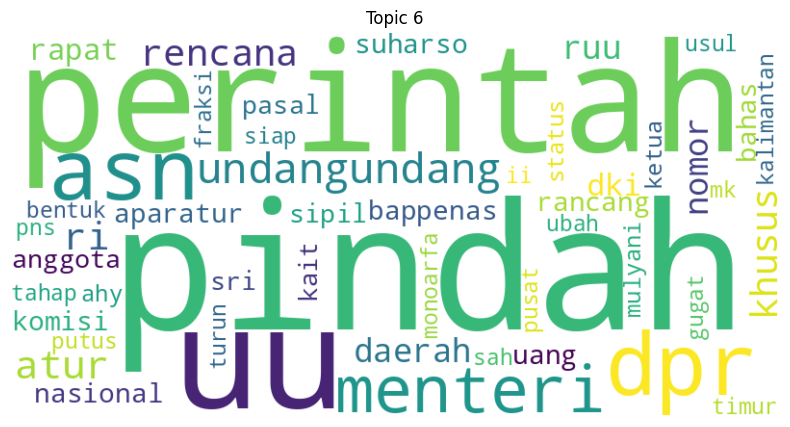

(7, '0.067*"kalimantan" + 0.050*"timur" + 0.020*"utara" + 0.019*"paser" + 0.019*"penajam" + 0.015*"kabupaten" + 0.014*"masyarakat" + 0.013*"provinsi" + 0.011*"gubernur" + 0.011*"daerah" + 0.010*"balikpapan" + 0.010*"wilayah" + 0.008*"tni" + 0.008*"ppu" + 0.008*"selatan" + 0.008*"tanah" + 0.007*"warga" + 0.007*"lokasi" + 0.006*"air" + 0.006*"barat" + 0.006*"paku" + 0.006*"camat" + 0.006*"sulawesi" + 0.006*"edy" + 0.005*"dukung" + 0.005*"pindah" + 0.005*"adat" + 0.005*"kait" + 0.005*"perintah" + 0.005*"panglima" + 0.004*"samarinda" + 0.004*"bupati" + 0.004*"kepala" + 0.004*"kpk" + 0.004*"kuta" + 0.004*"kawasan" + 0.004*"desa" + 0.004*"hadir" + 0.003*"dprd" + 0.003*"tahan" + 0.003*"harap" + 0.003*"milik" + 0.003*"ketua" + 0.003*"senin" + 0.003*"wakil" + 0.003*"dayak" + 0.003*"aman" + 0.003*"giat" + 0.003*"satu" + 0.003*"bawa"')


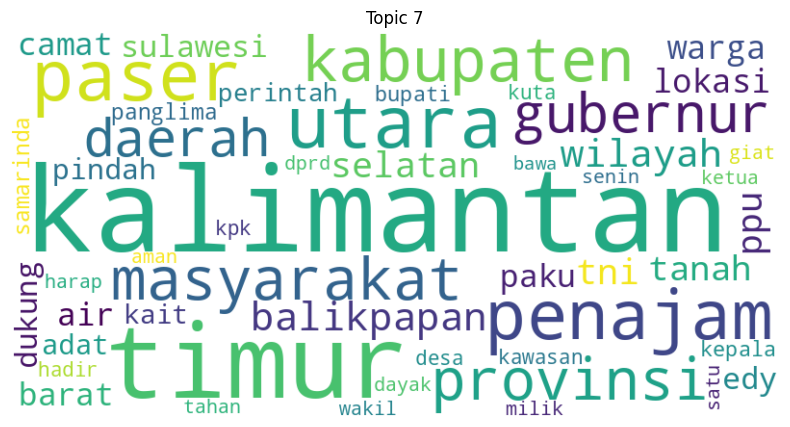

(8, '0.174*"joko" + 0.173*"widodo" + 0.019*"istana" + 0.009*"kalimantan" + 0.009*"indonesia" + 0.009*"timur" + 0.008*"nol" + 0.007*"mulyadi" + 0.007*"resmi" + 0.007*"kunjung" + 0.007*"rabu" + 0.006*"titik" + 0.006*"ri" + 0.006*"prabowo" + 0.006*"groundbreaking" + 0.006*"baswedan" + 0.005*"selasa" + 0.005*"presiden" + 0.005*"upacara" + 0.005*"kemah" + 0.005*"kamis" + 0.005*"sekretariat" + 0.005*"vvip" + 0.004*"kontrak" + 0.004*"merdeka" + 0.004*"temu" + 0.004*"langsung" + 0.004*"capres" + 0.004*"agustus" + 0.004*"malam" + 0.004*"cawapres" + 0.003*"tinjau" + 0.003*"acara" + 0.003*"desain" + 0.003*"amin" + 0.003*"pohon" + 0.003*"sambut" + 0.003*"youtube" + 0.003*"hut" + 0.003*"kawasan" + 0.003*"hadir" + 0.003*"pimpin" + 0.003*"siar" + 0.003*"sebut" + 0.003*"rencana" + 0.003*"gelar" + 0.003*"jumat" + 0.003*"wapres" + 0.003*"garuda" + 0.003*"bbm"')


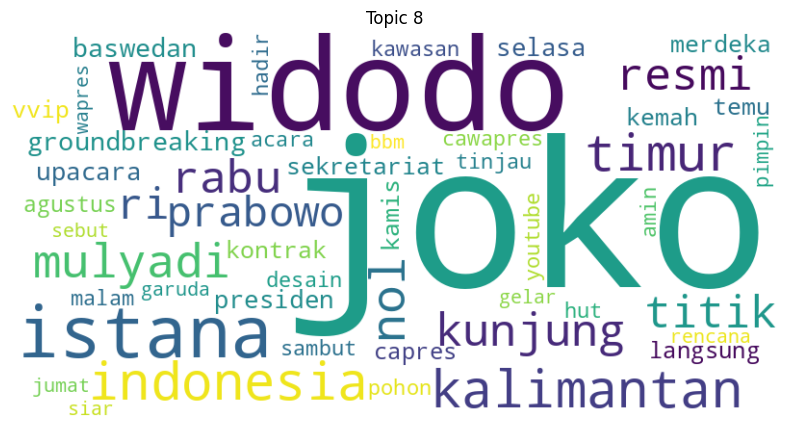

Topic 0 Top URLs:
https://kumparan.com/kumparantech/alibaba-cloud-siap-dukung-pembangunan-ibu-kota-baru-di-kaltim-1seb76af5qz
https://kumparan.com/kumparantech/alibaba-cloud-mau-ikut-investasi-bangun-ibu-kota-baru-di-kaltim-1seb76af5qz
https://kumparan.com/kumparantech/alibaba-cloud-siap-dukung-pembangunan-ibu-kota-baru-di-kaltim-1seb76AF5QZ

Topic 1 Top URLs:
http://www.idntimes.com/business/economy/triyan-pangastuti/dikebut-progres-pembangunan-ikn-tahap-i-capai-40-persen
http://www.jawapos.com/nasional/012433512/pupr-klaim-jalan-tol-ikn-selesai-pertengahan-2024
http://www.kompas.com/properti/read/2021/12/15/120000021/danis-h-sumadilaga-ditunjuk-jadi-ketua-satgas-pelaksanaan-pembangunan

Topic 2 Top URLs:
http://www.merdeka.com/politik/gibran-slepet-cak-imin-soal-tumpengan-di-ikn-ini-pembelaan-pkb-66488-mvk.html
http://wow.tribunnews.com/2023/11/24/hanya-anies-muhaimin-yang-kritisi-soal-ikn-2-paslon-lainnya-janji-akan-lanjutkan-pembangunan
http://nasional.kompas.com/read/2023/11/27/08

In [ ]:
from gensim.corpora.dictionary import Dictionary
from gensim.models.ldamodel import LdaModel
import gensim.corpora as corpora
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import pandas as pd

# Load the dictionary and corpus
dictionary = Dictionary.load('/content/drive/MyDrive/THESIS/model/IKN_dictionary.dict')
corpus = corpora.MmCorpus('/content/drive/MyDrive/THESIS/model/IKN_corpus.mm')

# Load the model
model_path = '/content/drive/MyDrive/THESIS/model/LDA_model_9_topics.model'
specific_model = LdaModel.load(model_path)

# Load your DataFrame
df = pd.read_csv('/content/drive/MyDrive/THESIS/READY.csv')

# Function to display topics for the loaded model
def display_topics(model, num_words=50):
    topics = model.print_topics(num_words=num_words)
    for topic in topics:
        print(topic)

        # Generate and display word cloud for each topic
        topic_words = dict(model.show_topic(topic[0], num_words))
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(topic_words)

        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.title(f"Topic {topic[0]}")
        plt.show()

# Function to assign the dominant topic to each document in the DataFrame
def assign_topics_to_df(model, corpus, df):
    topic_assignments = []

    for row in model[corpus]:
        topic_distribution = sorted(row, key=lambda x: -x[1])
        dominant_topic = topic_distribution[0][0]
        topic_assignments.append(dominant_topic)

    df['topic'] = topic_assignments
    return df

# Display topics for the loaded model
display_topics(specific_model)

# Assign the dominant topic to each document in the DataFrame
df = assign_topics_to_df(specific_model, corpus, df)


# ============NER MODELLING================


# ENTITY COMBINATION EXTRACTION

## Initial Trial (cahya xlm roberta)

In [ ]:
import pandas as pd
from transformers import AutoTokenizer, AutoModelForTokenClassification, pipeline
from IPython.core.display import display, HTML

# Load the tokenizer and model
model_name = "cahya/xlm-roberta-large-indonesian-NER"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForTokenClassification.from_pretrained(model_name)

# Create a pipeline for NER
ner_pipeline = pipeline("ner", model=model, tokenizer=tokenizer, aggregation_strategy="simple")

# Function to extract named entities with labels and positions
def extract_named_entities_with_labels(text, max_length=512):
    tokens = tokenizer.encode_plus(text, truncation=True, max_length=max_length, return_tensors="pt", add_special_tokens=True)
    truncated_text = tokenizer.decode(tokens['input_ids'][0], skip_special_tokens=True)
    ner_results = ner_pipeline(truncated_text)
    entities = [(entity['word'], entity['entity_group'], entity['start'], entity['end']) for entity in ner_results]
    return truncated_text, entities

# Function to highlight named entities in text
def highlight_entities(text, entities):
    highlighted_text = text
    offset = 0
    color_map = {
        "PER": "lightcoral",
        "ORG": "lightblue",
        "LOC": "lightgreen",
        "GPE": "lightsalmon",
        "NOR": "lightpink",
        "DAT": "lightyellow",
        "FAC": "lightgray",
        "PRD": "lightcyan"
    }

    for entity in entities:
        word, label, start, end = entity
        color = color_map.get(label, "lightgrey")
        highlighted_entity = f'<span style="background-color: {color};">{word} ({label})</span>'
        highlighted_text = highlighted_text[:start + offset] + highlighted_entity + highlighted_text[end + offset:]
        offset += len(highlighted_entity) - (end - start)

    return highlighted_text

# Example sentences
sentences = [
    "Ketua Asosiasi Pengusaha Indonesia Shinta Kamdani menjelaskan mengenai kemungkinan investor ragu berinvestasi untuk pembangunan Ibu Kota Nusantara di Kalimantan Timur.",
    "Presiden Joko Widodo meninjau pembangunan infrastruktur di kawasan Ibu Kota Nusantara (IKN).",
    "Menteri pekerjaan umum dan perumahan rakyat Basuki Hadimuljono menyebut ibu kota baru Indonesia di Kalimantan Timur akan terbebas dari banjir.",
    "Menteri perencanaan pembangunan nasional (PPN)/Bappenas Suharso Monoarfa mengatakan, badan otorita untuk pemindahan ibu kota akan dibentuk pada akhir bulan Januari 2020.",
    "Staf khusus menteri BUMN Arya Sinulingga mengatakan, nantinya gedung tersebut akan dibangun mirip dengan Menara Petronas di Malaysia."
]

# Extract and highlight entities in each sentence
highlighted_texts = []
for sentence in sentences:
    text, entities = extract_named_entities_with_labels(sentence)
    highlighted_text = highlight_entities(text, entities)
    highlighted_texts.append(highlighted_text)

# Display the highlighted texts
for highlighted_text in highlighted_texts:
    display(HTML(highlighted_text))


Some weights of the model checkpoint at cahya/xlm-roberta-large-indonesian-NER were not used when initializing XLMRobertaForTokenClassification: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForTokenClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForTokenClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


## Initial Trial (cahya bert base)

In [ ]:
import pandas as pd
from transformers import AutoTokenizer, AutoModelForTokenClassification, pipeline
from IPython.core.display import display, HTML

# Load the tokenizer and model
model_name = "cahya/bert-base-indonesian-NER"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForTokenClassification.from_pretrained(model_name)

# Create a pipeline for NER
ner_pipeline = pipeline("ner", model=model, tokenizer=tokenizer, aggregation_strategy="simple")

# Function to extract named entities with labels and positions
def extract_named_entities_with_labels(text, max_length=512):
    tokens = tokenizer.encode_plus(text, truncation=True, max_length=max_length, return_tensors="pt", add_special_tokens=True)
    truncated_text = tokenizer.decode(tokens['input_ids'][0], skip_special_tokens=True)
    ner_results = ner_pipeline(truncated_text)
    entities = [(entity['word'], entity['entity_group'], entity['start'], entity['end']) for entity in ner_results]
    return truncated_text, entities

# Function to highlight named entities in text
def highlight_entities(text, entities):
    highlighted_text = text
    offset = 0
    color_map = {
        "PER": "lightcoral",
        "ORG": "lightblue",
        "LOC": "lightgreen",
        "GPE": "lightsalmon",
        "NOR": "lightpink"
    }

    for entity in entities:
        word, label, start, end = entity
        color = color_map.get(label, "lightgrey")
        highlighted_entity = f'<span style="background-color: {color};">{word} ({label})</span>'
        highlighted_text = highlighted_text[:start + offset] + highlighted_entity + highlighted_text[end + offset:]
        offset += len(highlighted_entity) - (end - start)

    return highlighted_text

# Example sentences
sentences = [
    "Ketua Asosiasi Pengusaha Indonesia Shinta Kamdani menjelaskan mengenai kemungkinan investor ragu berinvestasi untuk pembangunan Ibu Kota Nusantara di Kalimantan Timur.",
    "Presiden Joko Widodo meninjau pembangunan infrastruktur di kawasan Ibu Kota Nusantara (IKN).",
    "Menteri pekerjaan umum dan perumahan rakyat Basuki Hadimuljono menyebut ibu kota baru Indonesia di Kalimantan Timur akan terbebas dari banjir.",
    "Menteri perencanaan pembangunan nasional Suharso Monoarfa mengatakan, badan otorita untuk pemindahan ibu kota akan dibentuk pada akhir bulan Januari 2020.",
    "Staf khusus menteri BUMN Arya Sinulingga mengatakan, nantinya gedung tersebut akan dibangun mirip dengan Menara Petronas di Malaysia."
]

# Extract and highlight entities in each sentence
highlighted_texts = []
for sentence in sentences:
    text, entities = extract_named_entities_with_labels(sentence)
    highlighted_text = highlight_entities(text, entities)
    highlighted_texts.append(highlighted_text)

# Display the highlighted texts
for highlighted_text in highlighted_texts:
    display(HTML(highlighted_text))


Some weights of the model checkpoint at cahya/bert-base-indonesian-NER were not used when initializing BertForTokenClassification: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
- This IS expected if you are initializing BertForTokenClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForTokenClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


## Checking performances of 2 models

In [1]:
import torch
from datasets import load_dataset
from transformers import AutoTokenizer, AutoModelForTokenClassification
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from tqdm import tqdm

# Load the dataset
print("Loading dataset...")
dataset = load_dataset("grit-id/id_nergrit_corpus", "ner", split="train[:5000]")
print(dataset)

# Create a mapping from the model's string labels to the dataset's integer labels
label_list = dataset.features['ner_tags'].feature.names
label_to_id = {label: idx for idx, label in enumerate(label_list)}

def evaluate_model(model_name, dataset, label_to_id):
    tokenizer = AutoTokenizer.from_pretrained(model_name)
    model = AutoModelForTokenClassification.from_pretrained(model_name)

    all_true_labels = []
    all_pred_labels = []

    for item in tqdm(dataset, desc=f"Evaluating {model_name}"):
        inputs = tokenizer(item['tokens'], is_split_into_words=True, return_tensors="pt", truncation=True, padding=True)
        with torch.no_grad():
            outputs = model(**inputs)

        predictions = torch.argmax(outputs.logits, dim=2)
        pred_labels = [label_to_id[model.config.id2label[p.item()]] for p in predictions[0]]

        # Align predictions with true labels
        true_labels = item['ner_tags']
        pred_labels = pred_labels[:len(true_labels)]  # Truncate predictions to match true labels

        all_true_labels.extend(true_labels)
        all_pred_labels.extend(pred_labels)

    accuracy = accuracy_score(all_true_labels, all_pred_labels)
    f1 = f1_score(all_true_labels, all_pred_labels, average='weighted')
    precision = precision_score(all_true_labels, all_pred_labels, average='weighted')
    recall = recall_score(all_true_labels, all_pred_labels, average='weighted')

    return accuracy, f1, precision, recall

# Evaluate both models
models = ['cahya/bert-base-indonesian-NER', 'cahya/xlm-roberta-large-indonesian-NER']

for model_name in models:
    print(f"\nEvaluating {model_name}")
    accuracy, f1, precision, recall = evaluate_model(model_name, dataset, label_to_id)
    print("Accuracy: {:.4f}".format(accuracy))
    print("F1-score: {:.4f}".format(f1))
    print("Precision: {:.4f}".format(precision))
    print("Recall: {:.4f}".format(recall))


Loading dataset...


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Generating train split:   0%|          | 0/12532 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/2399 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/2521 [00:00<?, ? examples/s]

Dataset({
    features: ['id', 'tokens', 'ner_tags'],
    num_rows: 5000
})

Evaluating cahya/bert-base-indonesian-NER


tokenizer_config.json:   0%|          | 0.00/85.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.97k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/230k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/443M [00:00<?, ?B/s]

Some weights of the model checkpoint at cahya/bert-base-indonesian-NER were not used when initializing BertForTokenClassification: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
- This IS expected if you are initializing BertForTokenClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForTokenClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Evaluating cahya/bert-base-indonesian-NER: 100%|██████████| 5000/5000 [04:05<00:00, 20.33it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control thi

Accuracy: 0.5896
F1-score: 0.5922
Precision: 0.5973
Recall: 0.5896

Evaluating cahya/xlm-roberta-large-indonesian-NER


tokenizer_config.json:   0%|          | 0.00/49.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/2.05k [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/5.07M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/150 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.24G [00:00<?, ?B/s]

Some weights of the model checkpoint at cahya/xlm-roberta-large-indonesian-NER were not used when initializing XLMRobertaForTokenClassification: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForTokenClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForTokenClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Evaluating cahya/xlm-roberta-large-indonesian-NER: 100%|██████████| 5000/5000 [14:37<00:00,  5.70it/s]


Accuracy: 0.5465
F1-score: 0.5459
Precision: 0.5487
Recall: 0.5465


## Running cahya bert base on df

In [ ]:
import pandas as pd
import torch
from transformers import AutoTokenizer, AutoModelForTokenClassification, pipeline

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/THESIS/READY.csv')

# Load the tokenizer and model
model_name = "cahya/bert-base-indonesian-NER"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForTokenClassification.from_pretrained(model_name).to(device)

# Create a pipeline for NER
ner_pipeline = pipeline("ner", model=model, tokenizer=tokenizer, aggregation_strategy="simple", device=0 if torch.cuda.is_available() else -1)

# Function to extract named entities with labels
def extract_named_entities_with_labels(text, max_length=512):
    tokens = tokenizer.encode_plus(text, truncation=True, max_length=max_length, return_tensors="pt", add_special_tokens=True)
    truncated_text = tokenizer.decode(tokens['input_ids'][0], skip_special_tokens=True)
    ner_results = ner_pipeline(truncated_text)
    entities = [(entity['word'], entity['entity_group'], entity['start'], entity['end']) for entity in ner_results]
    return entities

# Apply the NER extraction to the 'Summary' column
if 'Summary' in df.columns:
    df['Named_Entities_Labels'] = df['Summary'].apply(lambda x: extract_named_entities_with_labels(x) if pd.notnull(x) else [])

# Function to combine person entities with the nearest preceding role (NOR) and organization (ORG)
def combine_person_with_role_and_org(entities):
    combined_entities = []
    current_role = None
    current_role_position = -1
    current_org = None
    current_org_position = -1

    for entity in entities:
        word, label, start, end = entity
        if label == 'NOR':
            current_role = word
            current_role_position = start
        elif label == 'ORG':
            if current_role and start > current_role_position:
                current_role = f"{current_role} {word}"
                current_role_position = start
            else:
                current_org = word
                current_org_position = start
        elif label == 'PER':
            if current_role and start > current_role_position:
                combined_entities.append(f"{word} = {current_role}")
                current_role = None  # Reset role after use
            elif current_org and start > current_org_position:
                combined_entities.append(f"{word} = {current_org}")
                current_org = None  # Reset organization after use
            else:
                combined_entities.append(f"{word} = UNKNOWN")

    return '; '.join(combined_entities)

# Create a new column for combined entities if the previous step was successful
if 'Named_Entities_Labels' in df.columns:
    df['Combined_Entities'] = df['Named_Entities_Labels'].apply(lambda x: combine_person_with_role_and_org(x))

# Save the updated DataFrame back to the same CSV file
df.to_csv('/content/drive/MyDrive/THESIS/READY.csv', index=False)

# Display the first few rows of the DataFrame to verify
print(df['Combined_Entities'].head())


0    joko widodo= presiden ri; jokowi= presiden ri;...
1                                                     
2                                                     
3    luhut binsar pandjaitan= menteri koordinator b...
4    luhut binsar pandjaitan= menko kemaritiman dan...
Name: Combined_Entities, dtype: object


## Turning extracted influencer to csv library

In [ ]:
# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/THESIS/ULTIMATE_DATASET_TEXT.csv')

df['Combined_Entities'] = df['Combined_Entities'].astype(str)

# Extract unique combined entities
import pandas as pd
# Extract all unique combined entities
all_entities = []
for entities_str in df['Combined_Entities']:
  entities = entities_str.split('; ')
  all_entities.extend(entities)

unique_entities = set(all_entities)

# Create a DataFrame and save it to a CSV
entities_df = pd.DataFrame(unique_entities, columns=['Combined_Entities'])
entities_df.to_csv('/content/drive/MyDrive/THESIS/unique_combined_entities.csv', index=False)


## Conflicting Names and Roles Resolve

In [ ]:

# Initialize a dictionary to store the roles
roles_dict = {}

# Parse each row to extract person and role
for row in df['Combined_Entities']:
    pairs = row.split(';')
    for pair in pairs:
        if '=' in pair:
            person, role = pair.split('=')
            person = person.strip().lower()
            role = role.strip().lower()

            # If the role is unknown, skip for now
            if role == 'unknown':
                continue

            # Add the role to the dictionary
            if person not in roles_dict:
                roles_dict[person] = []
            roles_dict[person].append(role)

# Handle unknown roles by filling them with known roles from other rows
for row in df['Combined_Entities']:
    pairs = row.split(';')
    for pair in pairs:
        if '=' in pair:
            person, role = pair.split('=')
            person = person.strip().lower()
            role = role.strip().lower()

            # If the role is unknown, fill it with the known role
            if role == 'unknown' and person in roles_dict:
                role = max(set(roles_dict[person]), key=roles_dict[person].count)
                roles_dict[person].append(role)

# Resolve conflicts where a person has multiple roles by assigning the majority role
final_roles_dict = {}
for person, roles in roles_dict.items():
    final_role = max(set(roles), key=roles.count)
    final_roles_dict[person] = final_role

# Display the final dictionary
print(final_roles_dict)

{'joko widodo': 'presiden ri', 'jokowi': 'pemerintah', 'andi nurpati': 'politisi demokrat', 'andi': 'ik', 'luhut binsar pandjaitan': 'menteri koordinator bidang kemaritiman dan investasi', 'basuki hadimuljono': 'menteri pupr', 'ik': 'ik', 'basuki': 'pupr', 'luhut': 'menteri koordinator bidang kemaritiman dan investasi', 'basuki hadimuljdono': 'menteri pupr', 'jumat': 'ik', 'kartanegara': 'menko marves', 'suharso monoarfa': 'kepala bappenas', 'luhut binsar panjaitan': 'menteri koordinator bidang kemaritiman dan investasi', 'nicko herlambang': 'kepala bagian pembangunan sekretariat daerah kabupaten penajam paser utara', 'elsajaya barus': 'kemen pupr', '##u': 'pp', 'abdul': 'kpk', 'gafur mas': 'bupati pp', 'ud': 'bupati', 'bp': 'ik', 'teluk': 'pembangunan', 'pup': 'kementerian', 'hadimuljono': 'menteri', 'soekarno - hatta': 'presiden ri', 'imam sukamto': 'presiden ri', 'imam': 'kepala satuan tugas perencanaan pembangunan infrastruktur ibu kota negara ( ikn', 'syarief hasan': 'fraksi parta

In [ ]:
# Update short names to long name versions if they share the same role
updated_dict = {}
for short_name, short_role in short_names_dict.items():
    updated = False
    for long_name, long_role in long_names_dict.items():
        if short_name in long_name and short_role == long_role:
            updated_dict[long_name] = long_role
            updated = True
            break
    if not updated:
        updated_dict[short_name] = short_role

# Add long names to the updated dictionary
for long_name, long_role in long_names_dict.items():
    if long_name not in updated_dict:
        updated_dict[long_name] = long_role

# Display the final dictionary
print("Updated Dictionary:", updated_dict)

Updated Dictionary: {'wandik': 'ik', '##u': 'pp', 'ud': 'bupati', 'bp': 'ik', 'pup': 'kementerian', 'imam': 'kepala satuan tugas perencanaan pembangunan infrastruktur ibu kota negara ( ikn', 'prof sulfikar amir': 'pemerintah', 'arya': 'sd', 'nick': '##u', 'agm kela': 'bupati', 'agm': 'ppu', 'ti': 'disdikpora bali', 'rei': 'pemerintah', 'mb': 'presiden uni emirat arab', 'mbz': 'uea', 'fad': 'presiden ri', 'th': 'otoritas ik', 'asus': 'kapolres penajam paser utara', 'pak bas': 'menteri pupr', '##jokowi': 'presiden', 'abu': 'putra mahkota', 'wea': 'pemerintah uea', 'adam': 'gubernur jawa barat', 'puan': 'dpr', 'lee singapura': 'pm', 'pm': 'perdana menteri ( pm ) republik ceko', 'siti nurbaya': 'lhk', 'herdiansyah': 'pemerintah', 'duta': 'kementerian luar negeri republik indonesia', 'rabu': 'menteri keuangan', 'rendy ronaldy bimantara ahmadi noor supit': 'ketua', 'leon': 'pemerintah indonesia', 'ali': 'kpk', 'budi karya': 'menhub', '##n ali berawi': 'ik', 'son': 'dki jakarta', 'andr': '##n

In [ ]:
import pandas as pd

# Convert dictionaries to DataFrames
short_names_df = pd.DataFrame(list(short_names_dict.items()), columns=['Name', 'Role'])
long_names_df = pd.DataFrame(list(long_names_dict.items()), columns=['Name', 'Role'])
updated_dict_df = pd.DataFrame(list(updated_dict.items()), columns=['Name', 'Role'])

# Save DataFrames to Excel files
short_names_df.to_excel('/content/drive/MyDrive/THESIS/short_names_dictionary.xlsx', index=False)
long_names_df.to_excel('/content/drive/MyDrive/THESIS/long_names_dictionary.xlsx', index=False)
updated_dict_df.to_excel('/content/drive/MyDrive/THESIS/updated_dictionary.xlsx', index=False)


## (Followed by Manual Check)


## Further Refinement (run as much as needed per manual check)

In [ ]:
import pandas as pd
import re
#import Levenshtein as lev

# Load the data from the CSV and Excel files
ready_df = pd.read_csv('/content/drive/MyDrive/THESIS/READY.csv')
influencer_df = pd.read_excel('/content/drive/MyDrive/THESIS/Influencer_Final.xlsx')

# Extract influencer names and aliases
influencer_names = influencer_df['Influencer'].tolist()
influencer_aliases = influencer_df['Alias'].tolist()

# Preprocess the data
def preprocess_text(text):
    # Convert to lowercase
    text = text.lower()
    # Remove special characters
    text = re.sub(r'[^\w\s]', '', text)
    return text

ready_df['Summary'] = ready_df['Summary'].apply(preprocess_text)
influencer_df['Influencer'] = influencer_df['Influencer'].apply(preprocess_text)
influencer_df['Alias'] = influencer_df['Alias'].apply(preprocess_text)

# Identify news summary where influencer or alias is mentioned
def find_influencers(summary, influencer_names, influencer_aliases):
    mentioned_influencers = []
    for name, alias in zip(influencer_names, influencer_aliases):
        if name.lower() in summary or alias.lower() in summary:
            mentioned_influencers.append(name)
    return ', '.join(mentioned_influencers)

ready_df['Influencer'] = ready_df['Summary'].apply(lambda x: find_influencers(x, influencer_names, influencer_aliases))

def remove_duplicate_influencers(influencers_str):
  if isinstance(influencers_str, str):
    influencers = influencers_str.split(', ')
    unique_influencers = list(set(influencers))
    return ', '.join(unique_influencers)
  else:
    return influencers_str

ready_df['Influencer'] = ready_df['Influencer'].apply(remove_duplicate_influencers)
ready_df.head()

# Check how many rows have "-" or blank influencer
blank_or_dash_mask = ready_df['Influencer'].isin(['-', ''])
blank_or_dash_count = blank_or_dash_mask.sum()
print(f"Number of rows with '-' or blank influencer: {blank_or_dash_count}")

# Save blank or dash entries as a separate DataFrame
blank_or_dash_df = ready_df[blank_or_dash_mask]
blank_or_dash_df.to_csv('blank_or_dash_influencers.csv', index=False)
print("Saved blank or dash entries to 'blank_or_dash_influencers.csv'")

Number of rows with '-' or blank influencer: 5461
Saved blank or dash entries to 'blank_or_dash_influencers.csv'


In [ ]:
# Upload the document to Google Colab
#from google.colab import files
#uploaded = files.upload()

# Load the document into a DataFrame
#import pandas as pd

# Assuming the uploaded file is named 'ULTIMATE_DATASET_TEXT.csv'
#file_name = list(uploaded.keys())[0]
df = pd.read_csv('blank_or_dash_influencers.csv')

# Process the DataFrame
import torch
from transformers import AutoTokenizer, AutoModelForTokenClassification, pipeline

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the tokenizer and model
model_name = "cahya/bert-base-indonesian-NER"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForTokenClassification.from_pretrained(model_name).to(device)

# Create a pipeline for NER
ner_pipeline = pipeline("ner", model=model, tokenizer=tokenizer, aggregation_strategy="simple", device=0 if torch.cuda.is_available() else -1)

# Function to extract named entities with labels
def extract_named_entities_with_labels(text, max_length=512):
    tokens = tokenizer.encode_plus(text, truncation=True, max_length=max_length, return_tensors="pt", add_special_tokens=True)
    truncated_text = tokenizer.decode(tokens['input_ids'][0], skip_special_tokens=True)
    ner_results = ner_pipeline(truncated_text)
    entities = [(entity['word'], entity['entity_group'], entity['start'], entity['end']) for entity in ner_results]
    return entities

# Apply the NER extraction to the 'Summary' column
if 'Summary' in df.columns:
    df['Named_Entities_Labels'] = df['Summary'].apply(lambda x: extract_named_entities_with_labels(x) if pd.notnull(x) else [])

# Function to combine person entities with the nearest preceding role (NOR) and organization (ORG)
def combine_person_with_role_and_org(entities):
    combined_entities = []
    current_role = None
    current_role_position = -1
    current_org = None
    current_org_position = -1

    for entity in entities:
        word, label, start, end = entity
        if label == 'NOR':
            current_role = word
            current_role_position = start
        elif label == 'ORG':
            if current_role and start > current_role_position:
                current_role = f"{current_role} {word}"
                current_role_position = start
            else:
                current_org = word
                current_org_position = start
        elif label == 'PER':
            if current_role and start > current_role_position:
                combined_entities.append((word, current_role))
                current_role = None  # Reset role after use
            elif current_org and start > current_org_position:
                combined_entities.append((word, current_org))
                current_org = None  # Reset organization after use
            else:
                combined_entities.append((word, 'UNKNOWN'))

    return combined_entities

# Create a new column for combined entities if the previous step was successful
if 'Named_Entities_Labels' in df.columns:
    df['Combined_Entities'] = df['Named_Entities_Labels'].apply(lambda x: combine_person_with_role_and_org(x))

# Extract the combined entities into a dictionary
combined_entities_dict = {}
for entities in df['Combined_Entities']:
    for name, role in entities:
        if name not in combined_entities_dict:
            combined_entities_dict[name] = role

# Convert the dictionary into a DataFrame
combined_entities_df = pd.DataFrame(list(combined_entities_dict.items()), columns=['Name', 'Role'])

# Save the DataFrame to a new CSV file
combined_entities_df.to_csv('combined_entities.csv', index=False)

# Display the first few rows of the new DataFrame to verify
print(combined_entities_df.head())

# Download the new CSV file to your local machine
from google.colab import files
files.download('combined_entities.csv')


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/85.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.97k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/230k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/443M [00:00<?, ?B/s]

Some weights of the model checkpoint at cahya/bert-base-indonesian-NER were not used when initializing BertForTokenClassification: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
- This IS expected if you are initializing BertForTokenClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForTokenClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


       Name                   Role
0      arya  kementerian bumn bumn
1    hindro        kota balikpapan
2      arie                UNKNOWN
3        ik                UNKNOWN
4  ##sultan                UNKNOWN


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Separating govt vs non-govt

In [ ]:
!pip install pycountry

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import pycountry

# Download NLTK data
nltk.download('punkt')
nltk.download('stopwords')

# Read the Excel file and preprocess
df = pd.read_excel('/content/drive/MyDrive/THESIS/Influencer_Final.xlsx')
df = df.dropna(axis=1, how='all')
df = df.dropna(subset=['Indo_Gov'])
df['Indo_Gov'] = df['Indo_Gov'].astype(int)

# Generate a list of country names using pycountry, excluding Indonesia
countries = [country.name.lower() for country in pycountry.countries if country.name.lower() != 'indonesia']

# alternative country names
countries.extend(['uae', 'korsel', 'britania raya'])

def preprocess_text(text):
    if pd.isna(text):
        return ""
    # Convert to lowercase and remove special characters
    text = re.sub(r'[^a-zA-Z\s]', '', str(text).lower())
    # Tokenize
    tokens = word_tokenize(text)
    # Remove stopwords
    stop_words = set(stopwords.words('indonesian'))
    tokens = [word for word in tokens if word not in stop_words]

    # Check for any other country names
    for country in countries:
        if country in tokens:
            # If other country is mentioned and it's not duta besar or dubes, classify as non-government
            if not any(keyword in tokens for keyword in ['duta besar', 'dubes']):
                return 'non-government'

    # If no other country is mentioned, assume it's Indonesian government
    return ' '.join(tokens)

df['Role_processed'] = df['Role'].apply(preprocess_text)

# Feature engineering based on processed text and keywords
df['Role_length'] = df['Role_processed'].str.len()
df['Word_count'] = df['Role_processed'].str.split().str.len()
df['has_kepala'] = df['Role_processed'].str.contains('kepala').astype(int)
df['has_direktur'] = df['Role_processed'].str.contains('direktur').astype(int)
df['has_ketua'] = df['Role_processed'].str.contains('ketua').astype(int)
df['has_anggota'] = df['Role_processed'].str.contains('anggota').astype(int)
df['has_menteri'] = df['Role_processed'].str.contains('menteri').astype(int)
df['has_gubernur'] = df['Role_processed'].str.contains('gubernur').astype(int)
df['has_bupati'] = df['Role_processed'].str.contains('bupati').astype(int)
df['has_walikota'] = df['Role_processed'].str.contains('walikota').astype(int)
df['has_dpr'] = df['Role_processed'].str.contains('dpr').astype(int)
df['has_dprd'] = df['Role_processed'].str.contains('dprd').astype(int)
df['has_presiden'] = df['Role_processed'].str.contains('presiden').astype(int)
df['has_wakil'] = df['Role_processed'].str.contains('wakil').astype(int)
df['has_sekretaris'] = df['Role_processed'].str.contains('sekretaris').astype(int)
df['has_komisi'] = df['Role_processed'].str.contains('komisi').astype(int)

# Extract categories from Role
df['Role_category'] = df['Role_processed'].apply(lambda x: x.split()[0] if len(x.split()) > 0 else 'unknown')

# Filter out rows with NaN in 'Indo_Gov' before sampling
df_non_nan = df.dropna(subset=['Indo_Gov'])

# Limit the dataset to 700 samples for training
df_limited = df_non_nan.sample(n=700, random_state=42)

# Split the data for training
X = df_limited[['Role_processed', 'Role_length', 'Word_count', 'has_kepala', 'has_ketua',
                'has_anggota', 'has_menteri', 'has_gubernur', 'has_bupati', 'has_walikota',
                'has_dpr', 'has_dprd', 'has_wakil', 'has_sekretaris',
                'Role_category']]
y = df_limited['Indo_Gov']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define a simpler keyword-based vectorization
preprocessor = ColumnTransformer(
    transformers=[
        ('text', CountVectorizer(ngram_range=(1, 2), binary=True, max_features=5000), 'Role_processed'),
        ('bin', 'passthrough', ['has_kepala', 'has_ketua', 'has_anggota', 'has_menteri',
                                'has_gubernur', 'has_bupati', 'has_walikota', 'has_dpr', 'has_dprd',
                                'has_wakil', 'has_sekretaris'])
    ])

# Define the pipeline using Logistic Regression
lr_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(random_state=42, max_iter=1000))
])

# Hyperparameter tuning with GridSearchCV
grid_search = GridSearchCV(lr_pipeline, param_grid={'classifier__C': [0.1, 1, 10]}, cv=5, n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)

# Make predictions on the test set
y_pred = grid_search.predict(X_test)

# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Apply the model to the entire dataset (outside of the 700 samples)
X_full = df[['Role_processed', 'Role_length', 'Word_count', 'has_kepala', 'has_ketua',
             'has_anggota', 'has_menteri', 'has_gubernur', 'has_bupati', 'has_walikota',
             'has_dpr', 'has_dprd', 'has_wakil', 'has_sekretaris',
             'Role_category']]

# Predict the 'Indo_Gov' label for the entire dataset
df['Predicted_Indo_Gov'] = grid_search.predict(X_full)

# Adding the new column with scores
df['Indo_Gov'] = df['kategori'].apply(lambda x: 1 if x == 'pemerintah' else -1 if x == 'non pemerintah' else 0)

# Save the updated dataframe to a new CSV file
df.to_csv('Influencer_Final_with_Predictions.csv', index=False)

print("Predictions have been applied to the entire dataset and saved to 'Influencer_Final_with_Predictions.csv'.")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 47.8 MB/s eta 0:00:00


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


Fitting 5 folds for each of 3 candidates, totalling 15 fits
Classification Report:
              precision    recall  f1-score   support

          -1       0.79      0.91      0.85        69
           1       0.90      0.76      0.82        71

    accuracy                           0.84       140
   macro avg       0.84      0.84      0.84       140
weighted avg       0.84      0.84      0.83       140

Predictions have been applied to the entire dataset and saved to 'Influencer_Final_with_Predictions.csv'.


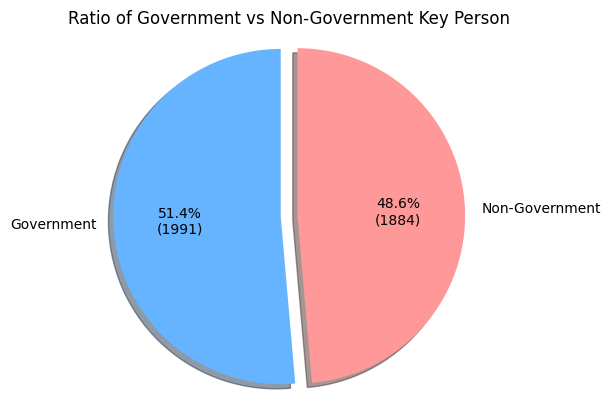

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

df = pd.read_excel('/content/drive/MyDrive/THESIS/Influencer_Final.xlsx')

# Calculate the ratio
category_counts = df['kategori'].value_counts()
government_ratio = category_counts['pemerintah'] / len(df)
non_government_ratio = category_counts['non pemerintah'] / len(df)

# Prepare labels with counts
labels = ['Government', 'Non-Government']
sizes = [government_ratio, non_government_ratio]
counts = [category_counts['pemerintah'], category_counts['non pemerintah']]
colors = ['#66b3ff','#ff9999']
explode = (0.1, 0)  # explode 1st slice

# Custom function to display both percentage and count
def autopct_generator(sizes):
    def my_autopct(pct):
        total = sum(sizes)
        val = int(round(pct*total/100.0))
        return f'{pct:.1f}%\n({val})'
    return my_autopct

plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct=autopct_generator(counts), shadow=True, startangle=90)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Ratio of Government vs Non-Government Key Person')
plt.show()


## Scoring each news

In [ ]:
import re
import pandas as pd

# Load the datasets
df = pd.read_csv('/content/drive/MyDrive/THESIS/READY.csv')
influencers_df = pd.read_excel('/content/drive/MyDrive/THESIS/Influencer_Final.xlsx')

# Correct the influencer dictionary creation with combined sorting of names and aliases
influencer_dict = {}
for _, row in influencers_df.iterrows():
    name = row['Influencer'].lower().strip()
    aliases = [alias.lower().strip() for alias in row['Alias'].split(',') if isinstance(alias, str)]

    # Combine name and aliases, then sort by length in descending order
    all_names = sorted([name] + aliases, key=len, reverse=True)
    influencer_dict[name] = set(all_names)

# Function to find influencers in text and remove shorter, overlapping names
def find_influencers(text):
    if not isinstance(text, str):  # Check if the input is not a string
        return 'No influencers found'

    text = text.lower()
    found_influencers = set()

    # Check for each name/alias in descending order of length to prioritize longer names
    for name, aliases in influencer_dict.items():
        for alias in aliases:
            # Use word boundaries to avoid partial matches
            if re.search(r'\b' + re.escape(alias) + r'\b', text):
                found_influencers.add(alias)
                break  # Stop searching once the first alias is found for this influencer

    # Sort found influencers by length in descending order
    sorted_influencers = sorted(found_influencers, key=len, reverse=True)

    # Remove shorter names that are substrings of longer names
    final_influencers = []
    for influencer in sorted_influencers:
        if not any(influencer in longer_influencer for longer_influencer in final_influencers):
            final_influencers.append(influencer)

    return ', '.join(final_influencers) if final_influencers else 'No influencers found'

# Apply the function to the entire processed Summary column
df['Extracted_Influencer'] = df['Cleaned_Summary'].apply(find_influencers)

# Display the results
print(df[['Summary', 'Extracted_Influencer']].head())

df.to_csv('READY.csv', index=False)
from google.colab import files
files.download('READY.csv')


                                             Summary  \
0  rencana perpindahan ibu kota baru yang diinisi...   
1  hmi cabang kukar mengingatkan warga agar tak m...   
2  hari ini, 74 tahun lalu, tepatnya 3 januari 19...   
3  menteri koordinator bidang maritim dan investa...   
4  menko kemaritiman dan investasi luhut binsar p...   

        Extracted_Influencer  
0  andi nurpati, joko widodo  
1             mursid mubarak  
2       No influencers found  
3  basuki hadimuljono, luhut  
4  basuki hadimuljono, luhut  


In [ ]:
# Define the desired number of topics (clusters)
desired_num_topics = 9

dictionary = corpora.Dictionary.load('/content/drive/MyDrive/THESIS/model/IKN_dictionary.dict')
corpus = corpora.MmCorpus('/content/drive/MyDrive/THESIS/model/IKN_corpus.mm')

# Train the model with the predefined number of topics
specific_model = models.LdaModel(corpus, num_topics=desired_num_topics, id2word=dictionary, passes=100, iterations=400, random_state=42)

# Run this line to see topics for the specific model before saving
def display_topics(model, num_topics, num_words):
    topics = model.show_topics(num_topics=num_topics, num_words=num_words, formatted=False)
    for topic_num, words in topics:
        print(f"Topic {topic_num}: ", ", ".join([word for word, _ in words]))
display_topics(specific_model, num_topics=desired_num_topics, num_words=18)

# Save the specific model
specific_model.save(f'/content/drive/MyDrive/THESIS/model/LDA_model_{desired_num_topics}_topics.model')


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Topic 0:  indonesia, investasi, investor, usaha, ekonomi, kembang, susantono, city, perintah, temu, smart, menteri, konsep, dunia, kerja, oikn, dukung, teknologi
Topic 1:  menteri, pupr, kawasan, rumah, jalan, kerja, basuki, perintah, infrastruktur, bandara, tol, kantor, lahan, tanah, rencana, rakyat, pusat, timur
Topic 2:  pindah, anies, indonesia, jawa, partai, ketua, ganjar, dki, lanjut, calon, nilai, wakil, nomor, politik, kamil, ridwan, pilih, tolak
Topic 3:  otorita, kepala, bambang, badan, jabat, lantik, calon, wakil, nama, pimpin, pilih, ahok, ksp, utama, wandy, dhony, kantor, menteri
Topic 4:  luhut, menteri, kerja, bidang, ketua, pemilu, tani, indonesia, latih, daya, koordinator, erick, pangan, didik, program, thohir, budaya, capital
Topic 5:  rp, proyek, triliun, pt, anggar, dana, rumah, apbn, kerja, huni, persen, groundbreaking, miliar, infrastruktur, usaha, capai, bendung, listrik
Topic 6:  pindah, perintah, uu, dpr, asn, menteri, undangundang, atur, ri, rencana, khusus, n

In [ ]:
from gensim.corpora.dictionary import Dictionary
from gensim.models.ldamodel import LdaModel
import pickle

# Save the dictionary
dictionary.save('lda_dictionary_alt2.dict')

# Save the corpus
with open('lda_corpus_alt2.pkl', 'wb') as f:
    pickle.dump(corpus, f)

# Save the model
lda_model.save('lda_model_alt2.model')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(0, '0.040*"indonesia" + 0.025*"investasi" + 0.018*"investor" + 0.015*"usaha" + 0.013*"ekonomi" + 0.012*"kembang" + 0.012*"susantono" + 0.008*"city" + 0.008*"perintah" + 0.007*"temu" + 0.007*"smart" + 0.006*"menteri" + 0.006*"konsep" + 0.006*"dunia" + 0.006*"kerja" + 0.006*"oikn" + 0.006*"dukung" + 0.006*"teknologi" + 0.006*"bidang" + 0.005*"industri" + 0.005*"rencana" + 0.005*"tarik" + 0.005*"transportasi" + 0.005*"minat" + 0.005*"bahlil" + 0.005*"sektor" + 0.005*"group" + 0.005*"bisnis" + 0.005*"proyek" + 0.004*"digital" + 0.004*"lanjut" + 0.004*"tumbuh" + 0.004*"harap" + 0.004*"tanam" + 0.004*"jepang" + 0.004*"negeri" + 0.004*"kunjung" + 0.004*"modal" + 0.004*"china" + 0.004*"peluang" + 0.004*"wujud" + 0.004*"salah" + 0.004*"tingkat" + 0.004*"lingkung" + 0.004*"infrastruktur" + 0.004*"dorong" + 0.004*"hadir" + 0.004*"hijau" + 0.004*"kendara" + 0.004*"korea"')


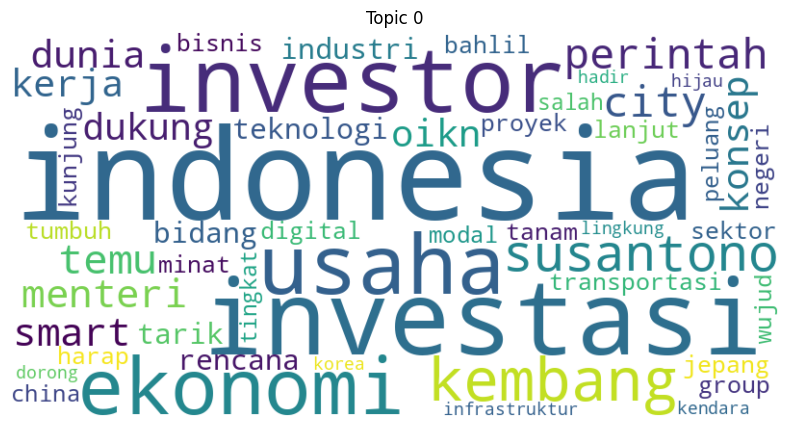

(1, '0.053*"menteri" + 0.026*"pupr" + 0.023*"kawasan" + 0.022*"rumah" + 0.022*"jalan" + 0.020*"kerja" + 0.016*"basuki" + 0.015*"perintah" + 0.014*"infrastruktur" + 0.013*"bandara" + 0.013*"tol" + 0.012*"kantor" + 0.011*"lahan" + 0.011*"tanah" + 0.011*"rencana" + 0.010*"rakyat" + 0.009*"pusat" + 0.009*"timur" + 0.008*"budi" + 0.008*"proyek" + 0.008*"kalimantan" + 0.008*"luas" + 0.008*"hadimuljono" + 0.008*"inti" + 0.008*"selesai" + 0.007*"laksana" + 0.007*"tahap" + 0.007*"hutan" + 0.007*"target" + 0.006*"kipp" + 0.006*"tata" + 0.006*"hubung" + 0.006*"gedung" + 0.006*"progres" + 0.005*"wilayah" + 0.005*"hektare" + 0.005*"karya" + 0.005*"desain" + 0.005*"jenderal" + 0.005*"nasional" + 0.005*"istana" + 0.005*"balikpapan" + 0.005*"dasar" + 0.004*"ruang" + 0.004*"heru" + 0.004*"lokasi" + 0.004*"konstruksi" + 0.004*"badan" + 0.004*"halaman" + 0.004*"persen"')


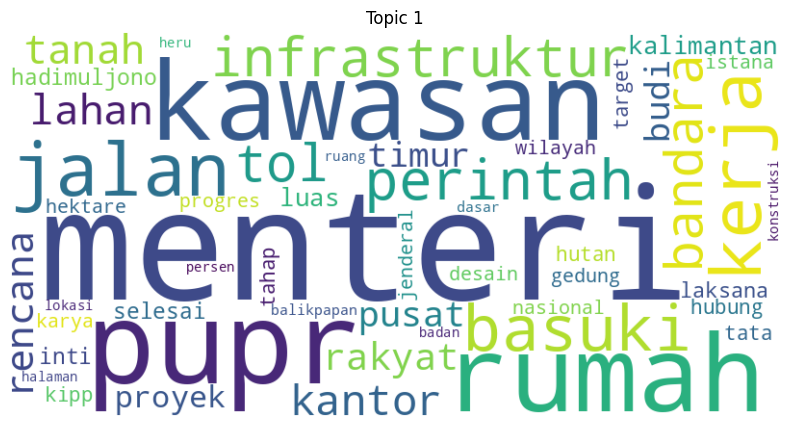

(2, '0.017*"pindah" + 0.016*"anies" + 0.015*"indonesia" + 0.014*"jawa" + 0.013*"partai" + 0.012*"ketua" + 0.011*"ganjar" + 0.010*"dki" + 0.010*"lanjut" + 0.010*"calon" + 0.009*"nilai" + 0.009*"wakil" + 0.009*"nomor" + 0.008*"politik" + 0.008*"kamil" + 0.008*"ridwan" + 0.008*"pilih" + 0.007*"tolak" + 0.007*"pks" + 0.007*"revisi" + 0.007*"kritik" + 0.007*"barat" + 0.006*"gubernur" + 0.006*"perintah" + 0.006*"rocky" + 0.006*"proyek" + 0.006*"gibran" + 0.006*"urut" + 0.006*"dukung" + 0.006*"gerung" + 0.006*"program" + 0.005*"kait" + 0.005*"imin" + 0.005*"nyata" + 0.005*"pdip" + 0.005*"cak" + 0.005*"arsitek" + 0.005*"perata" + 0.005*"mahasiswa" + 0.005*"pusat" + 0.004*"sebut" + 0.004*"pranowo" + 0.004*"pimpin" + 0.004*"tanggap" + 0.004*"nasional" + 0.004*"salah" + 0.004*"tuju" + 0.004*"ubah" + 0.004*"iskandar" + 0.004*"bangsa"')


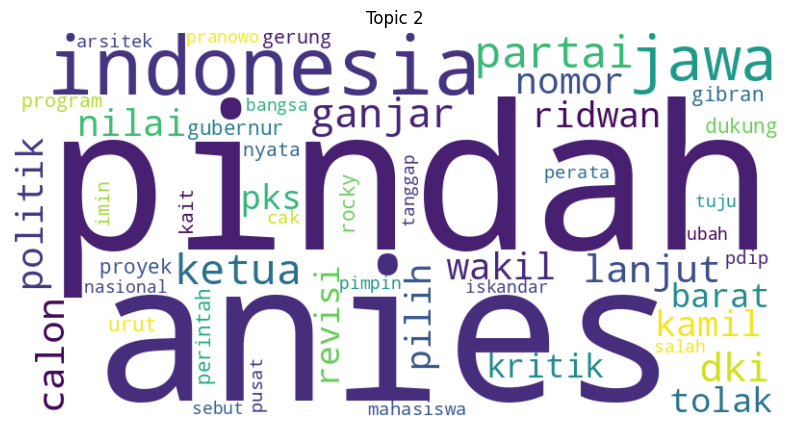

(3, '0.116*"otorita" + 0.091*"kepala" + 0.036*"bambang" + 0.023*"badan" + 0.017*"jabat" + 0.016*"lantik" + 0.014*"calon" + 0.014*"wakil" + 0.013*"nama" + 0.012*"pimpin" + 0.010*"pilih" + 0.009*"ahok" + 0.008*"ksp" + 0.008*"utama" + 0.007*"wandy" + 0.007*"dhony" + 0.007*"kantor" + 0.007*"menteri" + 0.007*"rahajoe" + 0.007*"ahli" + 0.006*"anas" + 0.006*"bri" + 0.006*"milik" + 0.006*"tenaga" + 0.006*"deputi" + 0.006*"umum" + 0.005*"staf" + 0.005*"buka" + 0.005*"sosok" + 0.005*"angkat" + 0.005*"daftar" + 0.005*"azwar" + 0.004*"resmi" + 0.004*"tuturoong" + 0.004*"pssi" + 0.004*"center" + 0.004*"birokrasi" + 0.004*"posisi" + 0.004*"kereta" + 0.004*"bola" + 0.004*"debat" + 0.004*"orang" + 0.004*"kriteria" + 0.004*"ayat" + 0.004*"timnas" + 0.004*"tim" + 0.004*"training" + 0.003*"pendayagunaan" + 0.003*"ribu" + 0.003*"mantan"')


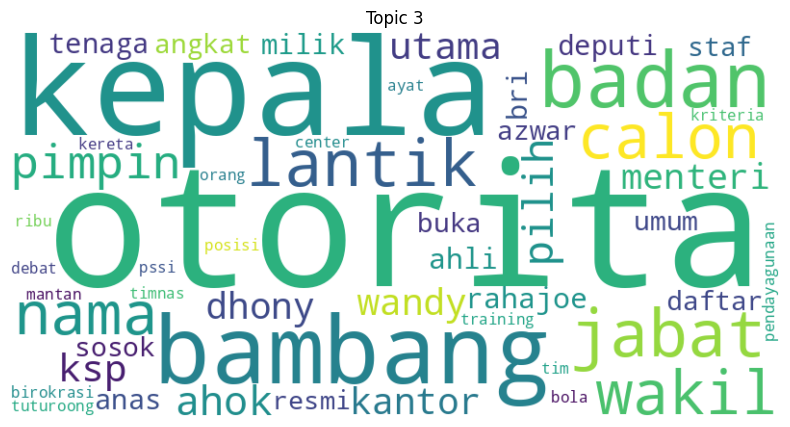

(4, '0.013*"luhut" + 0.012*"menteri" + 0.012*"kerja" + 0.011*"bidang" + 0.011*"ketua" + 0.011*"pemilu" + 0.010*"tani" + 0.010*"indonesia" + 0.009*"latih" + 0.009*"daya" + 0.009*"koordinator" + 0.009*"erick" + 0.008*"pangan" + 0.008*"didik" + 0.008*"program" + 0.007*"thohir" + 0.007*"budaya" + 0.007*"capital" + 0.006*"menko" + 0.006*"nasional" + 0.006*"buka" + 0.006*"universitas" + 0.006*"sumber" + 0.006*"pemuda" + 0.006*"tingkat" + 0.006*"airlangga" + 0.006*"sdm" + 0.006*"muda" + 0.006*"maritim" + 0.006*"pj" + 0.005*"seleksi" + 0.005*"saudi" + 0.005*"temu" + 0.005*"bamsoet" + 0.005*"said" + 0.005*"dukung" + 0.005*"sepak" + 0.005*"mpr" + 0.005*"oikn" + 0.005*"new" + 0.004*"akmal" + 0.004*"tony" + 0.004*"blair" + 0.004*"bin" + 0.004*"bal" + 0.004*"binsar" + 0.004*"cpns" + 0.004*"ri" + 0.004*"pandjaitan" + 0.004*"pusat"')


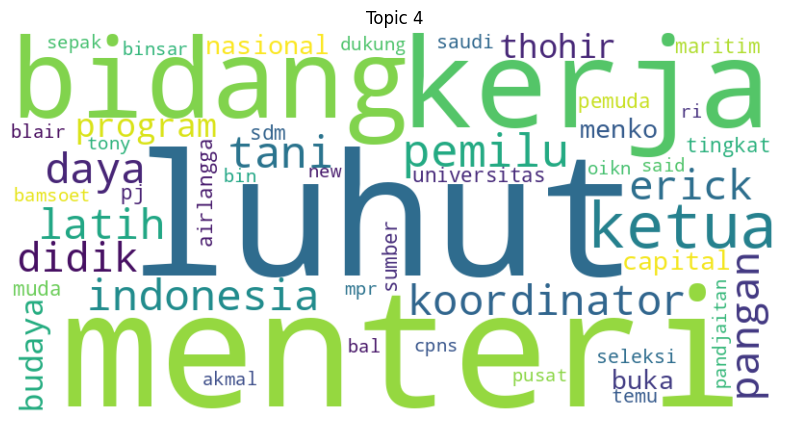

(5, '0.039*"rp" + 0.031*"proyek" + 0.024*"triliun" + 0.018*"pt" + 0.018*"anggar" + 0.017*"dana" + 0.015*"rumah" + 0.012*"apbn" + 0.010*"kerja" + 0.010*"huni" + 0.010*"persen" + 0.010*"groundbreaking" + 0.010*"miliar" + 0.009*"infrastruktur" + 0.009*"usaha" + 0.009*"capai" + 0.009*"bendung" + 0.009*"listrik" + 0.009*"butuh" + 0.008*"air" + 0.008*"biaya" + 0.008*"persero" + 0.007*"karya" + 0.007*"agung" + 0.007*"perintah" + 0.007*"direktur" + 0.007*"dukung" + 0.006*"tbk" + 0.006*"investasi" + 0.006*"sedia" + 0.006*"nilai" + 0.006*"belanja" + 0.006*"paku" + 0.006*"tower" + 0.006*"pln" + 0.006*"total" + 0.006*"tahap" + 0.006*"bumn" + 0.005*"swasta" + 0.005*"kalimantan" + 0.005*"rusun" + 0.005*"target" + 0.005*"semoi" + 0.005*"hotel" + 0.005*"nila" + 0.005*"milik" + 0.005*"oikn" + 0.005*"sakit" + 0.005*"konstruksi" + 0.005*"utama"')


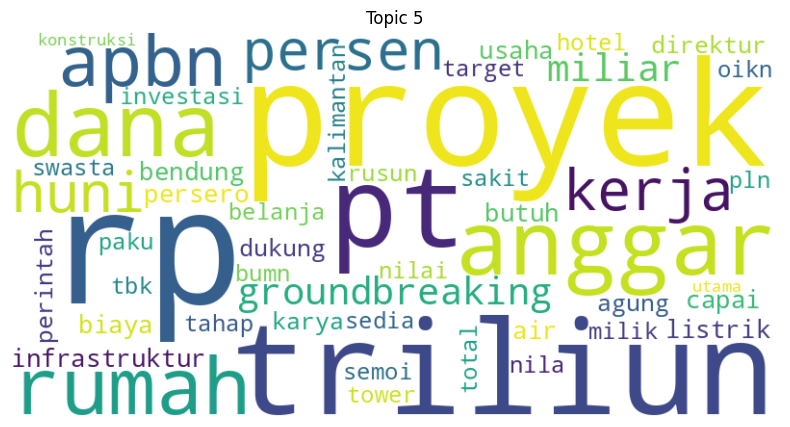

(6, '0.046*"pindah" + 0.033*"perintah" + 0.030*"uu" + 0.024*"dpr" + 0.023*"asn" + 0.018*"menteri" + 0.017*"undangundang" + 0.015*"atur" + 0.014*"ri" + 0.014*"rencana" + 0.013*"khusus" + 0.010*"nomor" + 0.010*"ruu" + 0.010*"daerah" + 0.009*"dki" + 0.009*"rapat" + 0.007*"bappenas" + 0.007*"nasional" + 0.007*"suharso" + 0.007*"aparatur" + 0.007*"uang" + 0.007*"bahas" + 0.007*"komisi" + 0.007*"rancang" + 0.007*"pasal" + 0.007*"sri" + 0.007*"anggota" + 0.006*"sipil" + 0.006*"kait" + 0.005*"mulyani" + 0.005*"ketua" + 0.005*"ahy" + 0.005*"status" + 0.005*"ubah" + 0.005*"pns" + 0.005*"tahap" + 0.005*"usul" + 0.004*"mk" + 0.004*"sah" + 0.004*"kalimantan" + 0.004*"siap" + 0.004*"putus" + 0.004*"timur" + 0.004*"pusat" + 0.004*"turun" + 0.004*"gugat" + 0.004*"ii" + 0.004*"bentuk" + 0.004*"fraksi" + 0.004*"monoarfa"')


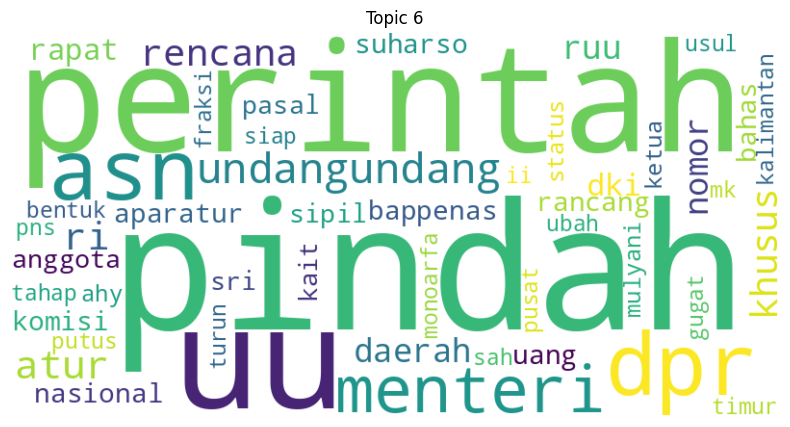

(7, '0.067*"kalimantan" + 0.050*"timur" + 0.020*"utara" + 0.019*"paser" + 0.019*"penajam" + 0.015*"kabupaten" + 0.014*"masyarakat" + 0.013*"provinsi" + 0.011*"gubernur" + 0.011*"daerah" + 0.010*"balikpapan" + 0.010*"wilayah" + 0.008*"tni" + 0.008*"ppu" + 0.008*"selatan" + 0.008*"tanah" + 0.007*"warga" + 0.007*"lokasi" + 0.006*"air" + 0.006*"barat" + 0.006*"paku" + 0.006*"camat" + 0.006*"sulawesi" + 0.006*"edy" + 0.005*"dukung" + 0.005*"pindah" + 0.005*"adat" + 0.005*"kait" + 0.005*"perintah" + 0.005*"panglima" + 0.004*"samarinda" + 0.004*"bupati" + 0.004*"kepala" + 0.004*"kpk" + 0.004*"kuta" + 0.004*"kawasan" + 0.004*"desa" + 0.004*"hadir" + 0.003*"dprd" + 0.003*"tahan" + 0.003*"harap" + 0.003*"milik" + 0.003*"ketua" + 0.003*"senin" + 0.003*"wakil" + 0.003*"dayak" + 0.003*"aman" + 0.003*"giat" + 0.003*"satu" + 0.003*"bawa"')


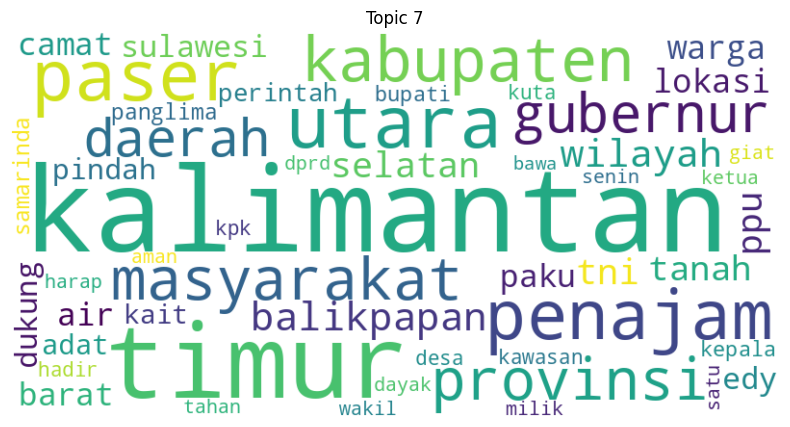

(8, '0.174*"joko" + 0.173*"widodo" + 0.019*"istana" + 0.009*"kalimantan" + 0.009*"indonesia" + 0.009*"timur" + 0.008*"nol" + 0.007*"mulyadi" + 0.007*"resmi" + 0.007*"kunjung" + 0.007*"rabu" + 0.006*"titik" + 0.006*"ri" + 0.006*"prabowo" + 0.006*"groundbreaking" + 0.006*"baswedan" + 0.005*"selasa" + 0.005*"presiden" + 0.005*"upacara" + 0.005*"kemah" + 0.005*"kamis" + 0.005*"sekretariat" + 0.005*"vvip" + 0.004*"kontrak" + 0.004*"merdeka" + 0.004*"temu" + 0.004*"langsung" + 0.004*"capres" + 0.004*"agustus" + 0.004*"malam" + 0.004*"cawapres" + 0.003*"tinjau" + 0.003*"acara" + 0.003*"desain" + 0.003*"amin" + 0.003*"pohon" + 0.003*"sambut" + 0.003*"youtube" + 0.003*"hut" + 0.003*"kawasan" + 0.003*"hadir" + 0.003*"pimpin" + 0.003*"siar" + 0.003*"sebut" + 0.003*"rencana" + 0.003*"gelar" + 0.003*"jumat" + 0.003*"wapres" + 0.003*"garuda" + 0.003*"bbm"')


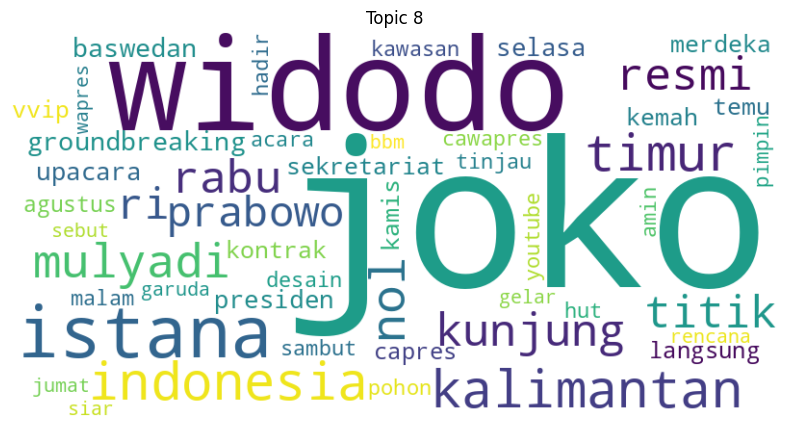

Topic 0 Top URLs:
https://kumparan.com/kumparantech/alibaba-cloud-siap-dukung-pembangunan-ibu-kota-baru-di-kaltim-1seb76af5qz
https://kumparan.com/kumparantech/alibaba-cloud-mau-ikut-investasi-bangun-ibu-kota-baru-di-kaltim-1seb76af5qz
https://kumparan.com/kumparantech/alibaba-cloud-siap-dukung-pembangunan-ibu-kota-baru-di-kaltim-1seb76AF5QZ

Topic 1 Top URLs:
http://www.idntimes.com/business/economy/triyan-pangastuti/dikebut-progres-pembangunan-ikn-tahap-i-capai-40-persen
http://www.jawapos.com/nasional/012433512/pupr-klaim-jalan-tol-ikn-selesai-pertengahan-2024
http://www.kompas.com/properti/read/2021/12/15/120000021/danis-h-sumadilaga-ditunjuk-jadi-ketua-satgas-pelaksanaan-pembangunan

Topic 2 Top URLs:
http://www.merdeka.com/politik/gibran-slepet-cak-imin-soal-tumpengan-di-ikn-ini-pembelaan-pkb-66488-mvk.html
http://wow.tribunnews.com/2023/11/24/hanya-anies-muhaimin-yang-kritisi-soal-ikn-2-paslon-lainnya-janji-akan-lanjutkan-pembangunan
http://nasional.kompas.com/read/2023/11/27/08

In [ ]:
from gensim.corpora.dictionary import Dictionary
from gensim.models.ldamodel import LdaModel
import gensim.corpora as corpora
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import pandas as pd

# Load the dictionary and corpus
dictionary = Dictionary.load('/content/drive/MyDrive/THESIS/model/IKN_dictionary.dict')
corpus = corpora.MmCorpus('/content/drive/MyDrive/THESIS/model/IKN_corpus.mm')

# Load the model
model_path = '/content/drive/MyDrive/THESIS/model/LDA_model_9_topics.model'
specific_model = LdaModel.load(model_path)

# Load your DataFrame
df = pd.read_csv('/content/drive/MyDrive/THESIS/ULTIMATE_DATASET_TEXT.csv')

# Function to display topics for the loaded model
def display_topics(model, num_words=50):
    topics = model.print_topics(num_words=num_words)
    for topic in topics:
        print(topic)

        # Generate and display word cloud for each topic
        topic_words = dict(model.show_topic(topic[0], num_words))
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(topic_words)

        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.title(f"Topic {topic[0]}")
        plt.show()

# Function to get the top 3 URLs for each topic
def get_top_urls(model, corpus, df, num_topics=9, top_n=3):
    topic_docs = [[] for _ in range(num_topics)]

    for i, row in enumerate(model[corpus]):
        topic_distribution = sorted(row, key=lambda x: -x[1])
        top_topic = topic_distribution[0][0]
        topic_docs[top_topic].append((topic_distribution[0][1], df.iloc[i]['URL']))

    top_urls = {}
    for topic_id in range(num_topics):
        if topic_docs[topic_id]:
            sorted_docs = sorted(topic_docs[topic_id], key=lambda x: -x[0])
            top_urls[topic_id] = [url for _, url in sorted_docs[:top_n]]
        else:
            top_urls[topic_id] = ["No significant documents for this topic"]

    return top_urls

# Function to assign the dominant topic to each document in the DataFrame
def assign_topics_to_df(model, corpus, df):
    topic_assignments = []

    for row in model[corpus]:
        topic_distribution = sorted(row, key=lambda x: -x[1])
        dominant_topic = topic_distribution[0][0]
        topic_assignments.append(dominant_topic)

    df['topic'] = topic_assignments
    return df

# Display topics for the loaded model
display_topics(specific_model)

# Get top URLs for each topic
top_urls = get_top_urls(specific_model, corpus, df)

# Display top URLs for each topic
for topic_id, urls in top_urls.items():
    print(f"Topic {topic_id} Top URLs:")
    for url in urls:
        print(url)
    print()

# Assign the dominant topic to each document in the DataFrame
df = assign_topics_to_df(specific_model, corpus, df)

# Display the DataFrame with the new 'topic' column
print(df.head())


In [ ]:
import pandas as pd

def filter_influencers(row):
    influencers = row['Influencers'].split(',')
    summary_text = row['Summary'].lower()  # Convert summary to lower case for case-insensitive matching
    filtered_influencers = [influencer for influencer in influencers if influencer.strip().lower() in summary_text]
    return ','.join(filtered_influencers)

# Apply the filtering function to each row
df['Influencers'] = df.apply(filter_influencers, axis=1)

# Display the DataFrame to verify changes
print(df.head())


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


   No                 Date      Time  \
0   1  2020-01-01 00:00:00  07:12:52   
1  51  2020-01-02 00:00:00  17:00:31   
2  62  2020-01-03 00:00:00  10:10:12   
3  63  2020-01-03 00:00:00  10:44:19   
4  64  2020-01-03 00:00:00  10:54:10   

                                               Title  \
0  Politisi Demokrat Minta Jokowi Pikir Lagi Soal...   
1  Hmi Cabang Kukar Ingatkan Warga Tak Menjual La...   
2  Hari Ini Dalam Sejarah&#58; Pemindahan Ibu Kot...   
3  Luhut Rapat Bersama Menteri Pupr Dan Juara Say...   
4  Luhut Panggil Pemenang Sayembara Desain Ibu Ko...   

                                                 URL               Media  \
0  https://wow.tribunnews.com/2020/01/01/politisi...          Tribun Wow   
1  https://kaltim.tribunnews.com/2020/01/02/hmi-c...  Tribun News Kaltim   
2  https://www.kompas.com/tren/read/2020/01/03/10...              Kompas   
3  https://bisnis.tempo.co/read/1290616/luhut-rap...            Tempo.Co   
4  https://finance.detik.com/properti/d-48

In [ ]:
# Define the topic names
topic_names = {
    'Topic_0': 'Investment and Economic Development in Indonesia',
    'Topic_1': 'Infrastructure and Housing Development',
    'Topic_2': 'Political Dynamics and Elections',
    'Topic_3': 'Leadership and Administrative Changes',
    'Topic_4': 'Coordination and Government Programs',
    'Topic_5': 'Financial Investments and Large-scale Projects',
    'Topic_6': 'Legislation and Government Policies',
    'Topic_7': 'Regional Development in Kalimantan',
    'Topic_8': 'Presidential Activities and Statements'
}

# Map the topic numbers to their names
df['Topic_Name'] = df['topic'].apply(lambda x: topic_names.get(f'Topic_{x}', 'Unknown'))

# Calculate the average score for each topic
average_scores_by_topic = df.groupby('Topic_Name')['Influencer_Score'].mean().sort_values()

# Plot the average scores by topic
plt.figure(figsize=(14, 8))
average_scores_by_topic.plot(kind='barh', color='skyblue')
plt.title('Average Influencer Scores by Topic')
plt.xlabel('Average Influencer Score')
plt.ylabel('Topic')
plt.grid(axis='x')
plt.show()

# ============SA MODELLING================


## Checking Performances of 2 models

In [48]:
import torch
from datasets import load_dataset
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from sklearn.model_selection import StratifiedKFold
from tqdm import tqdm
import numpy as np

# Load the IndoNLU SmSA sentiment analysis dataset
print("Loading dataset...")
dataset = load_dataset("indonlp/indonlu", "smsa", split="test")
print(dataset)

# Function to evaluate the model using k-fold cross-validation
def evaluate_sentiment_model_kfold(model_name, dataset, k=5):
    tokenizer = AutoTokenizer.from_pretrained(model_name)
    model = AutoModelForSequenceClassification.from_pretrained(model_name)

    # Extract texts and labels
    texts = [item['text'] for item in dataset]
    labels = [item['label'] for item in dataset]

    skf = StratifiedKFold(n_splits=k)

    all_fold_metrics = []

    for fold, (train_idx, test_idx) in enumerate(skf.split(texts, labels)):
        print(f"\nEvaluating fold {fold + 1}/{k} for model {model_name}")

        # Split into train and test for this fold
        train_texts = [texts[i] for i in train_idx]
        train_labels = [labels[i] for i in train_idx]
        test_texts = [texts[i] for i in test_idx]
        test_labels = [labels[i] for i in test_idx]

        all_true_labels = []
        all_pred_labels = []

        for text, true_label in tqdm(zip(test_texts, test_labels), desc=f"Evaluating fold {fold + 1}/{k}"):
            inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True)
            with torch.no_grad():
                outputs = model(**inputs)

            predictions = torch.argmax(outputs.logits, dim=1).cpu().numpy()
            pred_labels = predictions[0]

            # Append true labels and predictions
            all_true_labels.append(true_label)
            all_pred_labels.append(pred_labels)

        # Calculate metrics for this fold
        accuracy = accuracy_score(all_true_labels, all_pred_labels)
        f1 = f1_score(all_true_labels, all_pred_labels, average='weighted')
        precision = precision_score(all_true_labels, all_pred_labels, average='weighted')
        recall = recall_score(all_true_labels, all_pred_labels, average='weighted')

        all_fold_metrics.append((accuracy, f1, precision, recall))
        print(f"Fold {fold + 1} - Accuracy: {accuracy:.4f}, F1-score: {f1:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}")

    # Average the metrics across all folds
    avg_metrics = np.mean(all_fold_metrics, axis=0)
    return avg_metrics

# Define the models to compare
models = ['w11wo/indonesian-roberta-base-sentiment-classifier', 'mdhugol/indonesia-bert-sentiment-classification']

# Evaluate and compare the models using k-fold cross-validation
for model_name in models:
    print(f"\nEvaluating {model_name}")
    accuracy, f1, precision, recall = evaluate_sentiment_model_kfold(model_name, dataset, k=5)
    print("Average Accuracy: {:.4f}".format(accuracy))
    print("Average F1-score: {:.4f}".format(f1))
    print("Average Precision: {:.4f}".format(precision))
    print("Average Recall: {:.4f}".format(recall))


Loading dataset...
Dataset({
    features: ['text', 'label'],
    num_rows: 500
})

Evaluating w11wo/indonesian-roberta-base-sentiment-classifier

Evaluating fold 1/5 for model w11wo/indonesian-roberta-base-sentiment-classifier


Evaluating fold 1/5: 0it [00:00, ?it/s]Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.
Evaluating fold 1/5: 100it [00:05, 17.90it/s]


Fold 1 - Accuracy: 0.9300, F1-score: 0.9250, Precision: 0.9349, Recall: 0.9300

Evaluating fold 2/5 for model w11wo/indonesian-roberta-base-sentiment-classifier


Evaluating fold 2/5: 100it [00:06, 15.68it/s]


Fold 2 - Accuracy: 0.9600, F1-score: 0.9600, Precision: 0.9605, Recall: 0.9600

Evaluating fold 3/5 for model w11wo/indonesian-roberta-base-sentiment-classifier


Evaluating fold 3/5: 100it [00:07, 13.91it/s]


Fold 3 - Accuracy: 0.9600, F1-score: 0.9591, Precision: 0.9595, Recall: 0.9600

Evaluating fold 4/5 for model w11wo/indonesian-roberta-base-sentiment-classifier


Evaluating fold 4/5: 100it [00:05, 18.60it/s]


Fold 4 - Accuracy: 0.9200, F1-score: 0.9169, Precision: 0.9264, Recall: 0.9200

Evaluating fold 5/5 for model w11wo/indonesian-roberta-base-sentiment-classifier


Evaluating fold 5/5: 100it [00:03, 26.88it/s]


Fold 5 - Accuracy: 0.8900, F1-score: 0.8842, Precision: 0.8879, Recall: 0.8900
Average Accuracy: 0.9320
Average F1-score: 0.9290
Average Precision: 0.9338
Average Recall: 0.9320

Evaluating mdhugol/indonesia-bert-sentiment-classification

Evaluating fold 1/5 for model mdhugol/indonesia-bert-sentiment-classification


Evaluating fold 1/5: 0it [00:00, ?it/s]Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.
Evaluating fold 1/5: 100it [00:06, 16.21it/s]


Fold 1 - Accuracy: 0.9300, F1-score: 0.9250, Precision: 0.9347, Recall: 0.9300

Evaluating fold 2/5 for model mdhugol/indonesia-bert-sentiment-classification


Evaluating fold 2/5: 100it [00:07, 13.97it/s]


Fold 2 - Accuracy: 0.9400, F1-score: 0.9383, Precision: 0.9427, Recall: 0.9400

Evaluating fold 3/5 for model mdhugol/indonesia-bert-sentiment-classification


Evaluating fold 3/5: 100it [00:05, 19.74it/s]


Fold 3 - Accuracy: 0.9600, F1-score: 0.9581, Precision: 0.9623, Recall: 0.9600

Evaluating fold 4/5 for model mdhugol/indonesia-bert-sentiment-classification


Evaluating fold 4/5: 100it [00:04, 20.24it/s]


Fold 4 - Accuracy: 0.8900, F1-score: 0.8848, Precision: 0.8888, Recall: 0.8900

Evaluating fold 5/5 for model mdhugol/indonesia-bert-sentiment-classification


Evaluating fold 5/5: 100it [00:03, 26.17it/s]

Fold 5 - Accuracy: 0.8700, F1-score: 0.8595, Precision: 0.8831, Recall: 0.8700
Average Accuracy: 0.9180
Average F1-score: 0.9131
Average Precision: 0.9223
Average Recall: 0.9180


## Training the model

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
import torch
from transformers import AutoTokenizer, Trainer, TrainingArguments, DataCollatorWithPadding, EarlyStoppingCallback, get_linear_schedule_with_warmup
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
import optuna
import numpy as np
from datasets import Dataset
import re
import nltk
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
from nltk.corpus import stopwords

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Download stopwords
nltk.download('stopwords')

# Load the labeled dataset
labeled_df = pd.read_csv('/content/drive/MyDrive/THESIS/LABELED_SA.csv')

# Get the Indonesian stopwords
stop_words = set(stopwords.words('indonesian'))

# Initialize the Sastrawi Stemmer
factory = StemmerFactory()
stemmer = factory.create_stemmer()

# Function to remove or replace specific HTML entities and convert dashes to spaces
def clean_html_entities(text):
    if pd.isna(text):
        return text

    replacements = {
        '&#x201d;': '"',
        '&#x201c;': '"',
        '&ndash;': ' ',
        '&#x2019;': "'",
        '&#x2018;': "'",
        '&#58;': ':',
        '&#39;': "'",
        '&quot;': '"',
        '&#x2013;': ' ',
    }

    for entity, replacement in replacements.items():
        text = text.replace(entity, replacement)

    text = text.replace('-', ' ')
    text = re.sub(r'&[a-zA-Z0-9#]+;', '', text)

    return text

# Function to clean text: remove special characters, numbers, and stopwords, and lowercase the text
def clean_text(text):
    if isinstance(text, float):
        text = ""  # Handle cases where text is NaN or float

    text = clean_html_entities(text)
    text = text.lower()
    text = re.sub(r'\d+', '', text)  # Remove numbers
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation and special characters
    text = re.sub(r'\s+', ' ', text).strip()  # Remove excess whitespace

    words = text.split()
    words_cleaned = [word for word in words if word not in stop_words]

    return ' '.join(words_cleaned)

# Convert all entries in the "Title" column to strings, handling NaN values
labeled_df['Title'] = labeled_df['Title'].astype(str)

# Apply the clean_text function to the Title column to create Cleaned_Title
labeled_df['Cleaned_Title'] = labeled_df['Title'].apply(clean_text)

# Split the dataset into training (80%), temp (20%)
train_df, temp_df = train_test_split(labeled_df, test_size=0.2, random_state=42)

# Split the temp set into validation (10%) and test (10%) of the original dataset
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=42)

# Initialize the tokenizer and model
model_name = "w11wo/indonesian-roberta-base-sentiment-classifier"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=3)

# Encode the datasets
def encode(examples):
    return tokenizer(examples['Cleaned_Title'], truncation=True, padding='max_length', max_length=128)

# Convert DataFrame to Hugging Face Dataset
train_dataset = Dataset.from_pandas(train_df)
val_dataset = Dataset.from_pandas(val_df)
test_dataset = Dataset.from_pandas(test_df)

# Apply the tokenizer to the datasets
train_dataset = train_dataset.map(encode, batched=True)
val_dataset = val_dataset.map(encode, batched=True)
test_dataset = test_dataset.map(encode, batched=True)

# Convert Tone to numeric labels
label_map = {'Positive': 0, 'Neutral': 1, 'Negative': 2}
train_dataset = train_dataset.map(lambda examples: {'labels': label_map[examples['Tone']]})
val_dataset = val_dataset.map(lambda examples: {'labels': label_map[examples['Tone']]})
test_dataset = test_dataset.map(lambda examples: {'labels': label_map[examples['Tone']]})

# Set the format of the dataset for PyTorch
train_dataset.set_format(type='torch', columns=['input_ids', 'attention_mask', 'labels'])
val_dataset.set_format(type='torch', columns=['input_ids', 'attention_mask', 'labels'])
test_dataset.set_format(type='torch', columns=['input_ids', 'attention_mask', 'labels'])

# Compute class weights
class_counts = train_df['Tone'].value_counts().sort_index()
class_weights = 1.0 / class_counts
class_weights = class_weights / class_weights.sum()
class_weights = torch.tensor(class_weights.values, dtype=torch.float)

# Define the objective function for Optuna
def objective(trial):
    dropout_rate = trial.suggest_uniform('dropout_rate', 0.1, 0.5)
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-6, 5e-5)
    per_device_train_batch_size = trial.suggest_categorical('per_device_train_batch_size', [8, 16, 32])
    num_train_epochs = trial.suggest_int('num_train_epochs', 2, 10)
    warmup_steps = trial.suggest_int('warmup_steps', 0, 200) if trial.suggest_categorical('warmup_option', [0, 1]) == 0 else trial.suggest_int('warmup_steps', 1, 200)
    weight_decay = trial.suggest_loguniform('weight_decay', 1e-5, 0.1)

    model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=3).to(device)

    training_args = TrainingArguments(
        output_dir=f'./results',
        num_train_epochs=num_train_epochs,
        per_device_train_batch_size=per_device_train_batch_size,
        per_device_eval_batch_size=8,
        warmup_steps=warmup_steps,
        weight_decay=weight_decay,
        learning_rate=learning_rate,
        logging_dir=f'./logs',
        logging_steps=10,
        evaluation_strategy="epoch",
        save_strategy="epoch",
        load_best_model_at_end=True,
        save_total_limit=3,
    )

    optimizer = torch.optim.AdamW(model.parameters(), lr=training_args.learning_rate)
    num_training_steps = len(train_dataset) // training_args.per_device_train_batch_size * training_args.num_train_epochs
    scheduler = get_linear_schedule_with_warmup(
        optimizer,
        num_warmup_steps=training_args.warmup_steps,
        num_training_steps=num_training_steps
    )

    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=val_dataset,
        data_collator=DataCollatorWithPadding(tokenizer),
        optimizers=(optimizer, scheduler),
        callbacks=[EarlyStoppingCallback(early_stopping_patience=2)],
    )

    trainer.train()

    eval_results = trainer.evaluate(val_dataset)
    return eval_results['eval_loss']  # Optimize for validation loss

# Optuna study
study = optuna.create_study(direction='minimize')  # Minimize validation loss
study.optimize(objective, n_trials=10)

# Print best parameters
print("Best hyperparameters:", study.best_params)

# Final training with best hyperparameters
best_params = study.best_params

model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=3).to(device)

training_args = TrainingArguments(
    output_dir=f'./results',
    num_train_epochs=best_params['num_train_epochs'],
    per_device_train_batch_size=best_params['per_device_train_batch_size'],
    per_device_eval_batch_size=32,
    warmup_steps=best_params['warmup_steps'],
    weight_decay=best_params['weight_decay'],
    learning_rate=best_params['learning_rate'],
    logging_dir=f'./logs',
    logging_steps=10,
    evaluation_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,
    save_total_limit=3,
)

optimizer = torch.optim.AdamW(model.parameters(), lr=training_args.learning_rate)
num_training_steps = len(train_dataset) // training_args.per_device_train_batch_size * training_args.num_train_epochs
scheduler = get_linear_schedule_with_warmup(
    optimizer,
    num_warmup_steps=training_args.warmup_steps,
    num_training_steps=num_training_steps
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    data_collator=DataCollatorWithPadding(tokenizer),
    optimizers=(optimizer, scheduler),
    callbacks=[EarlyStoppingCallback(early_stopping_patience=2)],
)

# Train the final model
trainer.train()


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Map:   0%|          | 0/7920 [00:00<?, ? examples/s]

Map:   0%|          | 0/990 [00:00<?, ? examples/s]

Map:   0%|          | 0/990 [00:00<?, ? examples/s]

Map:   0%|          | 0/7920 [00:00<?, ? examples/s]

Map:   0%|          | 0/990 [00:00<?, ? examples/s]

Map:   0%|          | 0/990 [00:00<?, ? examples/s]

[I 2024-09-02 22:04:10,850] A new study created in memory with name: no-name-1cd2a16b-b39c-4626-bcd4-31ba966f9ed1
<ipython-input-72-5e386f439279>:120: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform('dropout_rate', 0.1, 0.5)
<ipython-input-72-5e386f439279>:121: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-6, 5e-5)
<ipython-input-72-5e386f439279>:125: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform

Epoch,Training Loss,Validation Loss
1,0.891900,0.873130
2,0.866300,0.810963
3,0.832800,0.801132


[I 2024-09-02 22:06:38,330] Trial 0 finished with value: 0.8011317253112793 and parameters: {'dropout_rate': 0.23818147076552512, 'learning_rate': 1.4879299751853357e-06, 'per_device_train_batch_size': 32, 'num_train_epochs': 3, 'warmup_option': 0, 'warmup_steps': 71, 'weight_decay': 0.0004472736596997828}. Best is trial 0 with value: 0.8011317253112793.
<ipython-input-72-5e386f439279>:120: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform('dropout_rate', 0.1, 0.5)
<ipython-input-72-5e386f439279>:121: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-6, 5e-5)
<ipython-input-72-5e386f439279>:125: Fut

Epoch,Training Loss,Validation Loss
1,0.728800,0.690118
2,0.625900,0.701885
3,0.473000,0.866125


[I 2024-09-02 22:09:50,549] Trial 1 finished with value: 0.6901179552078247 and parameters: {'dropout_rate': 0.10722902168110049, 'learning_rate': 2.0856447607186374e-05, 'per_device_train_batch_size': 8, 'num_train_epochs': 4, 'warmup_option': 1, 'warmup_steps': 127, 'weight_decay': 0.0004891041791848897}. Best is trial 1 with value: 0.6901179552078247.
<ipython-input-72-5e386f439279>:120: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform('dropout_rate', 0.1, 0.5)
<ipython-input-72-5e386f439279>:121: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-6, 5e-5)
<ipython-input-72-5e386f439279>:125: Fut

Epoch,Training Loss,Validation Loss
1,0.733000,0.713725
2,0.695200,0.712003
3,0.524600,0.830577
4,0.617500,0.854392


[I 2024-09-02 22:14:04,310] Trial 2 finished with value: 0.712003231048584 and parameters: {'dropout_rate': 0.18768681693090655, 'learning_rate': 8.358778047024518e-06, 'per_device_train_batch_size': 8, 'num_train_epochs': 10, 'warmup_option': 1, 'warmup_steps': 104, 'weight_decay': 0.07257323644991488}. Best is trial 1 with value: 0.6901179552078247.
<ipython-input-72-5e386f439279>:120: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform('dropout_rate', 0.1, 0.5)
<ipython-input-72-5e386f439279>:121: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-6, 5e-5)
<ipython-input-72-5e386f439279>:125: Future

Epoch,Training Loss,Validation Loss
1,0.738100,0.776356
2,0.666700,0.718904
3,0.551600,0.722927
4,0.626300,0.720093


[I 2024-09-02 22:17:32,035] Trial 3 finished with value: 0.7189041376113892 and parameters: {'dropout_rate': 0.24649118285895805, 'learning_rate': 4.1617144236490845e-06, 'per_device_train_batch_size': 16, 'num_train_epochs': 9, 'warmup_option': 0, 'warmup_steps': 9, 'weight_decay': 0.025176254401095992}. Best is trial 1 with value: 0.6901179552078247.
<ipython-input-72-5e386f439279>:120: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform('dropout_rate', 0.1, 0.5)
<ipython-input-72-5e386f439279>:121: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-6, 5e-5)
<ipython-input-72-5e386f439279>:125: Futur

Epoch,Training Loss,Validation Loss
1,0.749100,0.725868
2,0.726100,0.703457


Epoch,Training Loss,Validation Loss
1,0.749100,0.725868
2,0.726100,0.703457
3,0.550100,0.770227


<ipython-input-26-657e39e8f92e>:69: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}


Test Results: {'eval_loss': 0.3366243243217468, 'eval_accuracy': 0.9, 'eval_f1': 0.8998880486612721, 'eval_precision': 0.9001276659618639, 'eval_recall': 0.9, 'eval_runtime': 1.7484, 'eval_samples_per_second': 566.227, 'eval_steps_per_second': 17.73, 'epoch': 4.0}


<ipython-input-26-657e39e8f92e>:69: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}


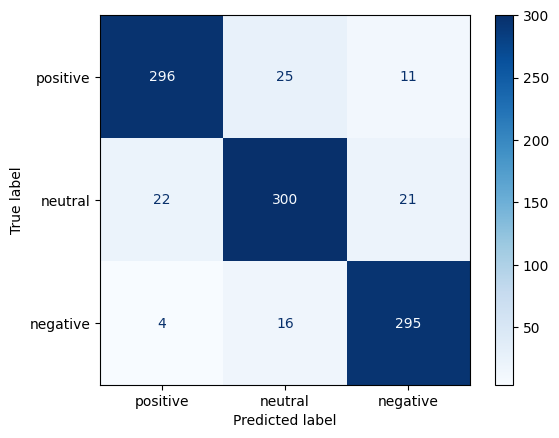

In [ ]:
# Evaluate on the test set
test_results = trainer.evaluate(test_dataset)
print("Test Results:", test_results)

# Predictions and evaluation
outputs = trainer.predict(test_dataset)
preds = outputs.predictions.argmax(-1)
labels = outputs.label_ids

# Confusion matrix
conf_matrix = confusion_matrix(labels, preds)
disp = ConfusionMatrixDisplay(conf_matrix, display_labels=label_mapping.keys())
disp.plot(cmap=plt.cm.Blues)
plt.show()

# Custom compute metrics function
def compute_metrics(p):
    preds = p.predictions.argmax(-1)
    precision, recall, f1, _ = precision_recall_fscore_support(p.label_ids, preds, average='weighted')
    acc = accuracy_score(p.label_ids, preds)
    return {
        'accuracy': acc,
        'f1': f1,
        'precision': precision,
        'recall': recall
    }

## Implementing on Dataset to predict Title

In [56]:
import pandas as pd
import torch
from transformers import AutoTokenizer, AutoModelForSequenceClassification

# Load your dataset
df = pd.read_csv('/content/drive/MyDrive/THESIS/READY.csv')

# Load the fine-tuned model and tokenizer
model_name = "/content/drive/MyDrive/THESIS/roberta-tuned"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name)
model.eval()

# Preprocess the Cleaned_Title column
def preprocess_text(text):
    # Tokenize the text
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=128)
    return inputs

# Function to predict sentiment
def predict_sentiment(text):
    inputs = preprocess_text(text)
    with torch.no_grad():
        outputs = model(**inputs)
        predictions = torch.argmax(outputs.logits, dim=1)
        return predictions.item()

# Apply sentiment prediction on the Cleaned_Title column
df['Predicted_Sentiment'] = df['Cleaned_Title'].apply(predict_sentiment)

# Map the predicted sentiment labels to actual sentiments
label_mapping = {0: 'Positive', 1: 'Neutral', 2: 'Negative'}
df['Predicted_Sentiment_Label'] = df['Predicted_Sentiment'].map(label_mapping)

# Save the predictions to a new CSV file
df.to_csv('READY.csv', index=False)

print("Sentiment predictions have been added and saved to 'READY_with_predictions.csv'.")


Sentiment predictions have been added and saved to 'READY_with_predictions.csv'.


# ============ANALYSIS================


In [ ]:
import re

df = pd.read_csv('/content/drive/MyDrive/THESIS/READY.csv')
# List of base URLs to check
base_urls = [
    r'.*detik.com.*',
    r'.*kompas.com.*',
    r'.*cnnindonesia.com.*',
    r'.*tribunnews.com.*',
    r'.*metrotvnews.com.*',
    r'.*tvonenews.com.*',
    r'.*liputan6.com.*',
    r'.*kumparan.com.*',
    r'.*viva.co.id.*',
    r'.*tempo.co.*',
    r'.*okezone.com.*',
    r'.*idntimes.com.*',
    r'.*sindonews.com.*',
    r'.*merdeka.com.*',
    r'.*bbc.com.*',
    r'.*jawapos.com.*'
]

# Function to count articles for each base URL
def count_articles(urls, base_urls):
    counts = {url: 0 for url in base_urls}
    for article_url in urls:
        for base_url in base_urls:
            if re.match(base_url, article_url, re.IGNORECASE):
                counts[base_url] += 1
                break
    return counts

# Count articles
article_counts = count_articles(df['URL'], base_urls)

# Sort the results by count in descending order
sorted_counts = sorted(article_counts.items(), key=lambda x: x[1], reverse=True)

# Print the results
print("Number of articles per base URL:")
for base_url, count in sorted_counts:
    print(f"{base_url}: {count}")

# Calculate total articles and percentage
total_articles = sum(article_counts.values())
other_articles = len(df) - total_articles

print(f"\
Total articles in dataset: {len(df)}")
print(f"Articles matching specified base URLs: {total_articles}")
print(f"Articles from other sources: {other_articles}")
print(f"Percentage of articles from specified base URLs: {(total_articles / len(df)) * 100:.2f}%")

Number of articles per base URL:
.*tribunnews.com.*: 11679
.*kompas.com.*: 4603
.*detik.com.*: 3925
.*tempo.co.*: 3155
.*liputan6.com.*: 2299
.*okezone.com.*: 2284
.*jawapos.com.*: 2171
.*merdeka.com.*: 1916
.*cnnindonesia.com.*: 1650
.*sindonews.com.*: 1458
.*kumparan.com.*: 1274
.*idntimes.com.*: 1236
.*viva.co.id.*: 1206
.*metrotvnews.com.*: 552
.*tvonenews.com.*: 441
.*bbc.com.*: 18
Total articles in dataset: 39867
Articles matching specified base URLs: 39867
Articles from other sources: 0
Percentage of articles from specified base URLs: 100.00%


In [ ]:
import pandas as pd
from collections import Counter

# Group the DataFrame by 'topic'
grouped = df.groupby('topic')

# Iterate through each topic group
for topic, group in grouped:
    # Combine all tokenized and stemmed texts for the current topic
    all_tokens = [token for sublist in group['text_tokenised_stemmed'] for token in eval(sublist)]

    # Calculate word frequencies
    word_freq = Counter(all_tokens)

    # Print the most common words for the current topic
    print(f"Most frequent words in topic {topic}:")
    print(word_freq.most_common(30))  # Adjust the number as needed
    print()


Most frequent words in topic 0:
[('kota', 10329), ('bangun', 7621), ('indonesia', 7567), ('investasi', 5870), ('joko', 5612), ('widodo', 5583), ('investor', 3623), ('menteri', 3371), ('usaha', 3192), ('perintah', 2953), ('otorita', 2595), ('kalimantan', 2490), ('kerja', 2242), ('ekonomi', 2173), ('proyek', 2151), ('timur', 2140), ('kembang', 2088), ('temu', 2003), ('rencana', 1585), ('bidang', 1440), ('dukung', 1414), ('city', 1359), ('kepala', 1349), ('infrastruktur', 1322), ('bambang', 1311), ('jepang', 1249), ('pindah', 1187), ('bahlil', 1174), ('minat', 1147), ('teknologi', 1120)]

Most frequent words in topic 1:
[('bangun', 10126), ('menteri', 7136), ('kota', 6479), ('pupr', 4104), ('jalan', 3221), ('kerja', 3138), ('rumah', 3131), ('perintah', 2774), ('kawasan', 2761), ('tol', 2353), ('kalimantan', 2348), ('timur', 2175), ('infrastruktur', 2110), ('basuki', 1926), ('joko', 1889), ('widodo', 1874), ('proyek', 1781), ('rencana', 1727), ('tanah', 1632), ('rakyat', 1427), ('istana', 

# OVERALL TOPICS

<ipython-input-5-083f508bba49>:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=topic_counts.index, y=topic_counts.values, palette=topic_colors)


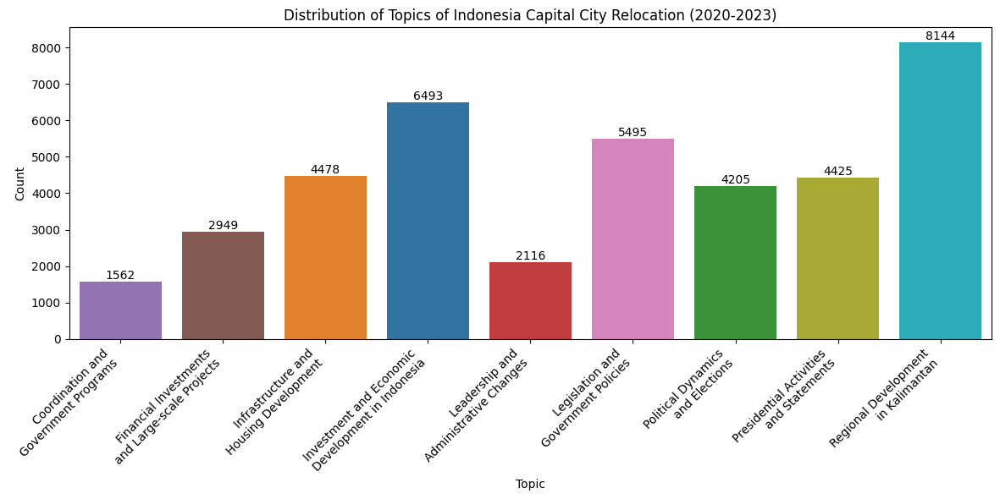

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define topic names and colors
topic_names = {
    'Topic_0': 'Investment and Economic\nDevelopment in Indonesia',
    'Topic_1': 'Infrastructure and\nHousing Development',
    'Topic_2': 'Political Dynamics\nand Elections',
    'Topic_3': 'Leadership and\nAdministrative Changes',
    'Topic_4': 'Coordination and\nGovernment Programs',
    'Topic_5': 'Financial Investments\nand Large-scale Projects',
    'Topic_6': 'Legislation and\nGovernment Policies',
    'Topic_7': 'Regional Development\nin Kalimantan',
    'Topic_8': 'Presidential Activities\nand Statements'
}

topic_indices = {v: int(k.split('_')[1]) for k, v in topic_names.items()}

# Define colors for the topics
topic_colors = {
    'Investment and Economic\nDevelopment in Indonesia': '#1f77b4',
    'Infrastructure and\nHousing Development': '#ff7f0e',
    'Political Dynamics\nand Elections': '#2ca02c',
    'Leadership and\nAdministrative Changes': '#d62728',
    'Coordination and\nGovernment Programs': '#9467bd',
    'Financial Investments\nand Large-scale Projects': '#8c564b',
    'Legislation and\nGovernment Policies': '#e377c2',
    'Regional Development\nin Kalimantan': '#17becf',
    'Presidential Activities\nand Statements': '#bcbd22'
}

# Map topic indices to names
df['topic_name'] = df['topic'].map(lambda x: list(topic_names.values())[x])

# Get topic counts
topic_counts = df['topic_name'].value_counts().sort_index()

# Create a bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x=topic_counts.index, y=topic_counts.values, palette=topic_colors)
plt.title('Distribution of Topics of Indonesia Capital City Relocation (2020-2023)')
plt.xlabel('Topic')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')

# Add value labels on top of each bar
for i, v in enumerate(topic_counts.values):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.tight_layout()
plt.show()


# OVERALL TONES

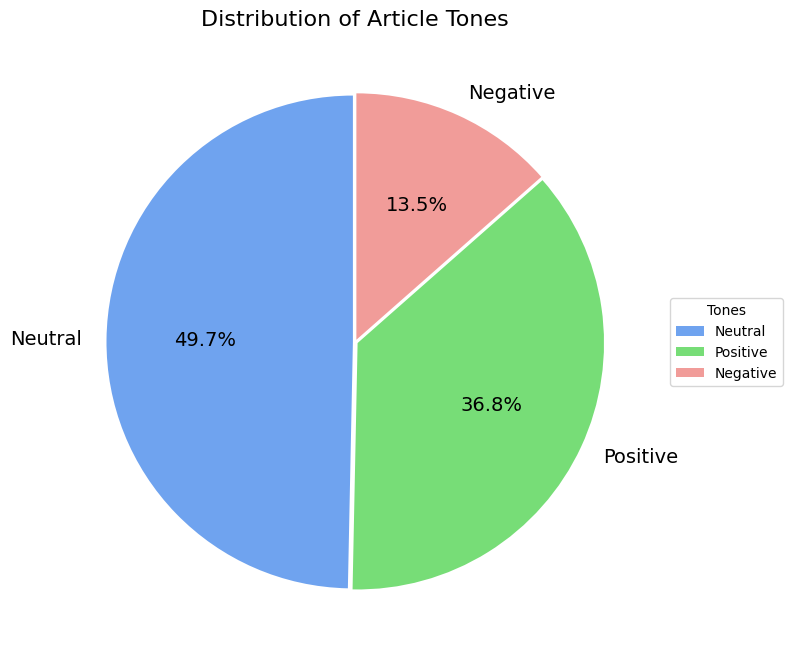

Number of articles per tone:
Tone
Neutral     19804
Positive    14678
Negative     5385
Name: count, dtype: int64


In [ ]:
import matplotlib.pyplot as plt

# Count the occurrences of each tone
tone_counts = df['Tone'].value_counts()

# Define colors for the pie chart
colors = ['#6fa3ef', '#77dd77', '#f19c99']  # Different shades of blue, green, and red

# Define explode values to separate the slices
explode = (0.01, 0.01, 0.01)  # Slightly separate all slices

# Create the pie chart
plt.figure(figsize=(8, 8))
plt.pie(tone_counts, labels=tone_counts.index, autopct='%1.1f%%', startangle=90, colors=colors, explode=explode, shadow=False, textprops={'fontsize': 14})
plt.title('Distribution of Article Tones', fontsize=16)

# Add a legend
plt.legend(tone_counts.index, title="Tones", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.show()

# Print the number of articles for each tone
print("Number of articles per tone:")
print(tone_counts)


# OVERALL INFLUENCER


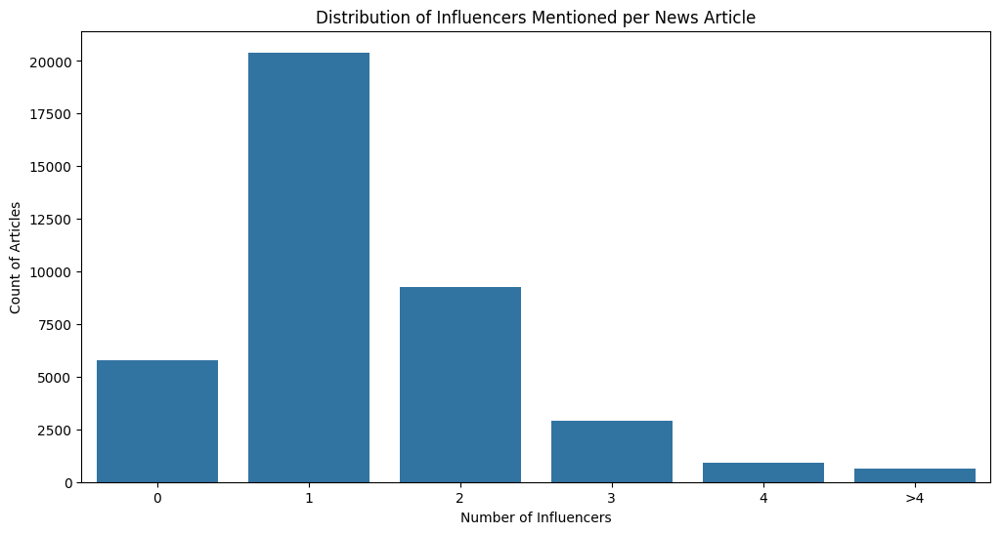

Influencer count statistics:
count    39867.000000
mean         1.376928
std          1.066011
min          0.000000
25%          1.000000
50%          1.000000
75%          2.000000
max         16.000000
Name: influencer_count, dtype: float64
Grouped influencer counts:
grouped_count
0     5781
1    20404
2     9254
3     2912
4      902
5      614
Name: count, dtype: int64
Percentage of articles in each group:
grouped_count
0    14.500715
1    51.180174
2    23.212181
3     7.304287
4     2.262523
5     1.540121
Name: count, dtype: float64
Total number of articles with 5 or more influencers:
614


In [155]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Read the CSV file
df = pd.read_csv('/content/drive/MyDrive/THESIS/READY_ALT.csv')

# Function to count influencers
def count_influencers(influencers):
    if influencers == "No influencers found":
        return 0
    return len(influencers.split(','))

# Apply the function to create a new column
df['influencer_count'] = df['Extracted_Influencers'].apply(count_influencers)

# Function to group counts greater than or equal to 5
def group_counts(count):
    if count == 0:
        return 0
    else:
        return min(count, 5)

df['grouped_count'] = df['influencer_count'].apply(group_counts)

# Calculate the value counts
influencer_counts = df['grouped_count'].value_counts().sort_index()

# Ensure all categories from 0 to 5 are present
for i in range(0, 6):
    if i not in influencer_counts.index:
        influencer_counts[i] = 0

# Sort the index to make sure it's in the correct order
influencer_counts = influencer_counts.sort_index()

# Create a bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x=influencer_counts.index, y=influencer_counts.values)
plt.title('Distribution of Influencers Mentioned per News Article')
plt.xlabel('Number of Influencers')
plt.ylabel('Count of Articles')
plt.xticks(range(6), ['0', '1', '2', '3', '4', '>4'])
plt.show()

# Print some statistics
print("Influencer count statistics:")
print(df['influencer_count'].describe())

print("Grouped influencer counts:")
print(influencer_counts)

print("Percentage of articles in each group:")
percentage = (influencer_counts / len(df)) * 100
print(percentage)

print("Total number of articles with 5 or more influencers:")
print(df[df['influencer_count'] >= 5].shape[0])


# MEDIA LANDSCAPE

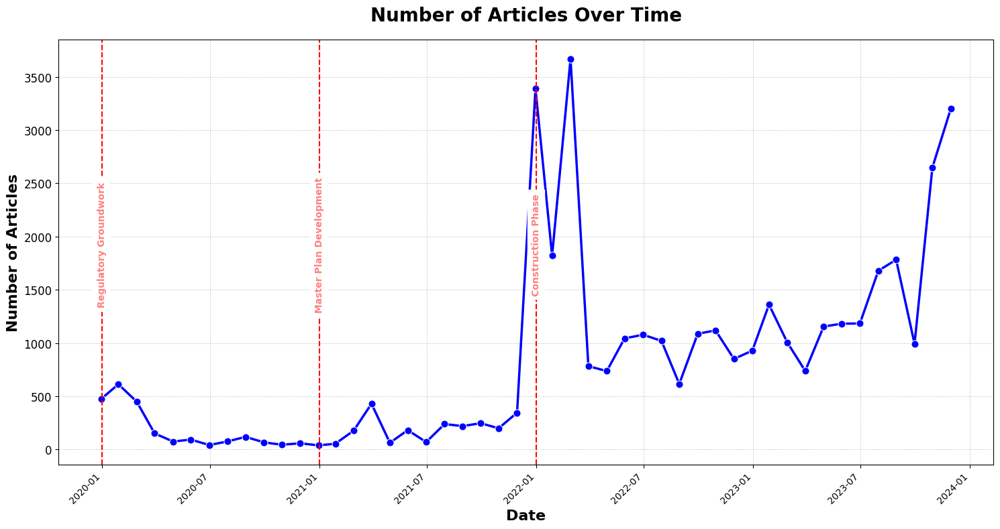

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.dates import YearLocator, DateFormatter

# Ensure the 'Date' column is in datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Set 'Date' as the index
df.set_index('Date', inplace=True)

# Filter data to ensure it only includes dates up to December 2023
#df = df.loc[:'2023-12']

# Group by month to ensure proper alignment of data points
monthly_counts = df.resample('M').size()

# Offset the data points by one month earlier
monthly_counts.index = monthly_counts.index - pd.DateOffset(months=1)

# Plot the number of articles over time with enhanced aesthetics
plt.figure(figsize=(15, 8))
sns.lineplot(data=monthly_counts, marker='o', color='b', linewidth=2.5, markersize=8)
plt.title('Number of Articles Over Time', fontsize=20, weight='bold', pad=20)
plt.xlabel('Date', fontsize=16, weight='bold')
plt.ylabel('Number of Articles', fontsize=16, weight='bold')
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
plt.xticks(rotation=45, ha='right')
plt.yticks(fontsize=12)

# Highlight key events with enhanced annotations
key_events = {
    '2020-02': 'Regulatory Groundwork',
    '2021-02': 'Master Plan Development',
    '2022-02': 'Construction Phase'
}

for date, event in key_events.items():
    event_date = pd.to_datetime(date) - pd.DateOffset(months=1)  # Adjust annotation position
    plt.axvline(event_date, color='red', linestyle='--', linewidth=1.5)
    plt.annotate(event, xy=(event_date, plt.ylim()[1] / 2), xytext=(event_date, plt.ylim()[1] / 2),
                 rotation=90, verticalalignment='center', fontsize=10, color='red', ha='center',
                 backgroundcolor='white', weight='bold', alpha=0.5)

# Customize the layout and save the plot
plt.tight_layout()

plt.show()


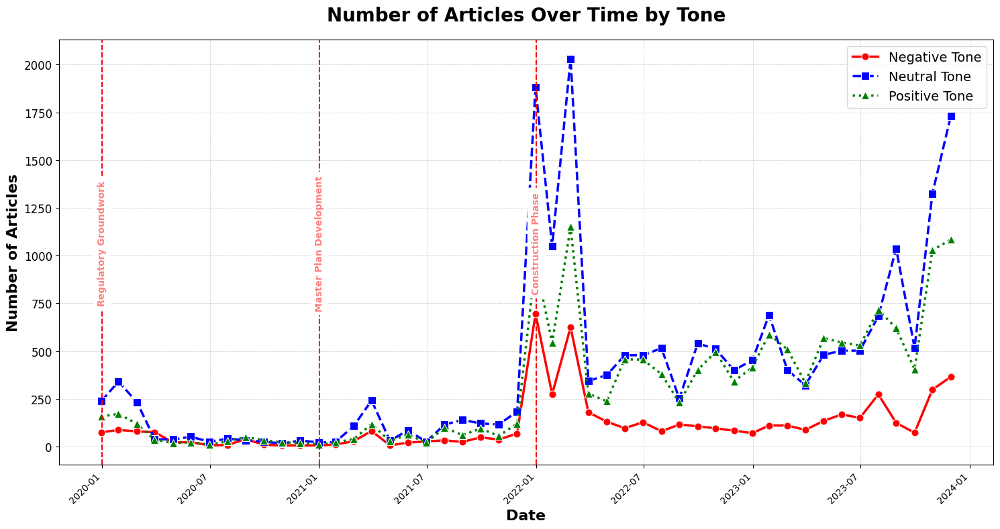

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.dates import YearLocator, DateFormatter

df=pd.read_csv('/content/drive/MyDrive/THESIS/READY.csv')

# Ensure the 'Date' column is in datetime format, specifying the format and dayfirst=True
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y', dayfirst=True)

# Set 'Date' as the index
df.set_index('Date', inplace=True)

# Assuming 'Tone' column exists with values 'positive', 'neutral', 'negative'
# Group by month and tone
monthly_counts = df.groupby([pd.Grouper(freq='M'), 'Tone']).size().unstack(fill_value=0)

# Offset the data points by one month earlier
monthly_counts.index = monthly_counts.index - pd.DateOffset(months=1)

# Plot the number of articles over time with enhanced aesthetics
plt.figure(figsize=(15, 8))

# Plotting each tone with different styles and colors, explicitly specifying labels
line_negative = sns.lineplot(data=monthly_counts['Negative'], marker='o', color='red', linewidth=2.5, markersize=8, linestyle='-', label='Negative Tone')
line_neutral = sns.lineplot(data=monthly_counts['Neutral'], marker='s', color='blue', linewidth=2.5, markersize=8, linestyle='--', label='Neutral Tone')
line_positive = sns.lineplot(data=monthly_counts['Positive'], marker='^', color='green', linewidth=2.5, markersize=8, linestyle=':', label='Positive Tone')

# Add legend
plt.legend(fontsize=14)

# Add titles and labels
plt.title('Number of Articles Over Time by Tone', fontsize=20, weight='bold', pad=20)
plt.xlabel('Date', fontsize=16, weight='bold')
plt.ylabel('Number of Articles', fontsize=16, weight='bold')

# Add grid
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
plt.xticks(rotation=45, ha='right')
plt.yticks(fontsize=12)

# Highlight key events with enhanced annotations
key_events = {
    '2020-02': 'Regulatory Groundwork',
    '2021-02': 'Master Plan Development',
    '2022-02': 'Construction Phase'
}

for date, event in key_events.items():
    event_date = pd.to_datetime(date) - pd.DateOffset(months=1)  # Adjust annotation position
    plt.axvline(event_date, color='red', linestyle='--', linewidth=1.5)
    plt.annotate(event, xy=(event_date, plt.ylim()[1] / 2), xytext=(event_date, plt.ylim()[1] / 2),
                 rotation=90, verticalalignment='center', fontsize=10, color='red', ha='center',
                 backgroundcolor='white', weight='bold', alpha=0.5)

# Customize the layout and save the plot
plt.tight_layout()

plt.show()


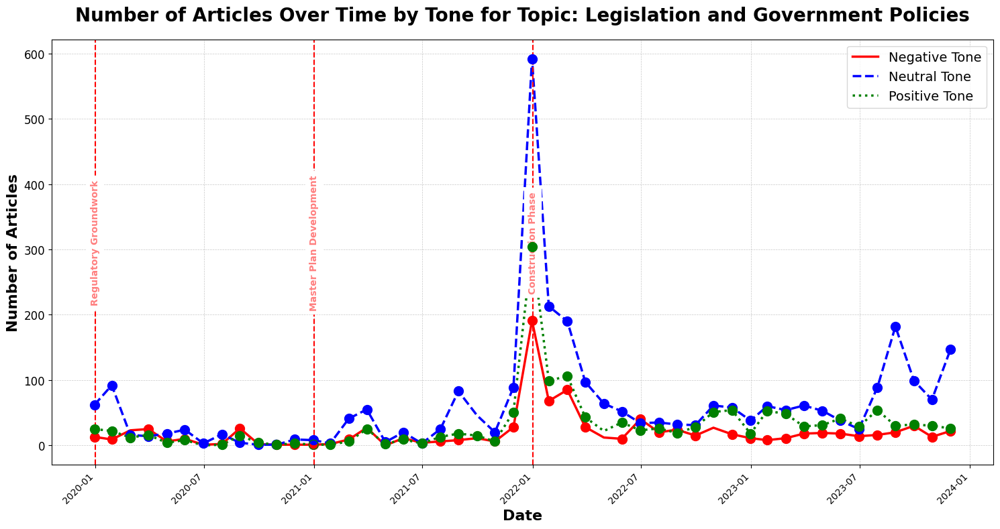

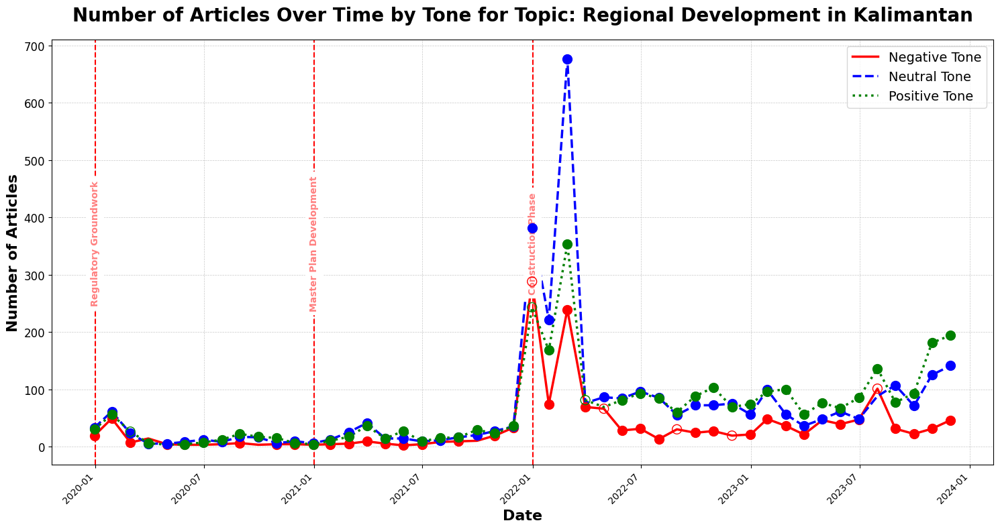

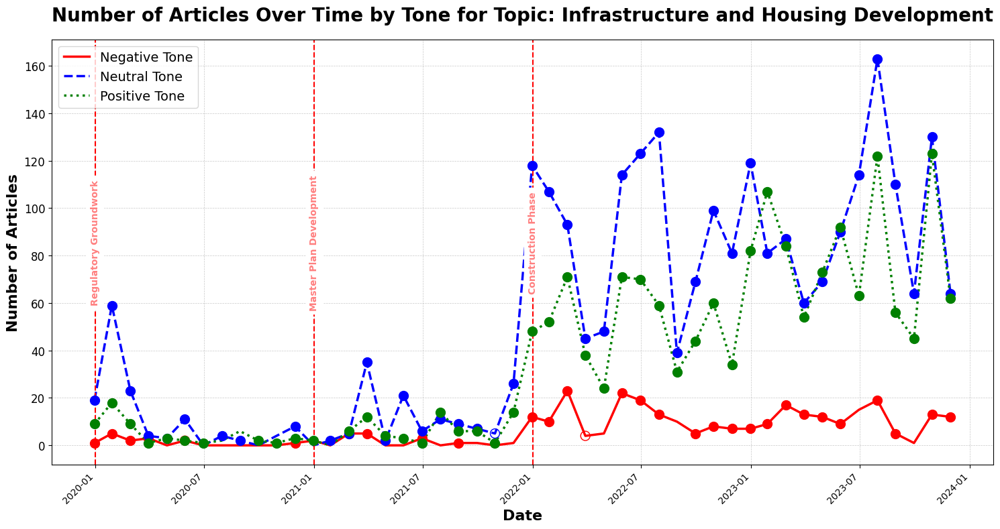

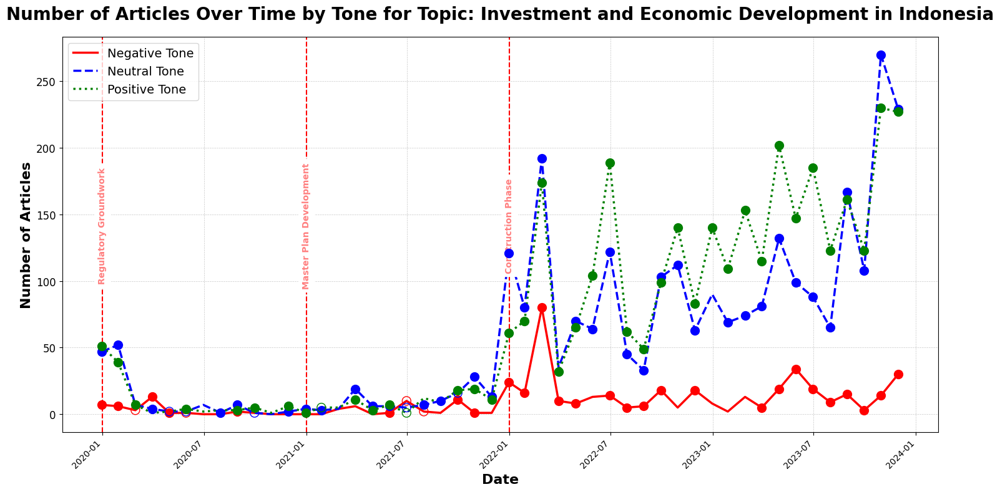

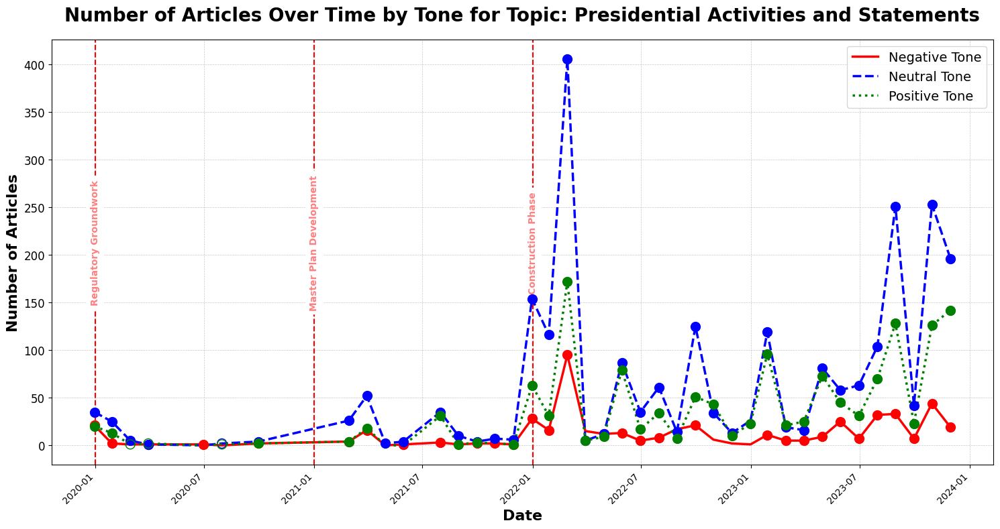

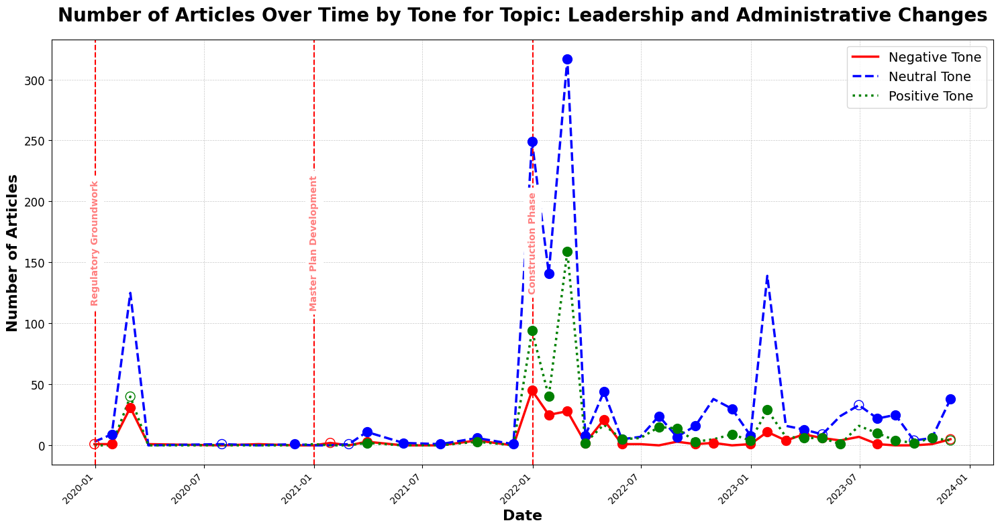

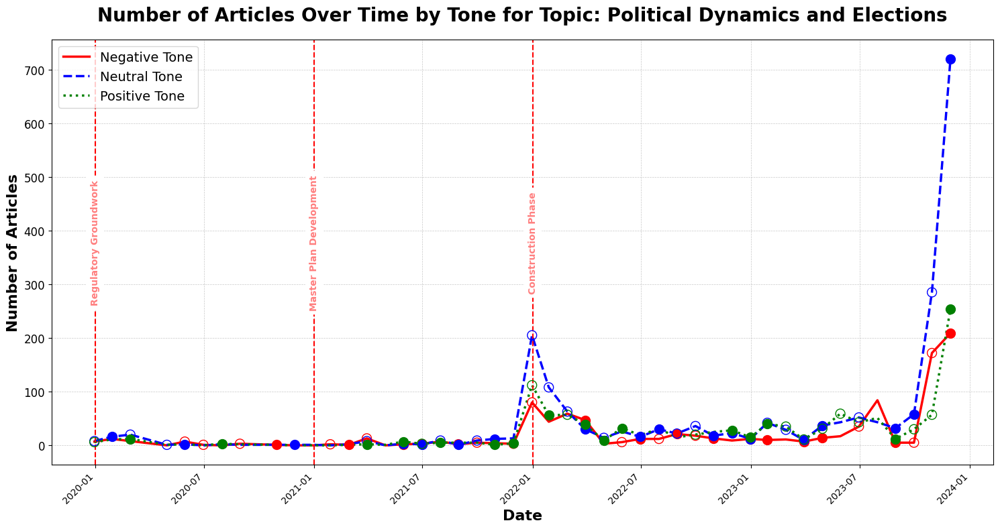

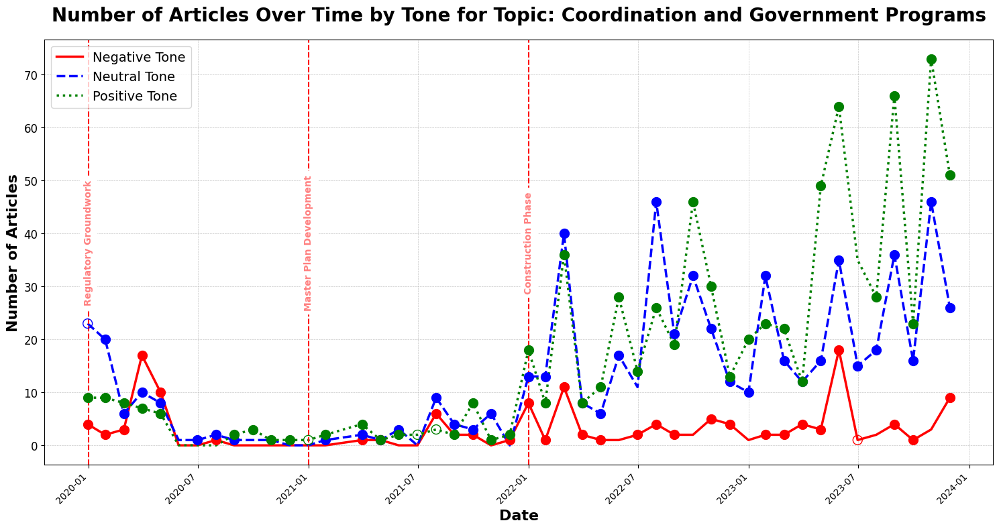

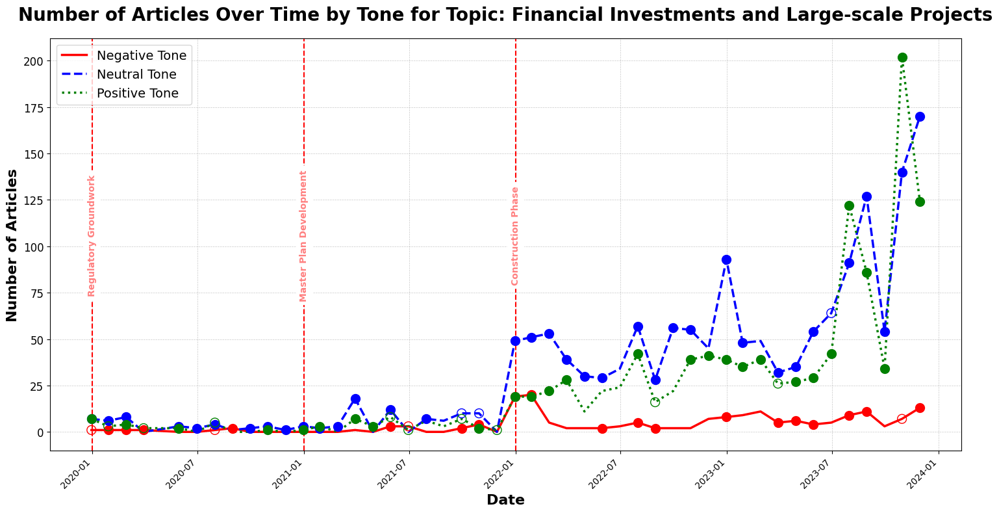

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
df = pd.read_csv('/content/drive/MyDrive/THESIS/READY.csv')

# Ensure the 'Date' column is in datetime format
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y', dayfirst=True)

# Convert bias_score to numeric, coerce errors to NaN
df['bias_score'] = pd.to_numeric(df['bias_score'], errors='coerce')

# Handle NaN values, e.g., by filling them with 0
df['bias_score'].fillna(0, inplace=True)

# Set 'Date' as the index
df.set_index('Date', inplace=True)

# List of unique topics
topics = df['topic_name'].unique()

# Function to categorize bias
def categorize_bias(bias_score):
    if bias_score < 0:
        return 'Non-Government Prevalent'
    elif bias_score > 0:
        return 'Government Prevalent'
    else:
        return 'Neutral'

# Apply the categorization
df['bias_category'] = df['bias_score'].apply(categorize_bias)

for topic in topics:
    plt.figure(figsize=(15, 8))

    # Filter the dataframe by topic
    df_topic = df[df['topic_name'] == topic]

    # Group by month and tone, categorize the bias
    monthly_counts = df_topic.groupby([pd.Grouper(freq='M'), 'Tone']).size().unstack(fill_value=0)
    monthly_counts.index = monthly_counts.index - pd.DateOffset(months=1)

    monthly_bias_categories = df_topic.groupby([pd.Grouper(freq='M'), 'Tone'])['bias_category'].apply(lambda x: x.mode()[0]).unstack(fill_value='Neutral')

    # Plotting each tone with different styles and colors
    sns.lineplot(data=monthly_counts['Negative'], color='red', linewidth=2.5, linestyle='-', label='Negative Tone')
    sns.lineplot(data=monthly_counts['Neutral'], color='blue', linewidth=2.5, linestyle='--', label='Neutral Tone')
    sns.lineplot(data=monthly_counts['Positive'], color='green', linewidth=2.5, linestyle=':', label='Positive Tone')

    # Plotting the markers with different styles based on bias_category
    for i, date in enumerate(monthly_counts.index):
        if monthly_bias_categories['Negative'].iloc[i] == 'Non-Government Prevalent':
            plt.scatter(date, monthly_counts['Negative'].iloc[i], color='red', facecolors='none', edgecolors='red', s=100, zorder=5)
        elif monthly_bias_categories['Negative'].iloc[i] == 'Government Prevalent':
            plt.scatter(date, monthly_counts['Negative'].iloc[i], color='red', s=100, zorder=5)

        if monthly_bias_categories['Neutral'].iloc[i] == 'Non-Government Prevalent':
            plt.scatter(date, monthly_counts['Neutral'].iloc[i], color='blue', facecolors='none', edgecolors='blue', s=100, zorder=5)
        elif monthly_bias_categories['Neutral'].iloc[i] == 'Government Prevalent':
            plt.scatter(date, monthly_counts['Neutral'].iloc[i], color='blue', s=100, zorder=5)

        if monthly_bias_categories['Positive'].iloc[i] == 'Non-Government Prevalent':
            plt.scatter(date, monthly_counts['Positive'].iloc[i], color='green', facecolors='none', edgecolors='green', s=100, zorder=5)
        elif monthly_bias_categories['Positive'].iloc[i] == 'Government Prevalent':
            plt.scatter(date, monthly_counts['Positive'].iloc[i], color='green', s=100, zorder=5)

    # Add legend
    plt.legend(fontsize=14)

    # Add titles and labels
    plt.title(f'Number of Articles Over Time by Tone for Topic: {topic}', fontsize=20, weight='bold', pad=20)
    plt.xlabel('Date', fontsize=16, weight='bold')
    plt.ylabel('Number of Articles', fontsize=16, weight='bold')

    # Add grid
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    plt.xticks(rotation=45, ha='right')
    plt.yticks(fontsize=12)

    # Highlight key events with enhanced annotations (if you want the same key events)
    key_events = {
        '2020-02': 'Regulatory Groundwork',
        '2021-02': 'Master Plan Development',
        '2022-02': 'Construction Phase'
    }

    for date, event in key_events.items():
        event_date = pd.to_datetime(date) - pd.DateOffset(months=1)  # Adjust annotation position
        plt.axvline(event_date, color='red', linestyle='--', linewidth=1.5)
        plt.annotate(event, xy=(event_date, plt.ylim()[1] / 2), xytext=(event_date, plt.ylim()[1] / 2),
                     rotation=90, verticalalignment='center', fontsize=10, color='red', ha='center',
                     backgroundcolor='white', weight='bold', alpha=0.5)

    # Customize the layout and save the plot
    plt.tight_layout()
    plt.show()


# TOPIC FLUCTUATION

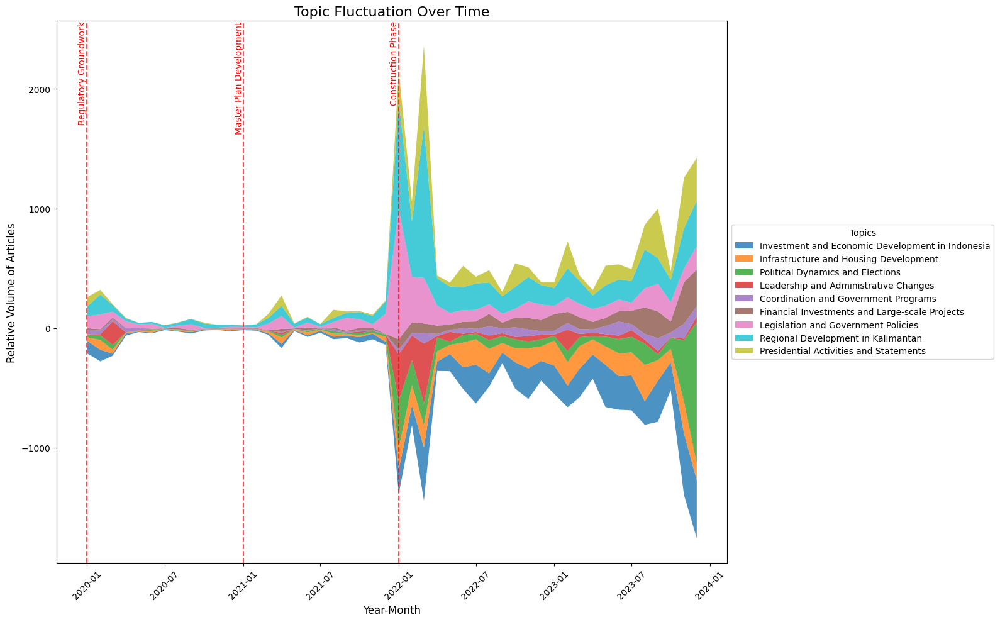

topic_name            YearMonth  Coordination and Government Programs  \
count                        48                             48.000000   
mean        2021-12-15 23:00:00                             32.541667   
min         2020-01-01 00:00:00                              0.000000   
25%         2020-12-24 06:00:00                              3.750000   
50%         2021-12-16 12:00:00                             25.500000   
75%         2022-12-08 18:00:00                             46.500000   
max         2023-12-01 00:00:00                            122.000000   
std                         NaN                             32.690006   

topic_name  Financial Investments and Large-scale Projects  \
count                                            48.000000   
mean                                             61.437500   
min                                               0.000000   
25%                                               4.750000   
50%                             

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

# Load the data
df = pd.read_csv('/content/drive/MyDrive/THESIS/READY.csv')

# Convert the 'Date' column to datetime format
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y')

# Extract year-month for grouping
df['YearMonth'] = df['Date'].dt.to_period('M')

# Group by 'YearMonth' and 'topic_name' to count occurrences
topic_trends = df.groupby(['YearMonth', 'topic_name']).size().unstack(fill_value=0)

# Reset index to make YearMonth a column
topic_trends = topic_trends.reset_index()

# Convert YearMonth to datetime for plotting
topic_trends['YearMonth'] = topic_trends['YearMonth'].dt.to_timestamp()

# Define a color mapping for the topics
topic_colors = {
    'Investment and Economic Development in Indonesia': '#1f77b4',
    'Infrastructure and Housing Development': '#ff7f0e',
    'Political Dynamics and Elections': '#2ca02c',
    'Leadership and Administrative Changes': '#d62728',
    'Coordination and Government Programs': '#9467bd',
    'Financial Investments and Large-scale Projects': '#8c564b',
    'Legislation and Government Policies': '#e377c2',
    'Regional Development in Kalimantan': '#17becf',
    'Presidential Activities and Statements': '#bcbd22'
}

# Create the streamgraph
plt.figure(figsize=(16, 10))
plt.style.use('default')  # Use default style for a clean look

# Create the streamgraph with custom colors
ax = plt.stackplot(topic_trends['YearMonth'],
                   [topic_trends[topic] for topic in topic_colors.keys()],
                   labels=topic_colors.keys(),
                   colors=topic_colors.values(),
                   baseline='wiggle',  # This creates the streamgraph effect
                   alpha=0.8)

# Highlight key events
events = {'2020-01': 'Regulatory Groundwork',
          '2021-01': 'Master Plan Development',
          '2022-01': 'Construction Phase'}

for date, label in events.items():
    plt.axvline(x=datetime.strptime(date, '%Y-%m'), color='red', linestyle='--', alpha=0.7)
    plt.text(datetime.strptime(date, '%Y-%m'), plt.ylim()[1], label, color='red', fontsize=10, ha='right', va='top', rotation=90)

plt.title('Topic Fluctuation Over Time', fontsize=16)
plt.xlabel('Year-Month', fontsize=12)
plt.ylabel('Relative Volume of Articles', fontsize=12)
plt.xticks(rotation=45)

# Adjust legend
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Topics')

plt.tight_layout()
plt.show()

# Print summary statistics
print(topic_trends.describe())

## Peak comparison

In [26]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from collections import Counter
import re

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/THESIS/READY.csv')

# Ensure the Date column is in datetime format
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
df['YearMonth'] = df['Date'].dt.to_period('M')

# Define common words such as "city", day names, etc that introduce noise to remove from the analysis
common_words = {'kota', 'bangun', 'joko', 'widodo', 'kalimantan', 'timur', 'proyek','selesai','temu','langsung', 'ekonomi',
                'menteri', 'perintah', 'indonesia', 'pindah', 'penajam', 'utara', 'otorita', 'kepala', 'rencana',
                'kerja', 'senin', 'selasa', 'rabu', 'kamis', 'jumat', 'sabtu', 'minggu','kait'}

# Tokenization function
def tokenize(text):
    # Convert to lowercase
    text = text.lower()
    # Remove punctuation and tokenize
    tokens = re.findall(r'\b\w+\b', text)
    return tokens

# Tokenize the text column and filter out common words
df['text_tokenised'] = df['Text'].apply(lambda text: [token for token in tokenize(text) if token not in common_words])

# Flatten the tokenized text, filter out common words, and calculate the frequency of each term
all_tokens = df['text_tokenised'].explode()
top_100_terms = all_tokens.value_counts().head(50).index.tolist()

# Filter the dataset to include only the rows with top 100 terms in text_tokenised
df['filtered_text_tokenised'] = df['text_tokenised'].apply(lambda tokens: [term for term in tokens if term in top_100_terms])

# Group by YearMonth and topic_name to count occurrences
topic_trends = df.groupby(['YearMonth', 'topic_name']).size().unstack(fill_value=0)

# Define key events
events = {'2020-01': 'Regulatory Groundwork (Phase 2)',
          '2021-01': 'Master Plan Development (Phase 3)',
          '2022-01': 'Construction Phase (Phase 4)'}

# Add the topic number mapping
topic_mapping = {
    'Investment and Economic Development in Indonesia': 1,
    'Infrastructure and Housing Development': 2,
    'Political Dynamics and Elections': 3,
    'Leadership and Administrative Changes': 4,
    'Coordination and Government Programs': 5,
    'Financial Investments and Large-scale Projects': 6,
    'Legislation and Government Policies': 7,
    'Regional Development in Kalimantan': 8,
    'Presidential Activities and Statements': 9
}

# Create a new column 'topic_num' based on the topic_name
df['topic_num'] = df['topic_name'].map(topic_mapping)

# Create a streamgraph
plt.figure(figsize=(14, 8))
colors = plt.cm.tab20.colors

for i, topic in enumerate(topic_trends.columns):
    plt.fill_between(topic_trends.index.astype(str),
                     topic_trends.iloc[:, :i].sum(axis=1),
                     topic_trends.iloc[:, :i+1].sum(axis=1),
                     label=topic, color=colors[i % len(colors)], alpha=0.7)

for event_date, event_name in events.items():
    plt.axvline(x=event_date, color='k', linestyle='--', linewidth=1)
    plt.text(event_date, plt.ylim()[1], event_name, rotation=90, verticalalignment='bottom')

plt.title('Monthly Fluctuation of Topics Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Number of Articles')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('streamgraph_topics.png')
plt.close()

# Identify spikes, prominent keywords, tones, and affiliations
spikes = []
for topic in topic_trends.columns:
    diff = topic_trends[topic].diff().fillna(0)
    spike_months = diff[diff > 10].index.to_timestamp()  # Convert Period to Timestamp for comparison

    # Group spikes within 3 months
    grouped_spikes = []
    current_group = []
    for i, month in enumerate(spike_months):
        if i == 0 or (month - spike_months[i - 1]) > pd.Timedelta('7D'):
            if current_group:
                grouped_spikes.append(current_group)
            current_group = [month]
        else:
            current_group.append(month)
    if current_group:
        grouped_spikes.append(current_group)

    # Analyze each grouped spike
    for group in grouped_spikes:
        group_months = '; '.join(month.strftime('%Y-%m') for month in group)
        group_keywords = []
        tone_counts = Counter()
        total_bias_score = 0

        for month in group:
            # Count tones
            tones = df[(df['YearMonth'] == month.to_period('M')) & (df['topic_name'] == topic)]['Tone']
            tone_counts.update(tones)

            # Sum bias_score
            total_bias_score += df[(df['YearMonth'] == month.to_period('M')) & (df['topic_name'] == topic)]['bias_score'].sum()

        # Determine the prominent tone
        prominent_tone = tone_counts.most_common(1)[0][0] if tone_counts else 'Unknown'

        # Filter keywords by prominent tone
        for month in group:
            keywords = df[(df['YearMonth'] == month.to_period('M')) &
                          (df['topic_name'] == topic) &
                          (df['Tone'] == prominent_tone)]['filtered_text_tokenised'].explode()
            group_keywords.append(Counter(keywords))

        # Find common keywords across all months in the group
        shared_keywords = group_keywords[0]
        for kw_counter in group_keywords[1:]:
            shared_keywords &= kw_counter

        # Remove common words from the shared keywords
        top_shared_keywords = [word for word, count in shared_keywords.most_common(50) if word not in common_words]

        # Determine the prominent key person affiliation based on bias_score
        if total_bias_score > 0:
            prominent_affiliation = 'Government'
        elif total_bias_score < 0:
            prominent_affiliation = 'Non-Government'
        else:
            prominent_affiliation = 'Neutral'

        spikes.append({
            'When the Spike Happens': group_months,
            'Topic': topic,
            'Topic Number': topic_mapping.get(topic, 'Unknown'),
            'Prominent Keywords': ', '.join(map(str, top_shared_keywords)),  # Ensure all items are strings
            'Prominent Tone': prominent_tone,
            'Prominent Key Person Affiliation': prominent_affiliation
        })

# Convert spikes data to DataFrame
spikes_df = pd.DataFrame(spikes)

# Display the simplified horizontal table
print(spikes_df)

# Optionally, save to a CSV file
spikes_df.to_csv('spike_analysis_simplified_with_topic_num.csv', index=False)

print("Streamgraph and spike analysis complete. Check the generated image for the streamgraph and the CSV for the simplified spike analysis.")


    When the Spike Happens                                 Topic  \
0                  2020-04  Coordination and Government Programs   
1                  2021-08  Coordination and Government Programs   
2                  2022-01  Coordination and Government Programs   
3                  2022-03  Coordination and Government Programs   
4                  2022-06  Coordination and Government Programs   
..                     ...                                   ...   
126                2023-05    Regional Development in Kalimantan   
127                2023-07    Regional Development in Kalimantan   
128                2023-08    Regional Development in Kalimantan   
129                2023-11    Regional Development in Kalimantan   
130                2023-12    Regional Development in Kalimantan   

     Topic Number                                 Prominent Keywords  \
0               5  investasi, negara, ikn, kementerian, pembangun...   
1               5  negara, ri, ketua, u

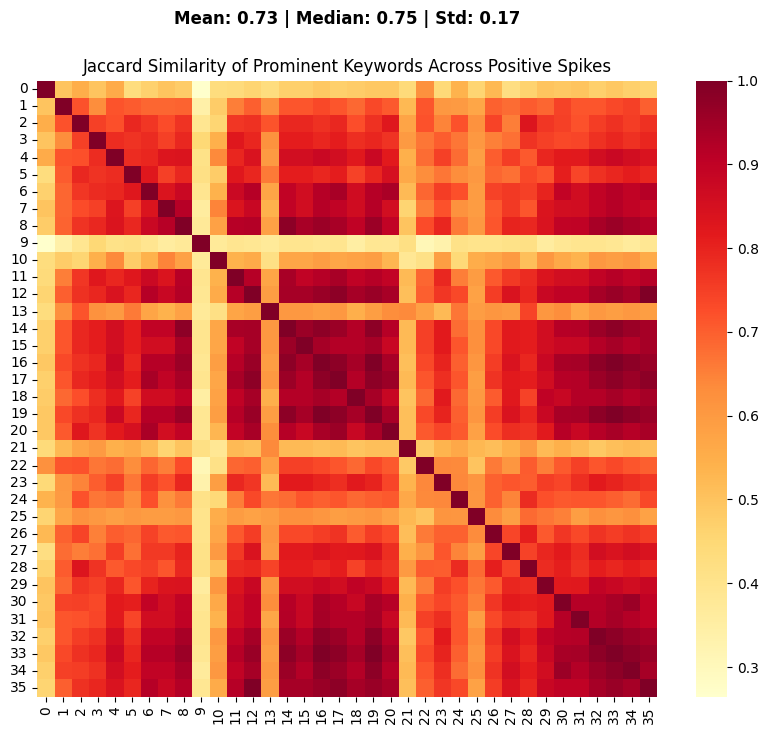

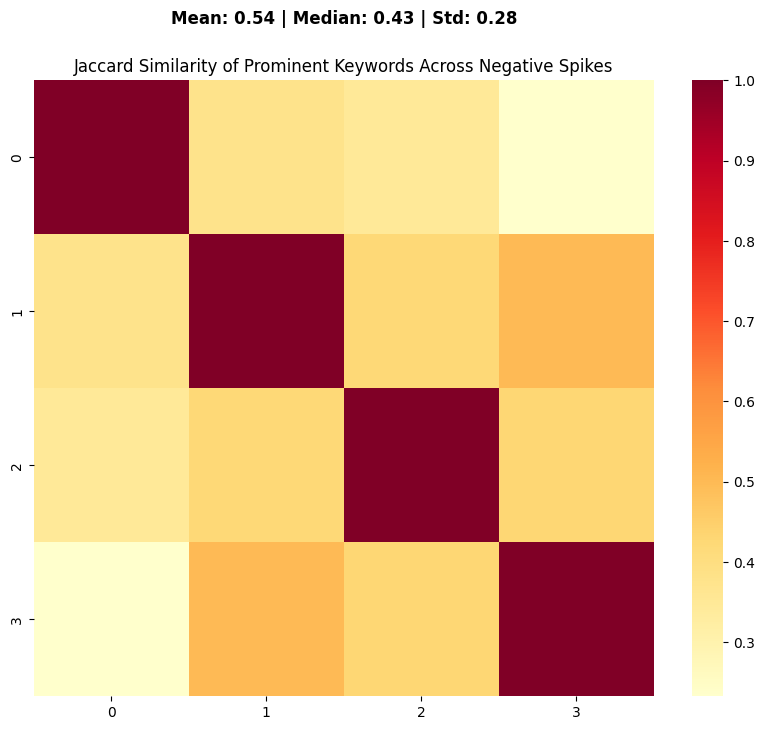

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Function to calculate Jaccard similarity between two sets of keywords
def jaccard_similarity(set1, set2):
    intersection = len(set(set1) & set(set2))
    union = len(set(set1) | set(set2))
    return intersection / union if union != 0 else 0

# Split the dataset into positive and negative tone dataframes
positive_spikes_df = spikes_df[spikes_df['Prominent Tone'] == 'Positive']
negative_spikes_df = spikes_df[spikes_df['Prominent Tone'] == 'Negative']

# Extract keywords lists
positive_keywords = positive_spikes_df['Prominent Keywords'].apply(lambda x: x.split(', '))
negative_keywords = negative_spikes_df['Prominent Keywords'].apply(lambda x: x.split(', '))

# Initialize matrices for Jaccard similarity
positive_jaccard_matrix = np.zeros((len(positive_keywords), len(positive_keywords)))
negative_jaccard_matrix = np.zeros((len(negative_keywords), len(negative_keywords)))

# Calculate Jaccard similarity for positive spikes
for i in range(len(positive_keywords)):
    for j in range(len(positive_keywords)):
        positive_jaccard_matrix[i, j] = jaccard_similarity(positive_keywords.iloc[i], positive_keywords.iloc[j])

# Calculate Jaccard similarity for negative spikes
for i in range(len(negative_keywords)):
    for j in range(len(negative_keywords)):
        negative_jaccard_matrix[i, j] = jaccard_similarity(negative_keywords.iloc[i], negative_keywords.iloc[j])

# Calculate the statistics for Jaccard similarity
average_positive_jaccard = np.mean(positive_jaccard_matrix)
median_positive_jaccard = np.median(positive_jaccard_matrix)
std_positive_jaccard = np.std(positive_jaccard_matrix)

average_negative_jaccard = np.mean(negative_jaccard_matrix)
median_negative_jaccard = np.median(negative_jaccard_matrix)
std_negative_jaccard = np.std(negative_jaccard_matrix)

# Plotting the heatmap for Positive Tone Jaccard similarity
plt.figure(figsize=(10, 8))
sns.heatmap(positive_jaccard_matrix, cmap='YlOrRd', cbar=True)
plt.title('Jaccard Similarity of Prominent Keywords Across Positive Spikes')
# Add the average, median, and standard deviation inside the plot
plt.text(0.5, 1.1, f'Mean: {average_positive_jaccard:.2f} | Median: {median_positive_jaccard:.2f} | Std: {std_positive_jaccard:.2f}',
         horizontalalignment='center', verticalalignment='center',
         transform=plt.gca().transAxes, fontsize=12, color='black', fontweight='bold')
plt.show()

# Plotting the heatmap for Negative Tone Jaccard similarity
plt.figure(figsize=(10, 8))
sns.heatmap(negative_jaccard_matrix, cmap='YlOrRd', cbar=True)
plt.title('Jaccard Similarity of Prominent Keywords Across Negative Spikes')
# Add the average, median, and standard deviation inside the plot
plt.text(0.5, 1.1, f'Mean: {average_negative_jaccard:.2f} | Median: {median_negative_jaccard:.2f} | Std: {std_negative_jaccard:.2f}',
         horizontalalignment='center', verticalalignment='center',
         transform=plt.gca().transAxes, fontsize=12, color='black', fontweight='bold')
plt.show()


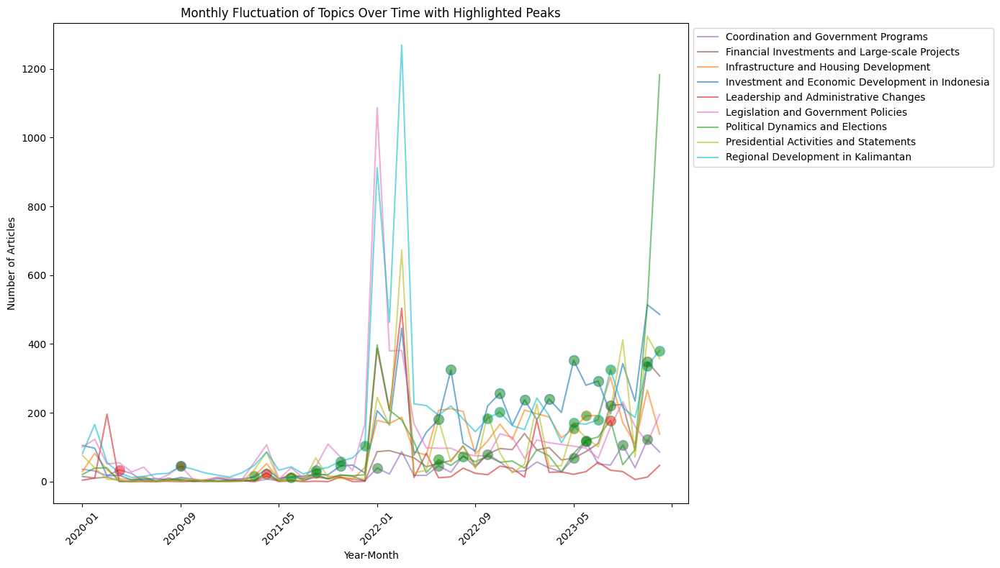

In [28]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from collections import Counter
import re

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/THESIS/READY.csv')

# Ensure the Date column is in datetime format
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
df['YearMonth'] = df['Date'].dt.to_period('M')

# Define common words such as "city", day names, etc that introduce noise to remove from the analysis
common_words = {'kota', 'bangun', 'joko', 'widodo', 'kalimantan', 'timur', 'proyek','selesai','temu','langsung', 'ekonomi',
                'menteri', 'perintah', 'indonesia', 'pindah', 'penajam', 'utara', 'otorita', 'kepala', 'rencana',
                'kerja', 'senin', 'selasa', 'rabu', 'kamis', 'jumat', 'sabtu', 'minggu','kait'}

# Tokenization function
def tokenize(text):
    # Convert to lowercase
    text = text.lower()
    # Remove punctuation and tokenize
    tokens = re.findall(r'\b\w+\b', text)
    return tokens

# Tokenize the text column and filter out common words
df['text_tokenised'] = df['Text'].apply(lambda text: [token for token in tokenize(text) if token not in common_words])

# Flatten the tokenized text, filter out common words, and calculate the frequency of each term
all_tokens = df['text_tokenised'].explode()
top_100_terms = all_tokens.value_counts().head(50).index.tolist()

# Filter the dataset to include only the rows with top 100 terms in text_tokenised
df['filtered_text_tokenised'] = df['text_tokenised'].apply(lambda tokens: [term for term in tokens if term in top_100_terms])

# Group by YearMonth and topic_name to count occurrences
topic_trends = df.groupby(['YearMonth', 'topic_name']).size().unstack(fill_value=0)

# Define topic colors
topic_colors = {
    'Investment and Economic Development in Indonesia': '#1f77b4',
    'Infrastructure and Housing Development': '#ff7f0e',
    'Political Dynamics and Elections': '#2ca02c',
    'Leadership and Administrative Changes': '#d62728',
    'Coordination and Government Programs': '#9467bd',
    'Financial Investments and Large-scale Projects': '#8c564b',
    'Legislation and Government Policies': '#e377c2',
    'Regional Development in Kalimantan': '#17becf',
    'Presidential Activities and Statements': '#bcbd22'
}

# Create the line plot with highlighted peaks
plt.figure(figsize=(14, 8))

for topic in topic_trends.columns:
    plt.plot(topic_trends.index.astype(str), topic_trends[topic], label=topic, color=topic_colors[topic], alpha=0.6)

for _, row in spikes_df.iterrows():
    if row['Prominent Tone'] == 'Positive':
        color = 'green'
    elif row['Prominent Tone'] == 'Negative':
        color = 'red'
    else:
        continue  # Skip neutral peaks

    plt.scatter(
        row['When the Spike Happens'].split('; '),
        [topic_trends.at[pd.Period(m, freq='M'), row['Topic']] for m in row['When the Spike Happens'].split('; ')],
        color=color,
        edgecolor=topic_colors[row['Topic']],
        s=100,
        zorder=5,
        alpha=0.5  # Set the alpha for transparency
    )

# Set the x-axis to show only once every 6 months
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(nbins=len(topic_trends.index)//6))

plt.title('Monthly Fluctuation of Topics Over Time with Highlighted Peaks')
plt.xlabel('Year-Month')
plt.ylabel('Number of Articles')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


## Metrics of Difference

In [29]:
import pandas as pd
import numpy as np
from scipy.stats import entropy

# Function to calculate Gini coefficient
def gini_coefficient(array):
    array = np.sort(array)  # Sort the array
    index = np.arange(1, array.shape[0] + 1)  # Create index array
    n = array.shape[0]
    return (np.sum((2 * index - n - 1) * array)) / (n * np.sum(array))

# Filter positive and negative peaks
positive_spikes_df = spikes_df[spikes_df['Prominent Tone'] == 'Positive']
negative_spikes_df = spikes_df[spikes_df['Prominent Tone'] == 'Negative']

# Function to compute Gini, Entropy, and Variance
def compute_metrics(df, column_name):
    counts = df[column_name].value_counts()
    gini = gini_coefficient(counts.values)
    ent = entropy(counts)
    var = np.var(counts.values)
    return gini, ent, var

# Compute metrics for positive and negative peaks
positive_year_metrics = compute_metrics(positive_spikes_df, 'When the Spike Happens')
negative_year_metrics = compute_metrics(negative_spikes_df, 'When the Spike Happens')

positive_affiliation_metrics = compute_metrics(positive_spikes_df, 'Prominent Key Person Affiliation')
negative_affiliation_metrics = compute_metrics(negative_spikes_df, 'Prominent Key Person Affiliation')

positive_topic_metrics = compute_metrics(positive_spikes_df, 'Topic')
negative_topic_metrics = compute_metrics(negative_spikes_df, 'Topic')

# Combine results into a DataFrame
combined_results = pd.DataFrame({
    'Metric': ['Gini Coefficient', 'Entropy', 'Variance'],
    'Positive Year': positive_year_metrics,
    'Negative Year': negative_year_metrics,
    'Positive Affiliation': positive_affiliation_metrics,
    'Negative Affiliation': negative_affiliation_metrics,
    'Positive Topic Name': positive_topic_metrics,
    'Negative Topic Name': negative_topic_metrics
})

# Display the table
print(combined_results)

# Save the table to an Excel file
combined_results.to_excel('uniformity_metrics.xlsx', index=False)

print("The results have been saved to 'uniformity_metrics.xlsx'")

             Metric  Positive Year  Negative Year  Positive Affiliation  \
0  Gini Coefficient       0.261905       0.000000              0.416667   
1           Entropy       2.923784       1.386294              0.286836   
2          Variance       0.775510       0.000000            225.000000   

   Negative Affiliation  Positive Topic Name  Negative Topic Name  
0              0.000000             0.277778             0.166667  
1              0.693147             1.663786             1.039721  
2              0.000000             9.000000             0.222222  
The results have been saved to 'uniformity_metrics.xlsx'
